# Importing packages and data

In [ ]:
!pip install sktime==0.28.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.9/21.9 MB 76.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.1/130.1 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 93.0 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.5.2
    Uninstalling scikit-learn-1.5.2:
      Successfully uninstalled scikit-learn-1.5.2


In [ ]:
!pip install tensorflow==2.15.1

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 65.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 70.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 89.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 27.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 5.5 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: tensorboard
    Found existing installation

In [ ]:
!pip install pmdarima

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 42.9 MB/s eta 0:00:00


In [ ]:
!pip install keras-tuner --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 8.8 MB/s eta 0:00:00


In [ ]:
# Import libraries.
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
from datetime import datetime, timedelta
import warnings
import statsmodels.graphics.api as smgraphics
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.stattools import adfuller as adf

import lightgbm as lgb

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error

# Load the relevant helper functions from sktime.
from sktime.forecasting.compose import (TransformedTargetForecaster, make_reduction)
from sktime.forecasting.model_selection import (ExpandingWindowSplitter, ForecastingGridSearchCV)
from sktime.performance_metrics.forecasting import MeanAbsolutePercentageError
from sktime.forecasting.trend import PolynomialTrendForecaster
from sktime.transformations.series.detrend import Deseasonalizer, Detrender

import statsmodels.api as sm
from xgboost import XGBRegressor

# Import the package for hyperparameter tuning.
import hyperopt
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe

# Import the relevant libraries.
import tensorflow as tf
from tensorflow.keras.layers import Dense, LSTM, Dropout
from tensorflow.keras.models import Sequential
from sklearn.preprocessing import MinMaxScaler

# Import KerasTuner.
from kerastuner.tuners import RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters

from matplotlib.patches import Rectangle
from pmdarima.arima import auto_arima

import warnings

# Suppress specific warnings.
warnings.filterwarnings("ignore", category=FutureWarning)

# Suppress all warnings.
warnings.filterwarnings("ignore")
pd.set_option('display.width', None)

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
<ipython-input-5-f96ab83c8779>:41: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner.tuners import RandomSearch


In [ ]:
# Common Parameters
multi_step_lookback = 104
multi_step_forecast = 32
test_time_steps = 32

In [ ]:
isbnurl = '/content/sample_data/ISBN List.xlsx'
isbn_adult_fiction = pd.read_excel(isbnurl, sheet_name='F - Adult Fiction')
isbn_adult_non_fiction_specialist = pd.read_excel(isbnurl, sheet_name='S Adult Non-Fiction Specialist')
isbn_adult_non_fiction_trace = pd.read_excel(isbnurl, sheet_name='T Adult Non-Fiction Trade')
isbn_children_education = pd.read_excel(isbnurl, sheet_name="Y Children's, YA & Educational")

In [ ]:
isbn_adult_fiction.info()
isbn_adult_non_fiction_specialist.info()
isbn_adult_non_fiction_trace.info()
isbn_children_education.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125 entries, 0 to 124
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   ISBN                    125 non-null    int64         
 1   Title                   125 non-null    object        
 2   Author                  124 non-null    object        
 3   Imprint                 125 non-null    object        
 4   Publisher Group         125 non-null    object        
 5   RRP                     125 non-null    float64       
 6   Binding                 125 non-null    object        
 7   Publication Date        125 non-null    datetime64[ns]
 8   Product Class           125 non-null    object        
 9   Country of Publication  125 non-null    object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(7)
memory usage: 9.9+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125 entries, 0 to 124
Data columns (total 10

In [ ]:
display(isbn_adult_fiction.head())
display(isbn_adult_non_fiction_specialist.head())
display(isbn_adult_non_fiction_trace.head())
display(isbn_children_education.head())

,ISBN,Title,Author,Imprint,Publisher Group,RRP,Binding,Publication Date,Product Class,Country of Publication
0,9780330375252,Bridget Jones's Diary (Film Tie-in),"Fielding, Helen",Picador,Pan Macmillan Grp,8.99,Paperback,2001-03-23,F1.1 General & Literary Fiction,United Kingdom
1,9780140276336,White Teeth,"Smith, Zadie",Penguin Books Ltd,Penguin Grp,9.99,Paperback,2001-01-25,F1.1 General & Literary Fiction,United Kingdom
2,9780006512134,Man and Boy,"Parsons, Tony",HarperCollins Publishers,HarperCollins Grp,8.99,Paperback,2000-03-06,F1.1 General & Literary Fiction,United Kingdom
3,9780099280255,"Brethren,The","Grisham, John",Arrow Books,Random House Grp,6.99,Paperback,2000-12-27,"F2.1 Crime, Thriller & Adventure",United Kingdom
4,9780552998727,Marrying The Mistress:an irresistible and grip...,"Trollope, Joanna",Black Swan,Transworld Grp,10.99,Paperback,2001-02-01,F1.1 General & Literary Fiction,United Kingdom


,ISBN,Title,Author,Imprint,Publisher Group,RRP,Binding,Publication Date,Product Class,Country of Publication
0,9781858285511,"Rough Guide to the Internet,The:Rough Guides R...","Kennedy, Angus J.",Rough Guides,Rough Guides Grp,6.00,Paperback,2000-10-26,S10.1 Computing: Consumer Books ('Technical Tr...,United Kingdom
1,9780099286387,Geisha,"Dalby, Liza",Vintage,Random House Grp,12.99,Paperback,2000-09-28,S3.4 Gender Studies / Gay & Lesbian Studies,United Kingdom
2,9780521436809,English Grammar in Use With Answers:Reference ...,"Murphy, Raymond",Cambridge University Press,Cambridge U.P. Grp,13.00,Paperback,1994-01-28,S1.1T ELT Course Materials,United Kingdom
3,9780713996029,Fast Food Nation:What The All-American Meal is...,"Schlosser, Eric",Allen Lane,Penguin Grp,9.99,Paperback,2001-04-26,S4.6 Industrial Studies: General,United Kingdom
4,9781858287393,"Rough Guide to the Internet,The:Mini Rough Guides","Kennedy, Angus J.",Rough Guides,Rough Guides Grp,6.00,Paperback,2001-10-25,S10.1 Computing: Consumer Books ('Technical Tr...,United Kingdom


,ISBN,Title,Author,Imprint,Publisher Group,RRP,Binding,Publication Date,Product Class,Country of Publication
0,9780752837505,"Child Called It,A","Pelzer, Dave",Orion (an Imprint of The Orion Publishing Grou...,Orion Grp,6.99,Paperback,2009-04-16,T4.0A Autobiography: General,United Kingdom
1,9780718144845,Happy Days with the Naked Chef,"Oliver, Jamie",Michael Joseph,Penguin Grp,20.00,Hardback,2001-09-03,T16.0 Food & Drink: General,United Kingdom
2,9780007110919,Billy Connolly,"Stephenson, Pamela",HarperCollins Entertainment,HarperCollins Grp,17.99,Hardback,2001-10-01,T4.1 Biography: The Arts,United Kingdom
3,9780340766057,McCarthy's Bar:A Journey of Discovery in Ireland,"McCarthy, Pete",Sceptre,Hodder & Stoughton Grp,10.99,Paperback,2001-03-15,T8.5 Travel Writing,United Kingdom
4,9780851121246,Guinness World Records:2002,NaN,Guinness World Records,Guinness Publisher Group,18.00,Hardback,2001-09-28,T2.0 Encyclopedias & General Reference,United Kingdom


,ISBN,Title,Author,Imprint,Publisher Group,RRP,Binding,Publication Date,Product Class,Country of Publication
0,9780747550990,Harry Potter and the Goblet of Fire,"Rowling, J. K.",Bloomsbury Publishing PLC,Bloomsbury Grp,8.99,Paperback,2001-07-06,Y2.1 Children's Fiction,United Kingdom
1,9780747538486,Harry Potter and the Chamber of Secrets,"Rowling, J. K.",Bloomsbury Publishing PLC,Bloomsbury Grp,6.99,Paperback,1999-05-28,Y2.1 Children's Fiction,United Kingdom
2,9780747532743,Harry Potter and the Philosopher's Stone,"Rowling, J. K.",Bloomsbury Publishing PLC,Bloomsbury Grp,6.99,Paperback,1997-06-26,Y2.1 Children's Fiction,United Kingdom
3,9780747546290,Harry Potter and the Prisoner of Azkaban,"Rowling, J. K.",Bloomsbury Publishing PLC,Bloomsbury Grp,6.99,Paperback,2000-04-01,Y2.1 Children's Fiction,United Kingdom
4,9780747554660,Comic Relief: Fantastic Beasts and Where to Fi...,"Scamander, Newt & Rowling, J. K.",Obscurus Books,Bloomsbury Grp,2.50,Paperback,2001-03-12,Y2.2 Young Adult Fiction,United Kingdom


In [ ]:
# Concatenate the data from the 4 tabs
isbn_frames = [isbn_adult_fiction, isbn_adult_non_fiction_specialist, isbn_adult_non_fiction_trace, isbn_children_education]
isbn_all4 = pd.concat(isbn_frames)

In [ ]:
# Remove any duplicates and reset index.
isbn_all4 = isbn_all4.drop_duplicates()
isbn_all4.reset_index(inplace=True)

#Convert the ISBNs to a string value.
isbn_all4['ISBN'] = isbn_all4['ISBN'].astype("string")

In [ ]:
isbn_all4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   index                   500 non-null    int64         
 1   ISBN                    500 non-null    string        
 2   Title                   500 non-null    object        
 3   Author                  426 non-null    object        
 4   Imprint                 500 non-null    object        
 5   Publisher Group         500 non-null    object        
 6   RRP                     473 non-null    float64       
 7   Binding                 500 non-null    object        
 8   Publication Date        500 non-null    datetime64[ns]
 9   Product Class           500 non-null    object        
 10  Country of Publication  500 non-null    object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(7), string(1)
memory usage: 43.1+ KB


In [ ]:
isbn_all4.head()

,index,ISBN,Title,Author,Imprint,Publisher Group,RRP,Binding,Publication Date,Product Class,Country of Publication
0,0,9780330375252,Bridget Jones's Diary (Film Tie-in),"Fielding, Helen",Picador,Pan Macmillan Grp,8.99,Paperback,2001-03-23,F1.1 General & Literary Fiction,United Kingdom
1,1,9780140276336,White Teeth,"Smith, Zadie",Penguin Books Ltd,Penguin Grp,9.99,Paperback,2001-01-25,F1.1 General & Literary Fiction,United Kingdom
2,2,9780006512134,Man and Boy,"Parsons, Tony",HarperCollins Publishers,HarperCollins Grp,8.99,Paperback,2000-03-06,F1.1 General & Literary Fiction,United Kingdom
3,3,9780099280255,"Brethren,The","Grisham, John",Arrow Books,Random House Grp,6.99,Paperback,2000-12-27,"F2.1 Crime, Thriller & Adventure",United Kingdom
4,4,9780552998727,Marrying The Mistress:an irresistible and grip...,"Trollope, Joanna",Black Swan,Transworld Grp,10.99,Paperback,2001-02-01,F1.1 General & Literary Fiction,United Kingdom


In [ ]:
booksalesurl = '/content/sample_data/UK Weekly Trended Timeline from 200101_202429.xlsx'
booksales_adult_fiction = pd.read_excel(booksalesurl, sheet_name='F Adult Fiction')
booksales_adult_non_fiction_specialist = pd.read_excel(booksalesurl, sheet_name='S Adult Non-Fiction Specialist')
booksales_adult_non_fiction_trade = pd.read_excel(booksalesurl, sheet_name='T Adult Non-Fiction Trade')
booksales_children_education = pd.read_excel(booksalesurl, sheet_name="Y Children's, YA & Educational")

In [ ]:
booksales_adult_fiction.info()
booksales_adult_non_fiction_specialist.info()
booksales_adult_non_fiction_trade.info()
booksales_children_education.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73767 entries, 0 to 73766
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   ISBN             73767 non-null  int64         
 1   Title            73767 non-null  object        
 2   Author           73500 non-null  object        
 3   Interval         73767 non-null  int64         
 4   End Date         73767 non-null  datetime64[ns]
 5   Volume           73767 non-null  int64         
 6   Value            73767 non-null  float64       
 7   ASP              73683 non-null  float64       
 8   RRP              73767 non-null  float64       
 9   Binding          73767 non-null  object        
 10  Imprint          73767 non-null  object        
 11  Publisher Group  73767 non-null  object        
 12  Product Class    73767 non-null  object        
dtypes: datetime64[ns](1), float64(3), int64(3), object(6)
memory usage: 7.3+ MB
<class 'pandas.

In [ ]:
# Concatenate the data from the 4 tabs
booksales_frames = [booksales_adult_fiction, booksales_adult_non_fiction_specialist, booksales_adult_non_fiction_trade, booksales_children_education]
booksales_all4 = pd.concat(booksales_frames)

In [ ]:
# Remove any duplicates and reset index.
booksales_all4 = booksales_all4.drop_duplicates()
booksales_all4.reset_index(inplace=True)

In [ ]:
#Convert the ISBNs to a string value.
booksales_all4['ISBN'] = booksales_all4['ISBN'].astype("string")

#Convert date to datetime object.
booksales_all4['End Date'] = pd.to_datetime(booksales_all4['End Date'])

In [ ]:
booksales_all4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227224 entries, 0 to 227223
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   index            227224 non-null  int64         
 1   ISBN             227224 non-null  string        
 2   Title            227224 non-null  object        
 3   Author           212345 non-null  object        
 4   Interval         227224 non-null  int64         
 5   End Date         227224 non-null  datetime64[ns]
 6   Volume           227224 non-null  int64         
 7   Value            227224 non-null  float64       
 8   ASP              226881 non-null  float64       
 9   RRP              221262 non-null  float64       
 10  Binding          227224 non-null  object        
 11  Imprint          227224 non-null  object        
 12  Publisher Group  227224 non-null  object        
 13  Product Class    227224 non-null  object        
dtypes: datetime64[ns](1)

# Conducting initial data investigation

In [ ]:
booksales_all4.head()

,index,ISBN,Title,Author,Interval,End Date,Volume,Value,ASP,RRP,Binding,Imprint,Publisher Group,Product Class
0,0,9780002261821,One For My Baby,"Parsons, Tony",200513,2005-04-02,1,15.99,15.99,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction
1,1,9780002261821,One For My Baby,"Parsons, Tony",200503,2005-01-22,1,15.99,15.99,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction
2,2,9780002261821,One For My Baby,"Parsons, Tony",200422,2004-05-29,1,11.19,11.19,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction
3,3,9780002261821,One For My Baby,"Parsons, Tony",200415,2004-04-10,2,27.18,13.59,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction
4,4,9780002261821,One For My Baby,"Parsons, Tony",200404,2004-01-24,2,22.48,11.24,15.99,Hardback,HarperCollins Publishers,HarperCollins Grp,F1.1 General & Literary Fiction


In [ ]:
isbn_beyondJuly24 = booksales_all4[booksales_all4["End Date"] > "2024-07-01"]["ISBN"]
isbn_beyondJuly24 = isbn_beyondJuly24.drop_duplicates()

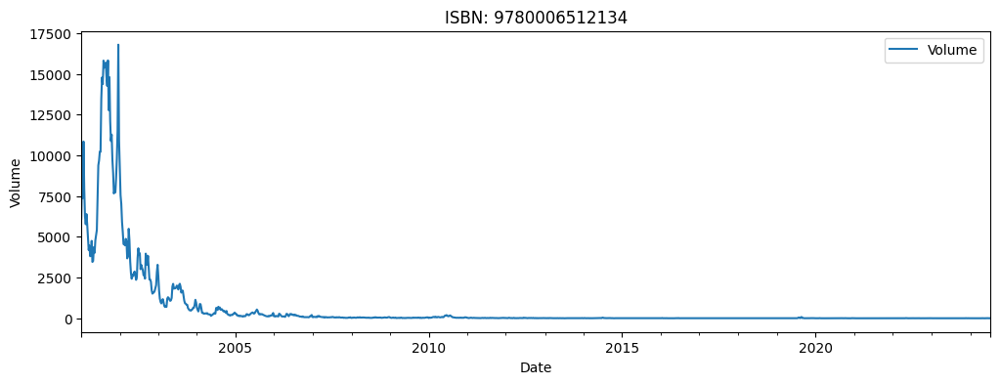

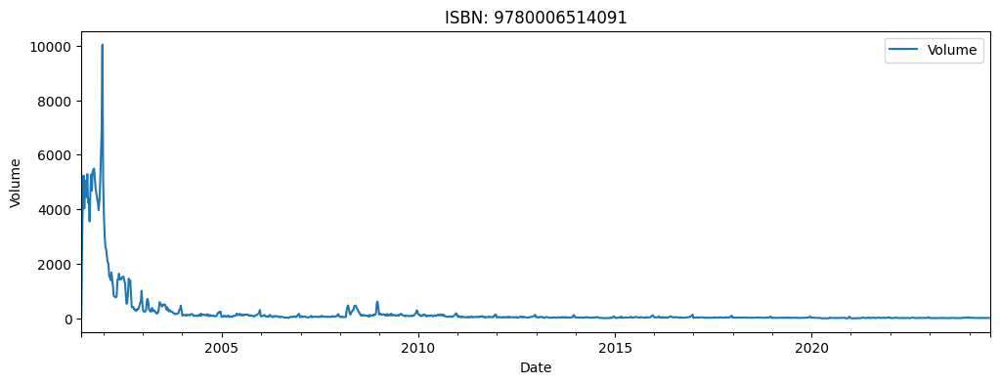

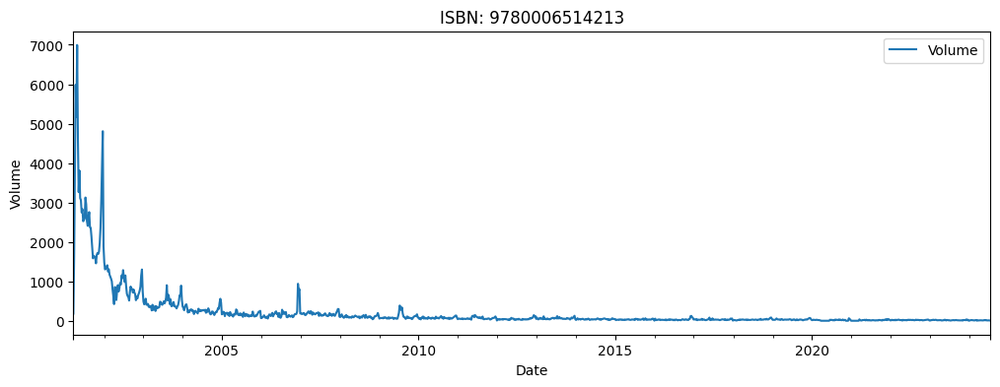

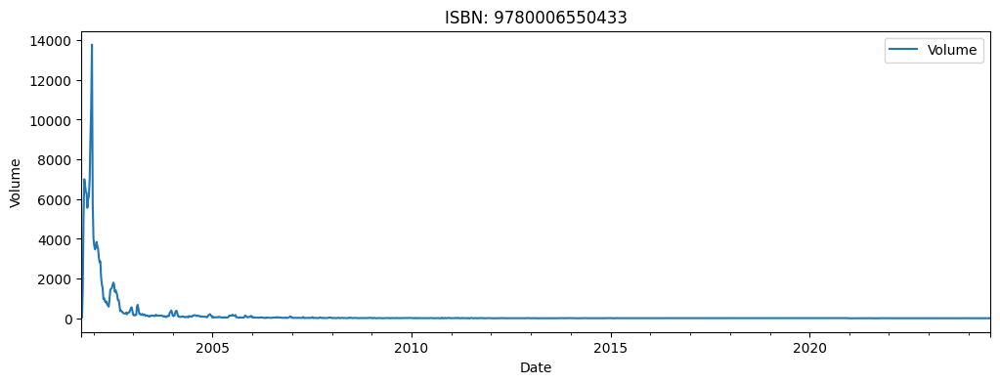

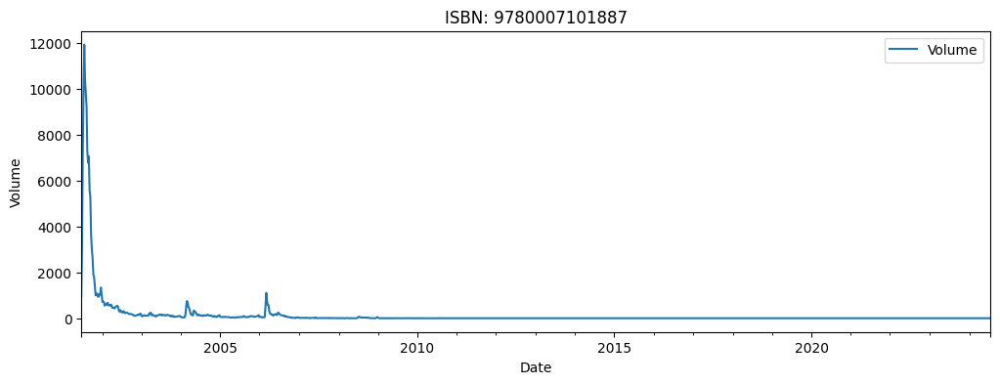

...

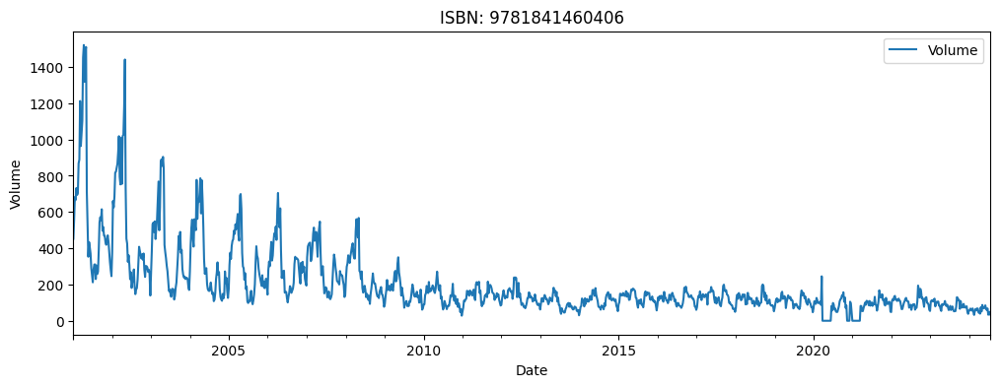

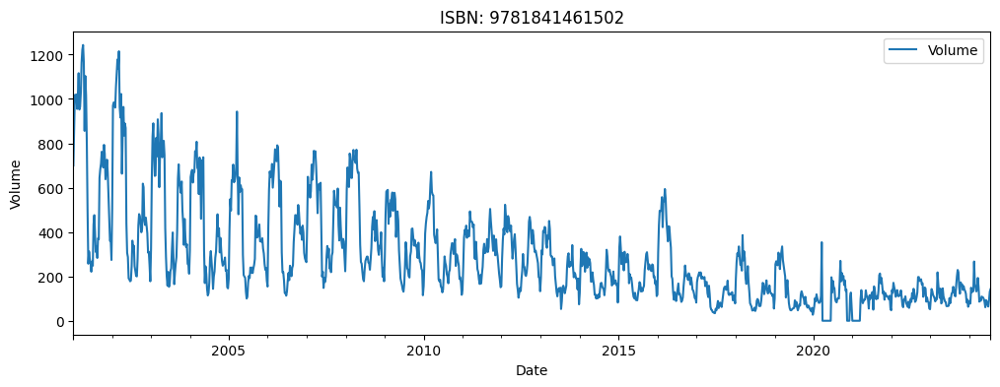

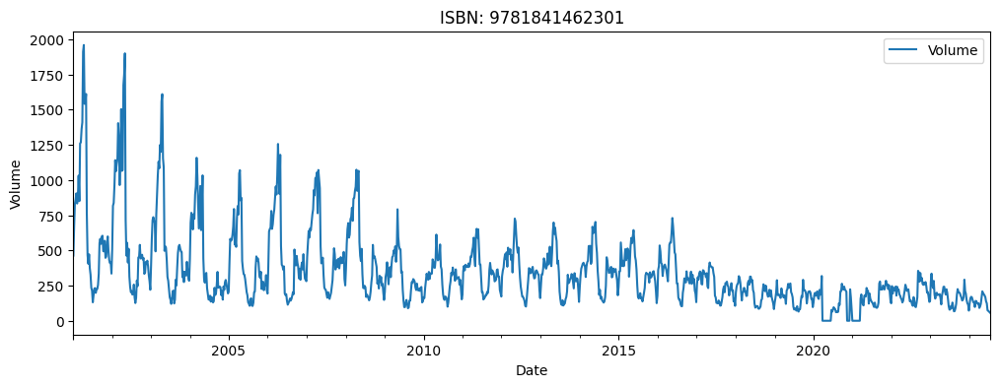

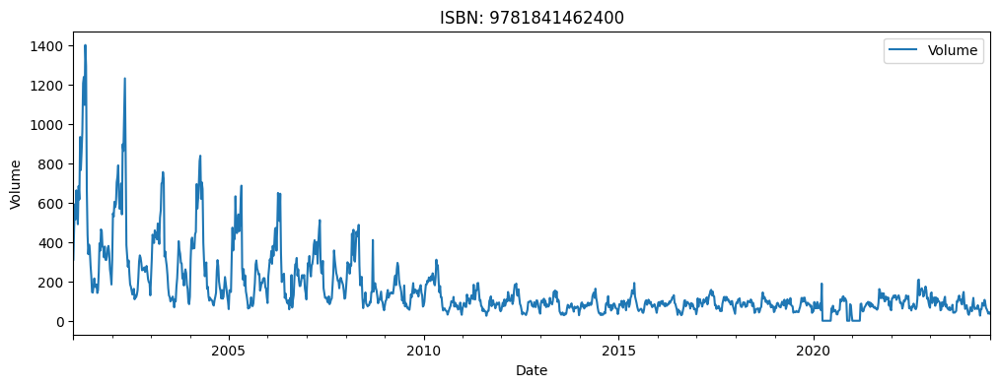

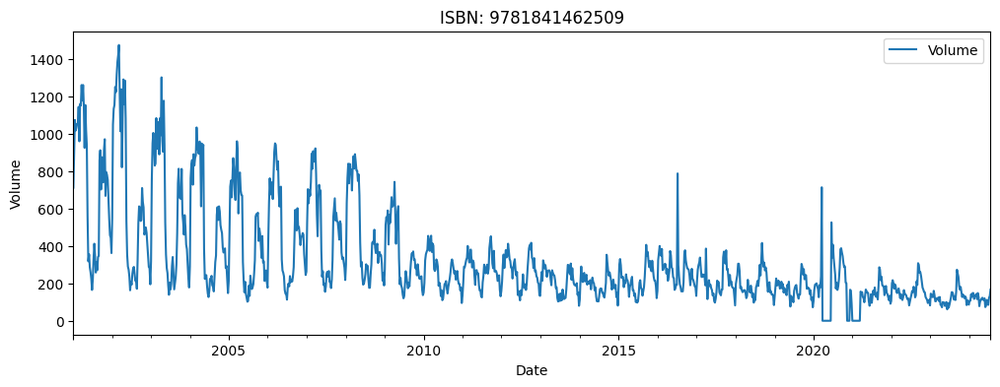

In [ ]:
# Plot the data of all the ISBNs
for isbn in isbn_beyondJuly24:
  isbn_sales = booksales_all4[booksales_all4["ISBN"] == isbn][["End Date", "Volume"]]
  isbn_sales = isbn_sales.set_index('End Date')
  isbn_sales.sort_index(inplace=True)
  # fill missing values with 0
  isbn_sales = isbn_sales.resample('W').mean().fillna(0)

  isbn_sales.plot(figsize=(12, 4))
  plt.xlabel('Date')
  plt.ylabel('Volume')
  plt.title(f'ISBN: {isbn}')
  plt.show()

The general trend is that the sale of books decreases over time. Majority of the books tend towards 0 sales after the first 5 to 10 years. There are some exceptions where there seems to be healthy sales. They show seasonal pattern in their sales.

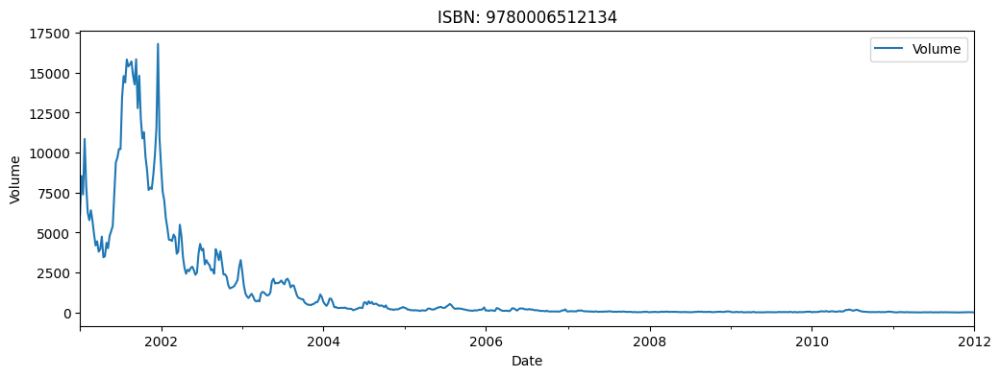

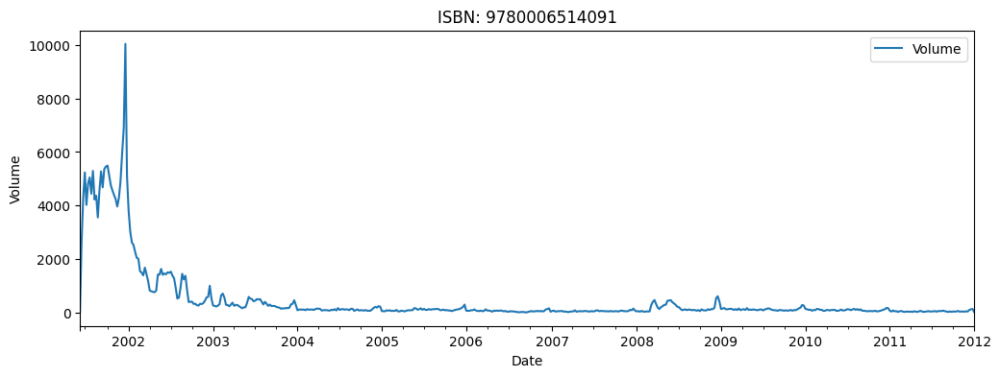

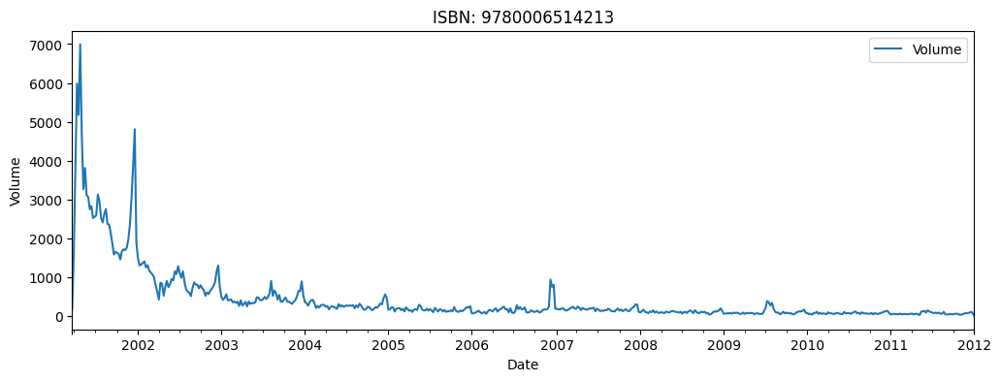

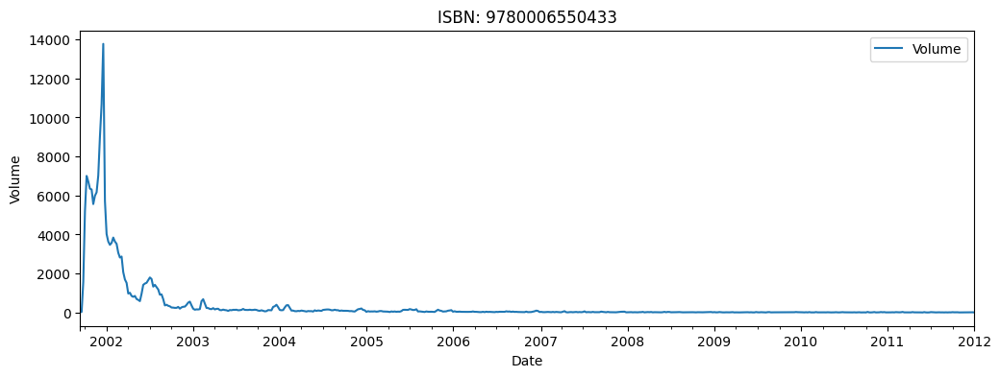

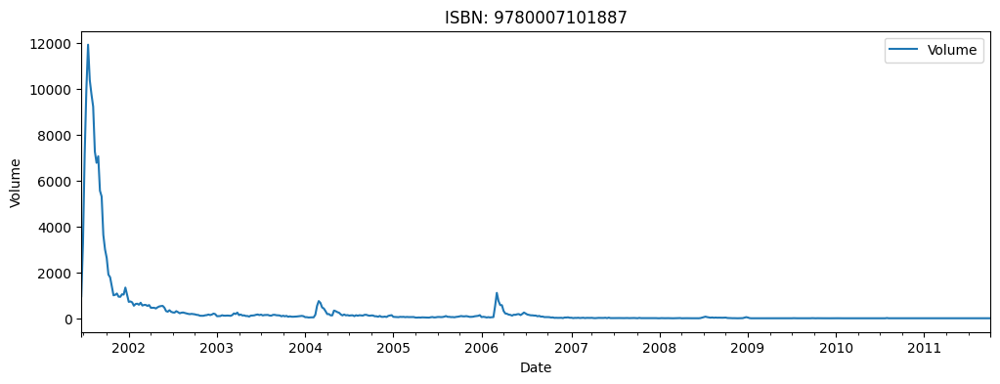

...

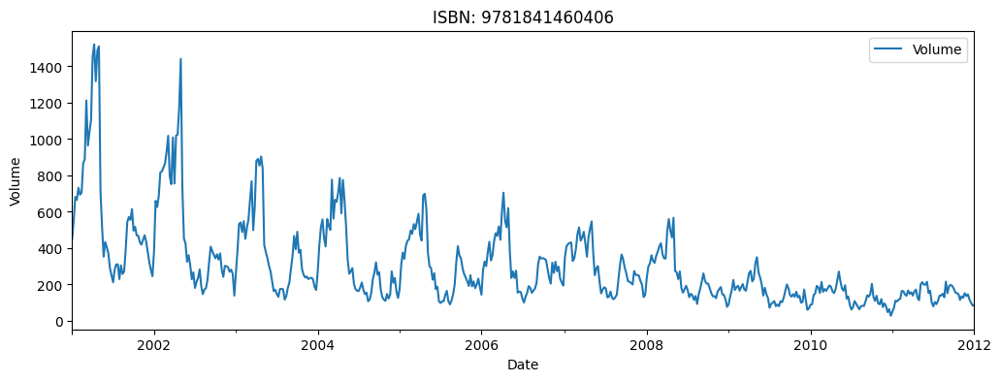

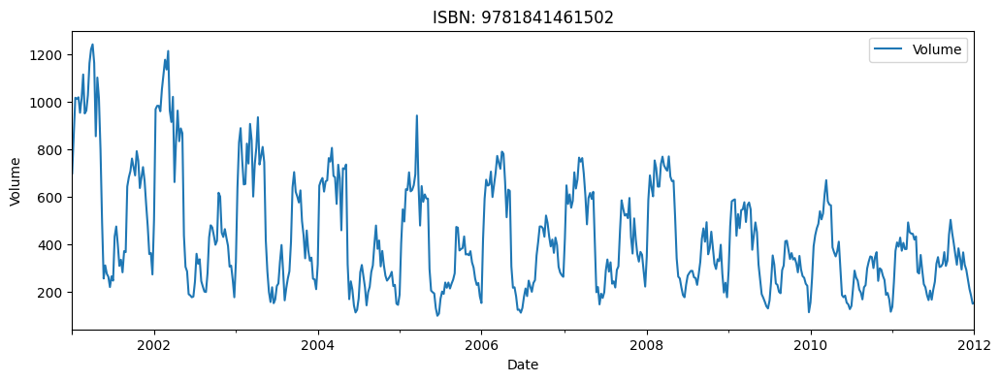

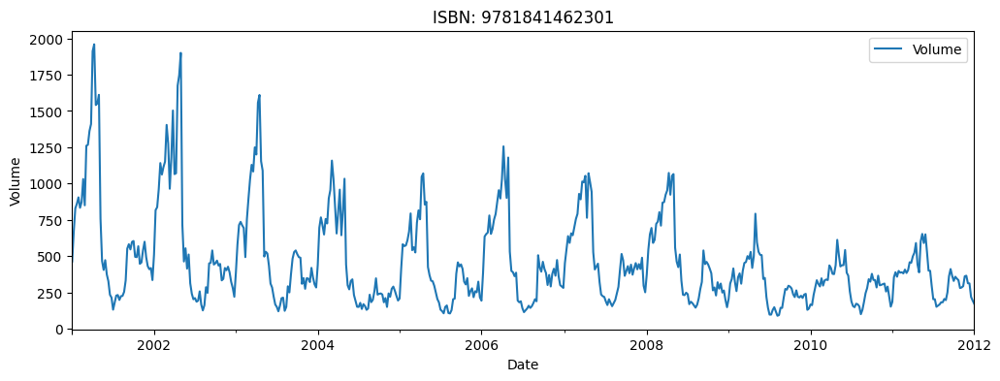

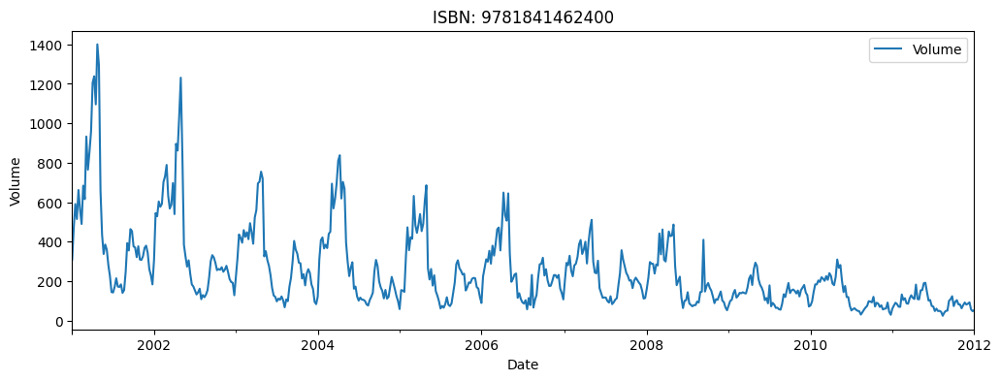

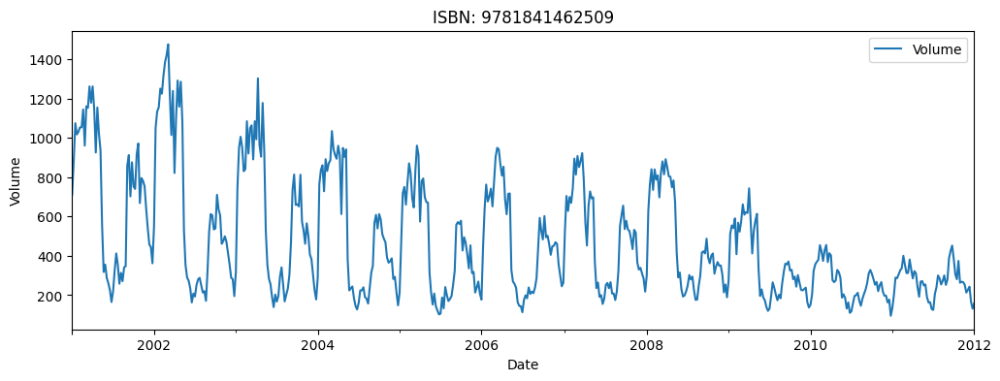

In [ ]:
# Plot the data of all the ISBNs for the period 1–12 years
for isbn in isbn_beyondJuly24:
  isbn_sales = booksales_all4[(booksales_all4["ISBN"] == isbn) & (booksales_all4["End Date"] < "2012-01-01")][["End Date", "Volume"]]
  isbn_sales = isbn_sales.set_index('End Date')
  isbn_sales.sort_index(inplace=True)
  # fill missing values with 0
  isbn_sales = isbn_sales.resample('W').mean().fillna(0)

  isbn_sales.plot(figsize=(12, 4))
  plt.xlabel('Date')
  plt.ylabel('Volume')
  plt.title(f'ISBN: {isbn}')
  plt.show()

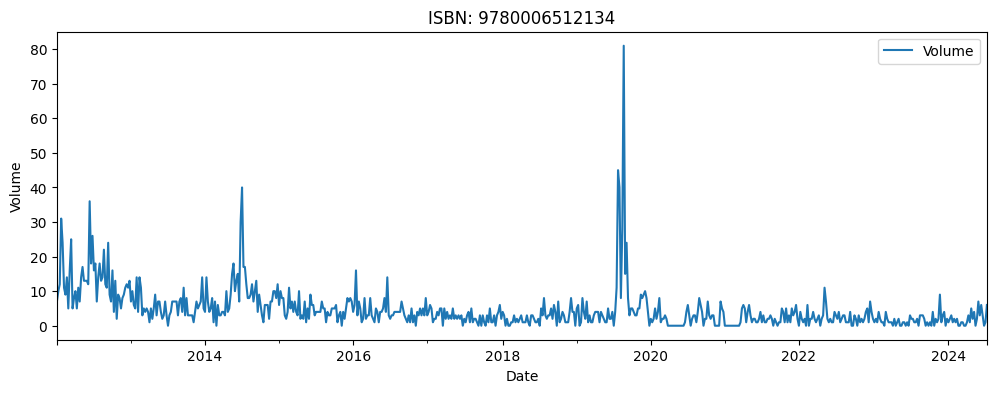

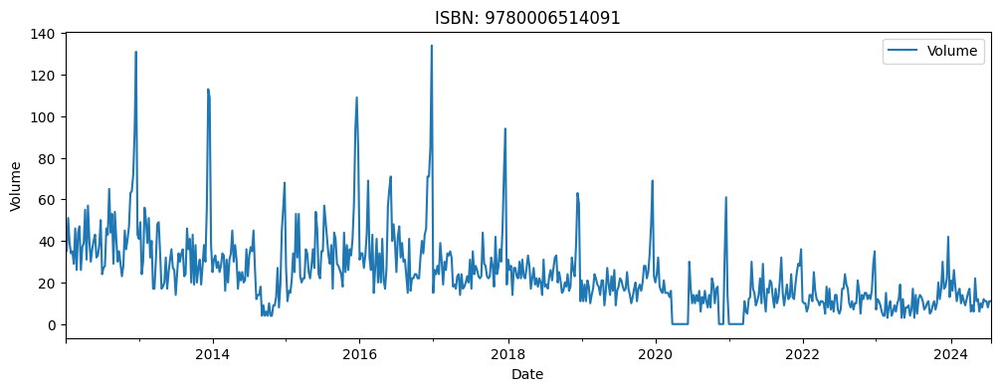

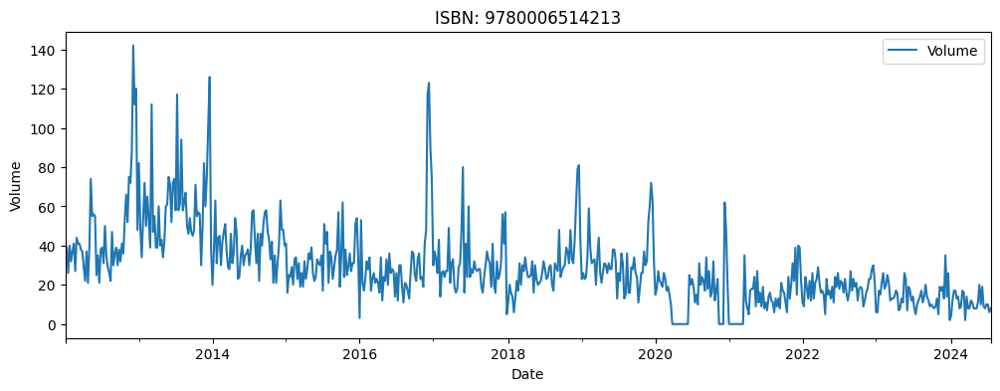

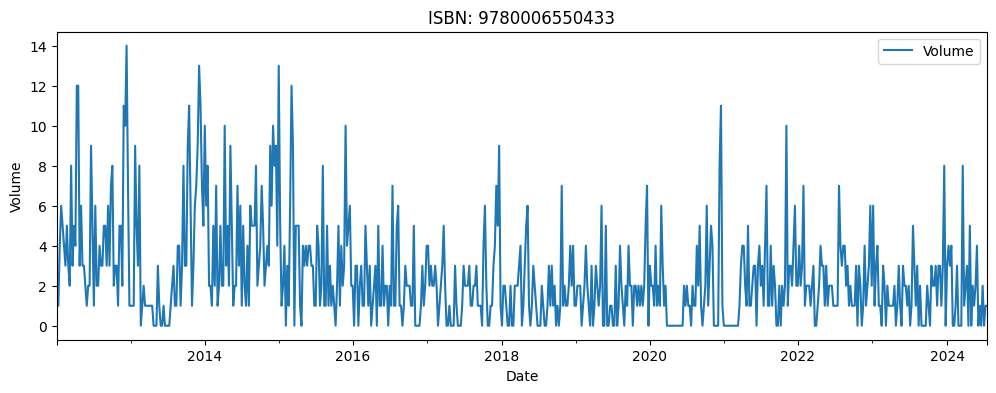

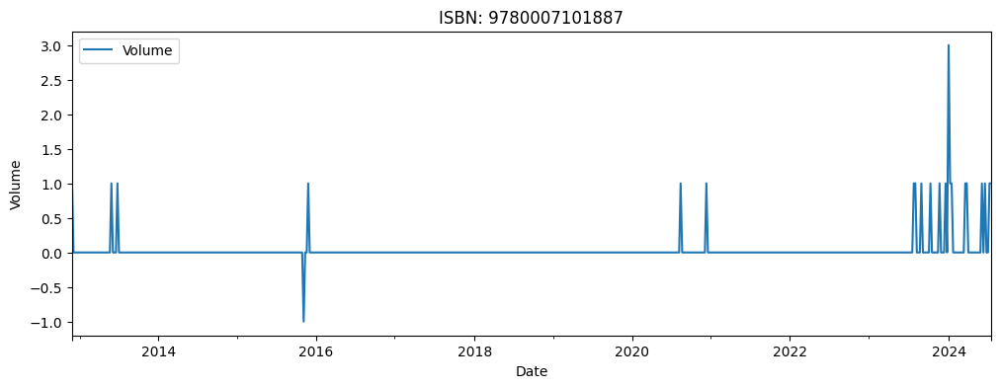

...

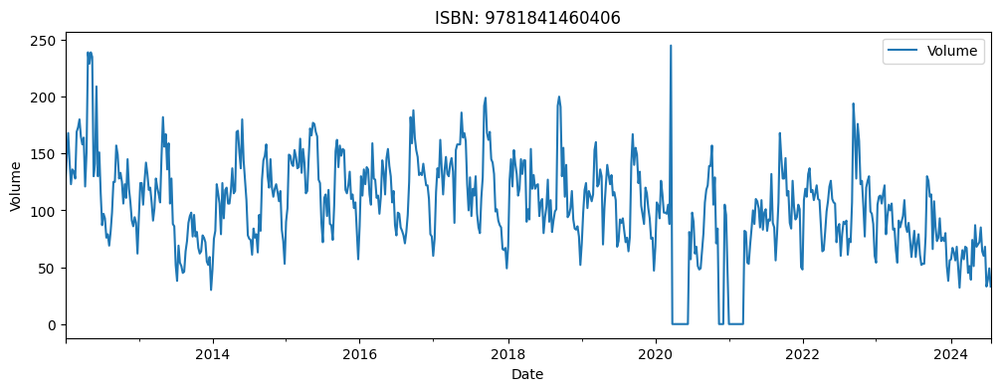

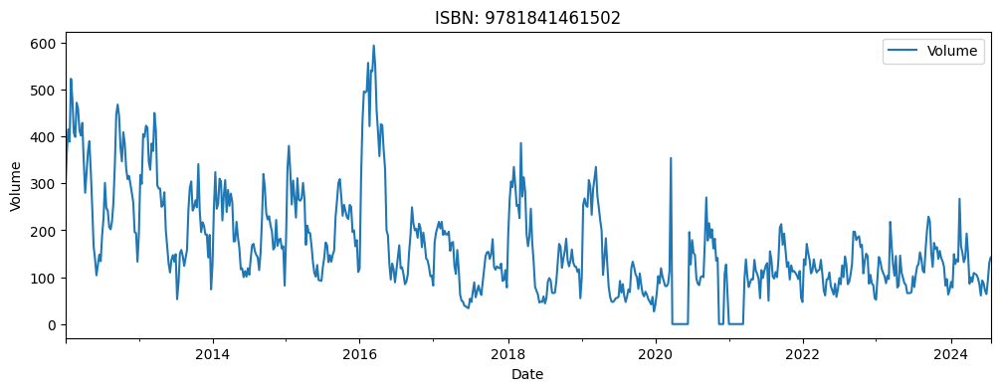

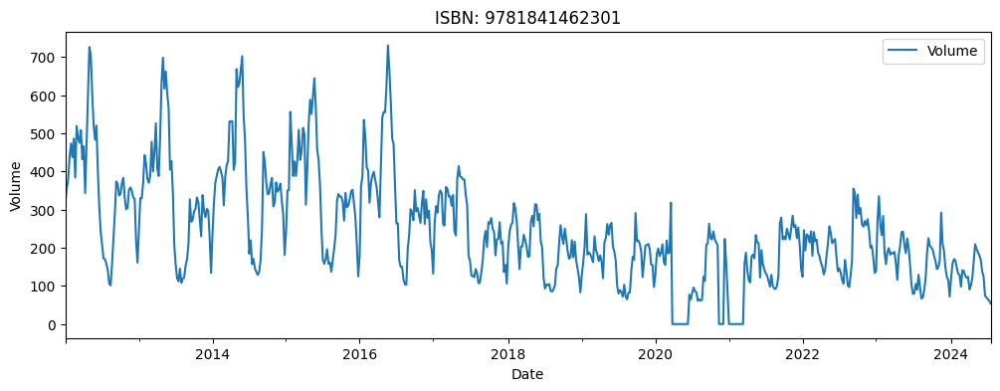

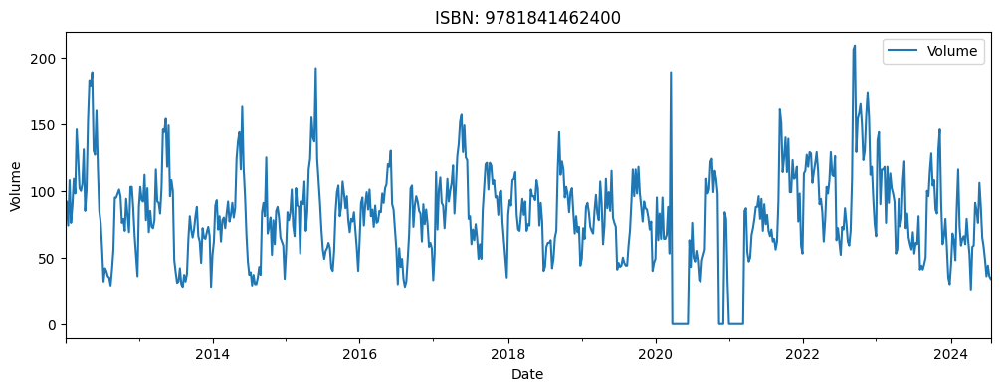

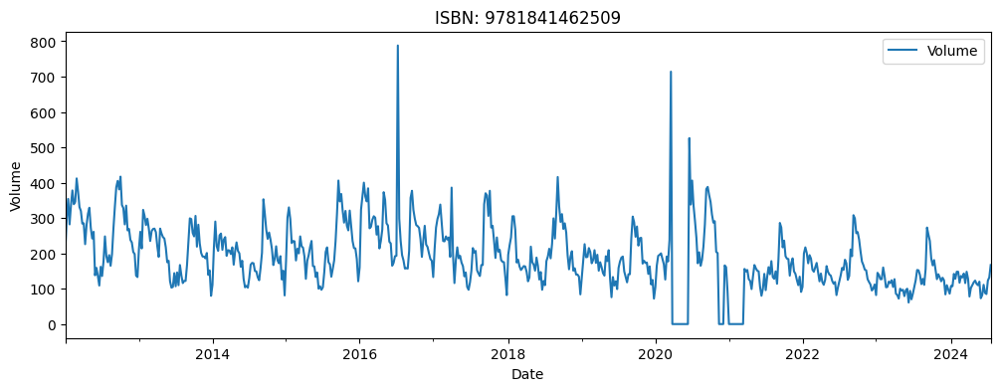

In [ ]:
# Plot the data of all the ISBNs for the period 12–24 years
for isbn in isbn_beyondJuly24:
  isbn_sales = booksales_all4[(booksales_all4["ISBN"] == isbn) & (booksales_all4["End Date"] >= "2012-01-01")][["End Date", "Volume"]]
  isbn_sales = isbn_sales.set_index('End Date')
  isbn_sales.sort_index(inplace=True)
  # fill missing values with 0
  isbn_sales = isbn_sales.resample('W').mean().fillna(0)

  isbn_sales.plot(figsize=(12, 4))
  plt.xlabel('Date')
  plt.ylabel('Volume')
  plt.title(f'ISBN: {isbn}')
  plt.show()

The patterns drastically changes for the period 1-12 years vs the period 12-24 years. The initial years have the maximum sales volume. Therefore the scale on the sales volume is in the thousands and the sales in the later years tails off. On the other hand, the 12-24 years period have a much lower but stabilised sales volume. The scale is in the hundreds or lower therefore the patterns are more pronounced.

In [ ]:
alchemist_isbn = isbn_all4[isbn_all4["Title"] == "Alchemist,The"]["ISBN"]
caterpillar_isbn = isbn_all4[isbn_all4["Title"] == "Very Hungry Caterpillar,The:The Very Hungry Caterpillar"]["ISBN"]
#9780241003008
#9780140500875

print(alchemist_isbn)
print(caterpillar_isbn)

51    9780722532935
Name: ISBN, dtype: string
429    9780241003008
Name: ISBN, dtype: string


In [ ]:
# Plot the data of all the ISBNs for the period 12–24 years
def plot_sales(isbns, title):
    isbn_sales = booksales_all4[(booksales_all4["ISBN"] == isbns.values[0]) & (booksales_all4["End Date"] >= "2012-01-01")][["End Date", "Volume"]]
    isbn_sales = isbn_sales.set_index('End Date')
    isbn_sales.sort_index(inplace=True)
    # fill missing values with 0
    isbn_sales = isbn_sales.resample('W').mean().fillna(0)

    isbn_sales.plot(figsize=(12, 4))
    plt.xlabel('Date')
    plt.ylabel('Volume')
    plt.title(f'ISBN: {isbns.values[0]} - {title}')
    plt.show()

    return isbn_sales

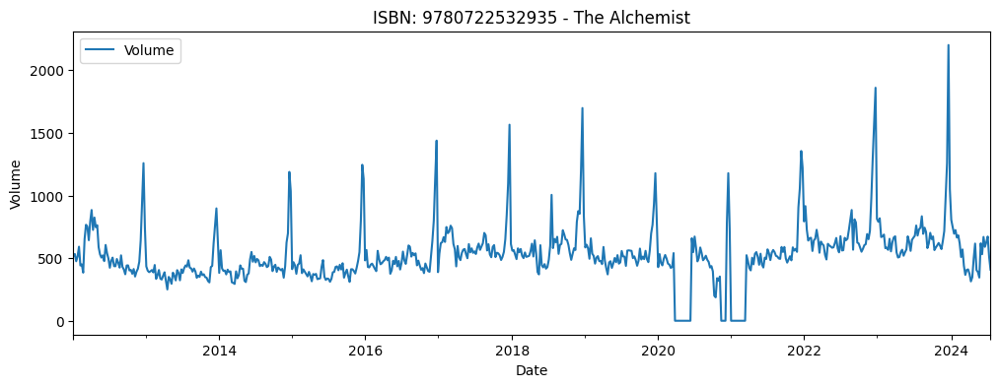

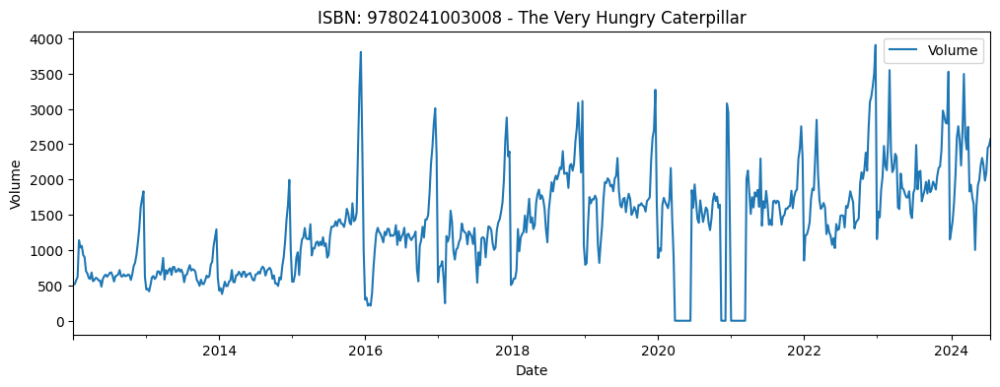

In [ ]:
alchemist_df = plot_sales(alchemist_isbn, "The Alchemist")
caterpillar_df = plot_sales(caterpillar_isbn, "The Very Hungry Caterpillar")

# Classical techniques

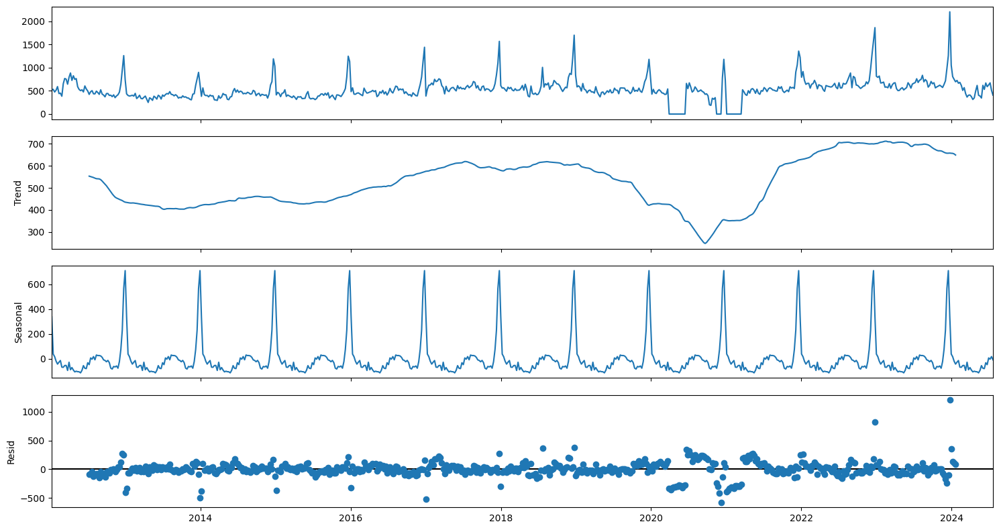

In [ ]:
# Perform data decomposition (additive).
plt.rcParams['figure.figsize'] = 15, 8
decomposition = sm.tsa.seasonal_decompose(alchemist_df, model='additive')
fig = decomposition.plot()
plt.show()

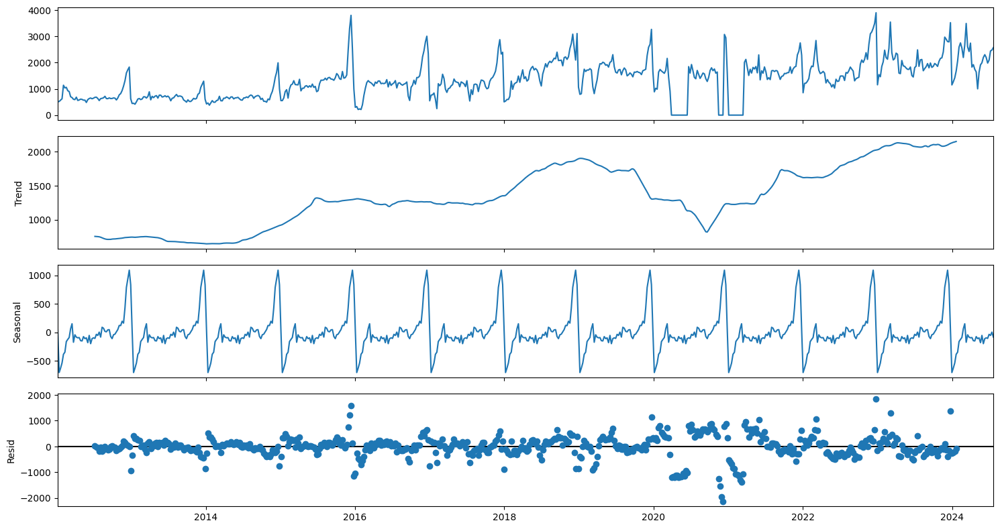

In [ ]:
# Perform data decomposition (additive).
plt.rcParams['figure.figsize'] = 15, 8
decomposition = sm.tsa.seasonal_decompose(caterpillar_df, model='additive')
fig = decomposition.plot()
plt.show()

Both the books have been decomposed with additive decomposition. As the data contains zero or negative values, multiplicative decomposition could not be performed. There is a clear seasonal pattern in both books and the trends are also very similar. It is worth noting that there are many weeks in 2020s and 2021s where the sales figure is zero for both books. This may be due to the Covid pandemic. The impact of this is shown with a dip in both the Trend line as well as the Residuals. The variance of the residuals looks stationary with some outliers and notably, as mentioned previously, zero sales in the Covid pandemic period.

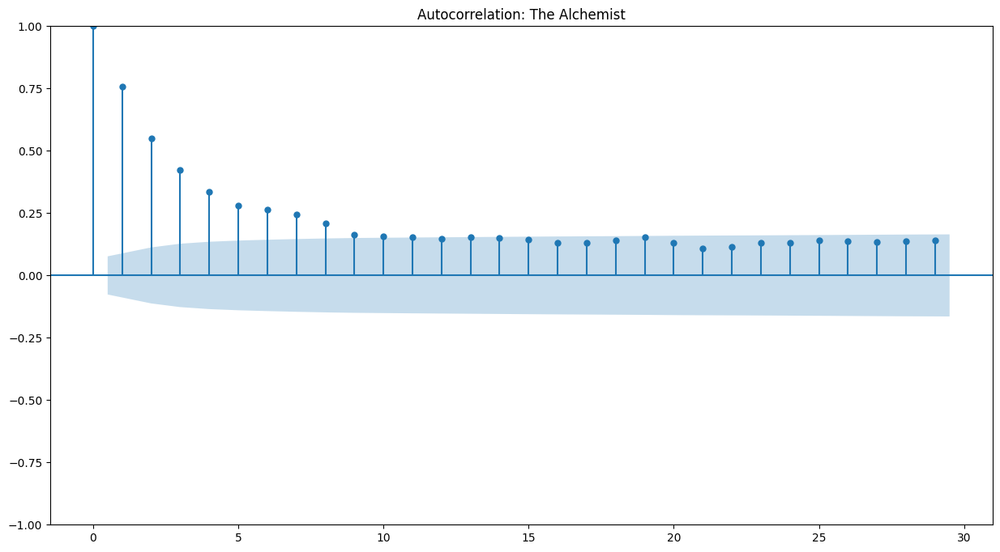

In [ ]:
# Create ACF plot : The Alchemist
smgraphics.tsa.plot_acf(alchemist_df.Volume, title="Autocorrelation: The Alchemist");

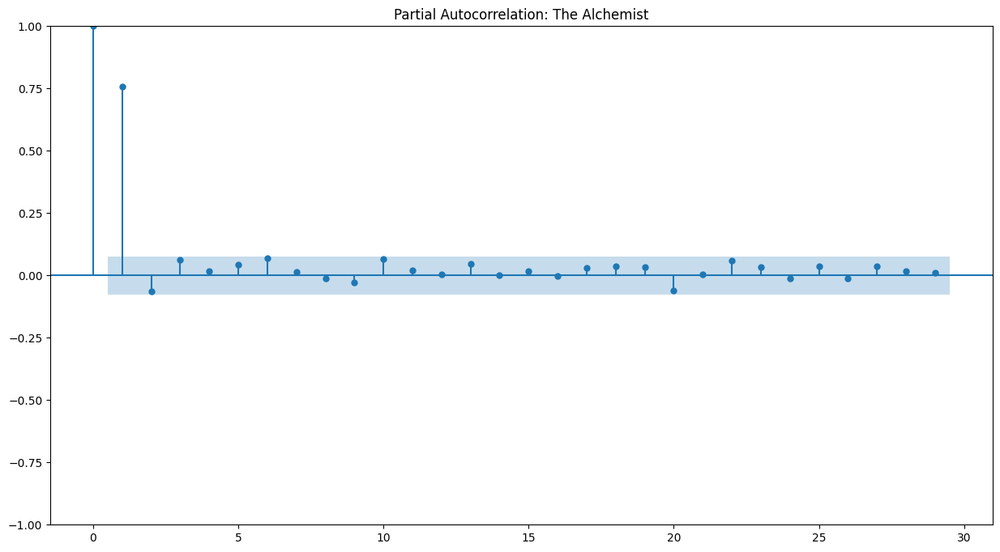

In [ ]:
# Create PACF plot : The Alchemist
smgraphics.tsa.plot_pacf(alchemist_df.Volume, title="Partial Autocorrelation: The Alchemist");

**The Alchemist**: The Autocorrelation function shows that there is correlation upto 8 lags. However the Partial Autocorrelation function shows that there is correlation with only 1 lag. This shows a gradual decay in ACF and a sharp cut-off in PACF suggesting an AR model.

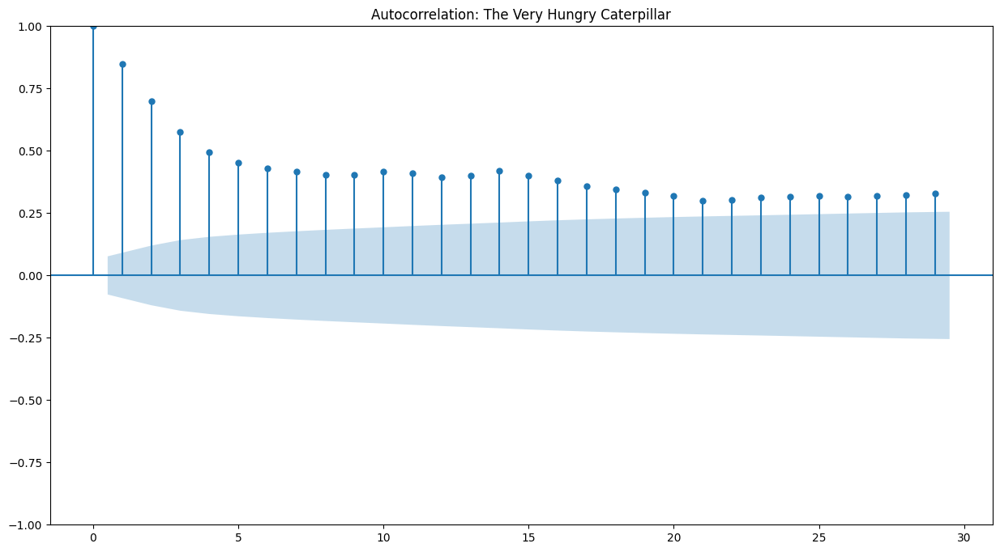

In [ ]:
# Create ACF plot : The Very Hungry Caterpillar
smgraphics.tsa.plot_acf(caterpillar_df.Volume, title="Autocorrelation: The Very Hungry Caterpillar", alpha=0.05);

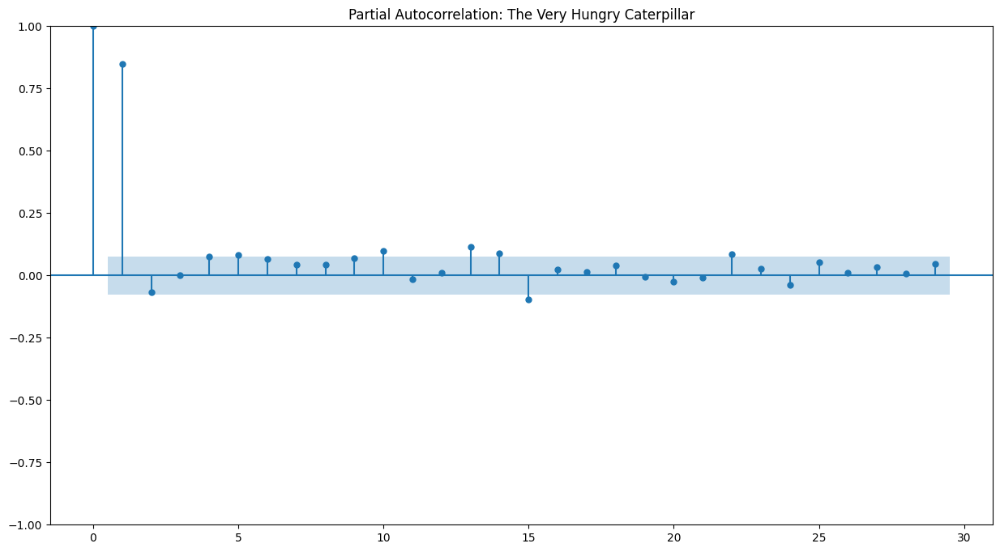

In [ ]:
# Create PACF plot : The Very Hungry Caterpillar
smgraphics.tsa.plot_pacf(caterpillar_df.Volume, title="Partial Autocorrelation: The Very Hungry Caterpillar", alpha=0.05);

**The Very Hungry Caterpillar**: The Autocorrelation function shows that there is correlation upto 29 lags shown at 95% confidence level. However the Partial Autocorrelation function shows that there is correlation with only 1 lag. There are some lags at 10, 13 and 15 that are showing some correlation but this is at the border of the insignificance region and therefore can be ignored. This shows a gradual decay in ACF and a sharp cut-off in PACF suggesting an AR model.

In [ ]:
# Testing for stationarity - ADF Test
adf_result = adf(alchemist_df.Volume)
print('p-value. Weekly "The Alchemist" sales data:', adf_result[1])

# Interpretation
if adf_result[1] > 0.05:
    print("The series is likely non-stationary (contains a unit root).")
else:
    print("The series is likely stationary (does not contain a unit root).")

p-value. Weekly "The Alchemist" sales data: 4.139950997174928e-13
The series is likely stationary (does not contain a unit root).


In [ ]:
# Testing for stationarity - ADF Test
adf_result = adf(caterpillar_df.Volume)
print('p-value. Weekly "The Very Hungry Caterpillar" sales data:', adf_result[1])

# Interpretation
if adf_result[1] > 0.05:
    print("The series is likely non-stationary (contains a unit root).")
else:
    print("The series is likely stationary (does not contain a unit root).")

p-value. Weekly "The Very Hungry Caterpillar" sales data: 0.029616021527175844
The series is likely stationary (does not contain a unit root).


In [ ]:
alchemist_Volume = alchemist_df.Volume
caterpillar_Volume = caterpillar_df.Volume

In [ ]:
# plot book sales data highlighting train and test sections
def plot_book_sales_data(book_Volume, title, test_time_steps=32):
  N = book_Volume.count()
  N_test = test_time_steps
  N_plot = N-N_test
  N_train = N-N_test

  book_train = book_Volume[:N_train]
  book_test = book_Volume[N_train:]

  # Plot the book sales data.
  plt.figure(figsize=(14, 4))
  time = np.arange(N)
  plt.plot(time[(len(book_train)-N_plot):], book_Volume[(len(book_train)-N_plot):])
  plt.plot(time[len(book_train):], (book_test))
  plt.title(title)
  plt.xlabel('time')
  plt.ylabel('Volume')
  plt.legend(['Train', 'Test'])

  return book_train

# Auto ARIMA - The Alchemist

In [ ]:
test_time_steps = 32

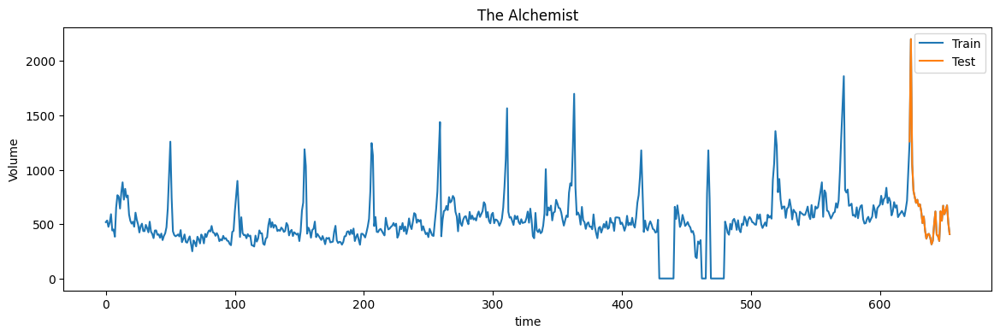

In [ ]:
alchemist_train = plot_book_sales_data(alchemist_Volume, 'The Alchemist', test_time_steps)

In [ ]:
alchemist_train, alchemist_test = alchemist_Volume.iloc[:-test_time_steps], alchemist_Volume.iloc[-test_time_steps:]

In [ ]:
# Define the model.
alchemist_model = auto_arima(y=alchemist_train, X=None,
                   start_p=0, d=None, start_q=0, max_p=5, max_d=2, max_q=5,
                   start_P=0, D=None, start_Q=0, max_P=3, max_D=1, max_Q=3,
                   max_order=10, m=52, seasonal=True, stationary=False,
                   information_criterion='aic', alpha=0.05,
                   test='kpss', seasonal_test='ocsb',
                   stepwise=True, n_jobs=1, start_params=None, trend=None,
                   method='lbfgs', maxiter=50, offset_test_args=None, seasonal_test_args=None,
                   suppress_warnings=True, error_action='trace',
                   trace=False, random=False, random_state=None, n_fits=10,
                   return_valid_fits=False, out_of_sample_size=0, scoring='mse',
                   scoring_args=None, with_intercept='auto', sarimax_kwargs=None)

# Print model results.
alchemist_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  623
Model:             SARIMAX(1, 1, 2)x(2, 0, [], 52)   Log Likelihood               -3804.646
Date:                             Mon, 07 Oct 2024   AIC                           7623.292
Time:                                     01:14:13   BIC                           7654.322
Sample:                                 01-08-2012   HQIC                          7635.352
                                      - 12-10-2023                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.0154      0.163     -0.095      0.925      -0.334       0.304
ar.L1          0.7663      0.052     14.793      0.000       0.665       0.868
ma.L1         -1.0745      0.058    -18.422      0.000      -1.189      -0.960
ma.L2          0.1201      0.045      2.677      0.007       0.032       0.208
ar.S.L52       0.4296      0.026     16.401      0.000       0.378       0.481
ar.S.L104      0.2961      0.026     11.497      0.000       0.246       0.347
sigma2      1.139e+04    360.080     31.619      0.000    1.07e+04    1.21e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.04   Jarque-Bera (JB):              1329.94
Prob(Q):                              0.84   Prob(JB):                         0.00
Heteroskedasticity (H):               2.95   Skew:                             0.54
Prob(H) (two-sided):                  0.00   Kurtosis:                        10.08
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The best model is SARIMAX(1, 1, 2)x(2, 0, [], 52) with AIC of 7623.

p values of model parameters ar.L1, ma.L1, ma.L2, ar.S.L52, ma.S.L104	are all less than .05 therefore they are all significant.

p value of Ljung - Box test is high, therefore it suggests there is no auto correlation.

The low p value of Jarque-Bera (JB) test suggests that the residuals are not normally distributed.

In [ ]:
# Use the model to forecast the next 32 time steps.
def arima_predict_and_visualise(books_model, books_train, test_time_steps, book_Volume, title):
  predictions = books_model.predict(test_time_steps, return_conf_int=True, alpha=0.05)

  time = book_Volume.index

  N = book_Volume.count()
  N_plot = N-test_time_steps

  # Visualise the model predictions.
  plt.figure(figsize=(14, 4))
  plt.plot(time[(len(books_train)-N_plot):], book_Volume[(len(books_train)-N_plot):])
  plt.plot(time[(len(books_train)-N_plot):len(books_train)], books_model.fittedvalues()[(len(books_train)-N_plot):len(books_train)], ':', c='red')
  plt.plot(time[len(books_train):], predictions[0])
  plt.plot(time[len(books_train):], predictions[1][:, 0], ':', c='grey')
  plt.plot(time[len(books_train):], predictions[1][:, 1], ':', c='grey')
  plt.title(f'{title} time series and prediction')
  plt.xlabel('time')
  plt.ylabel('series')
  plt.legend(['Observed', 'Fitted values', 'Forecast', '95% CI'])

  return books_model, predictions

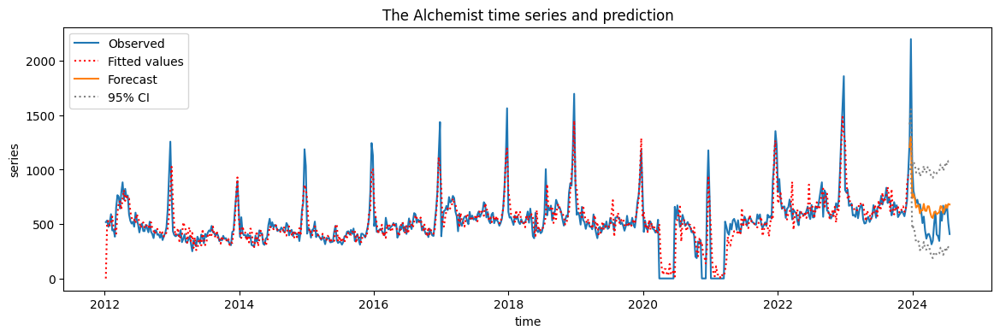

In [ ]:
alchemist_model, predictions = arima_predict_and_visualise(alchemist_model, alchemist_train, test_time_steps, alchemist_Volume, 'The Alchemist')

The contour of the predicted values does not closely mirror that of the observed values. The model could be fine-tuned. However, the 95% confidence interval covers the observed values.

In [ ]:
mae = mean_absolute_error(alchemist_test, predictions[0])
mape = mean_absolute_percentage_error(alchemist_test, predictions[0])

print("mae", mae)
print("mape", mape)

mae 155.07082862350978
mape 0.29751447349159316


Text(0, 0.5, 'Frequency')

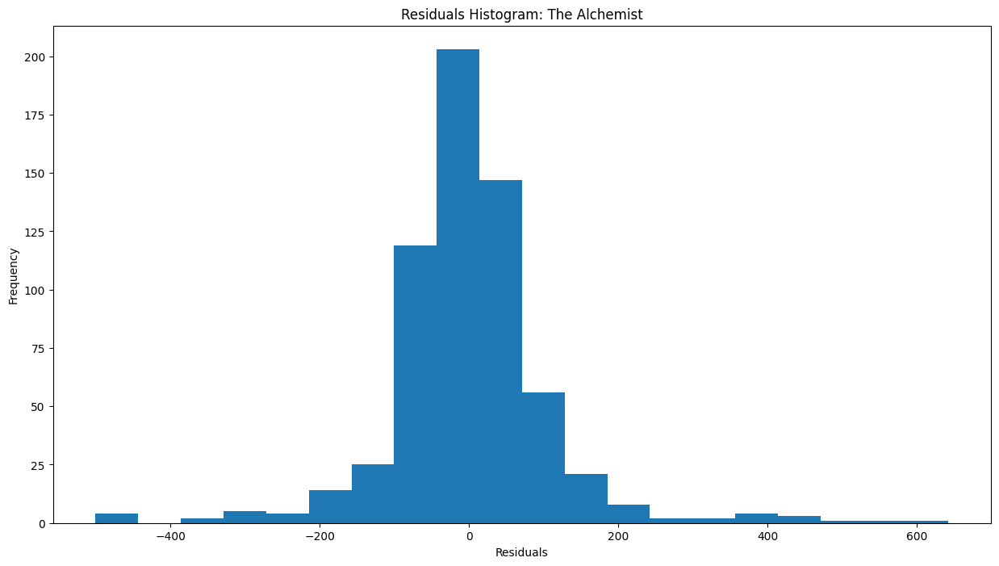

In [ ]:
# Plot the histogram of the residuals.
plt.hist(alchemist_model.resid()[1:], bins=20)
plt.title('Residuals Histogram: The Alchemist')
plt.xlabel('Residuals')
plt.ylabel('Frequency')

Although the JB test had a low p value indicating that the residuals are not normally distributed, the histogram suggests that they are close to normal distribution.

# Auto ARIMA - The Very Hungry Caterpillar

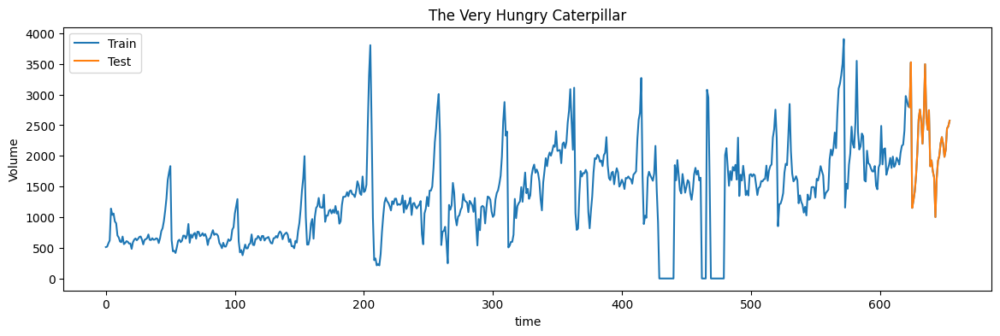

In [ ]:
caterpillar_train = plot_book_sales_data(caterpillar_Volume, 'The Very Hungry Caterpillar', test_time_steps)

In [ ]:
caterpillar_train, caterpillar_test = caterpillar_Volume.iloc[:-test_time_steps], caterpillar_Volume.iloc[-test_time_steps:]

In [ ]:
# Define the model.
caterpillar_model = auto_arima(y=caterpillar_train, X=None,
                   start_p=0, d=None, start_q=0, max_p=3, max_d=2, max_q=3,
                   start_P=0, D=None, start_Q=0, max_P=2, max_D=1, max_Q=2,
                   max_order=10, m=52, seasonal=True, stationary=False,
                   information_criterion='aic', alpha=0.05,
                   test='kpss', seasonal_test='ocsb',
                   stepwise=True, n_jobs=1, start_params=None, trend=None,
                   method='lbfgs', maxiter=50, offset_test_args=None, seasonal_test_args=None,
                   suppress_warnings=True, error_action='trace',
                   trace=False, random=False, random_state=None, n_fits=10,
                   return_valid_fits=False, out_of_sample_size=0, scoring='mse',
                   scoring_args=None, with_intercept='auto', sarimax_kwargs=None)

# Print model results.
caterpillar_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                                       y   No. Observations:                  623
Model:             SARIMAX(2, 1, 1)x(1, 0, [1, 2], 52)   Log Likelihood               -4482.094
Date:                                 Sun, 06 Oct 2024   AIC                           8978.188
Time:                                         01:09:28   BIC                           9009.219
Sample:                                     01-08-2012   HQIC                          8990.248
                                          - 12-10-2023                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8131      0.034     23.602      0.000       0.746       0.881
ar.L2         -0.0665      0.032     -2.051      0.040      -0.130      -0.003
ma.L1         -0.9646      0.013    -74.658      0.000      -0.990      -0.939
ar.S.L52       0.6274      0.086      7.311      0.000       0.459       0.796
ma.S.L52      -0.3466      0.089     -3.883      0.000      -0.521      -0.172
ma.S.L104      0.1030      0.051      2.016      0.044       0.003       0.203
sigma2      1.041e+05   3032.204     34.321      0.000    9.81e+04     1.1e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):              5951.41
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               5.46   Skew:                             0.91
Prob(H) (two-sided):                  0.00   Kurtosis:                        18.05
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The best model is SARIMAX(2, 1, 1)x(1, 0, [1, 2], 52) with AIC of 8978.

p values of model parameters ar.L1, ar.L2, ma.L1, ar.S.L52, ma.S.L52, ma.S.L104	are all less than .05 therefore they are all significant.

p value of Ljung - Box test is high, therefore it suggests there is no auto correlation.

The low p value of Jarque-Bera (JB) test suggests that the residuals are not normally distributed.

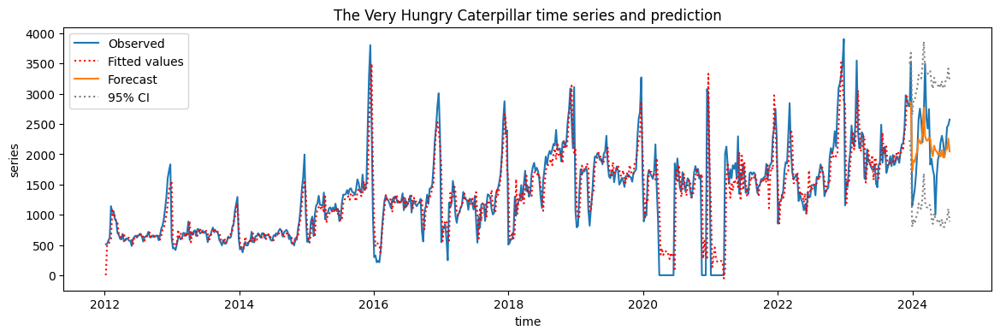

In [ ]:
caterpillar_model, predictions = arima_predict_and_visualise(caterpillar_model, caterpillar_train, test_time_steps, caterpillar_Volume, 'The Very Hungry Caterpillar')

The contour of the predicted values does not closely mirror that of the observed values. The model could be fine tuned by stabilising the residuals as the predictions seem to fairly capture the trend and seasonality components. However the 95% confidence interval covers the observed values.

In [ ]:
mae = mean_absolute_error(caterpillar_test, predictions[0])
mape = mean_absolute_percentage_error(caterpillar_test, predictions[0])

print("mae", mae)
print("mape", mape)

mae 353.1416564470945
mape 0.18632040765228042


Text(0, 0.5, 'Frequency')

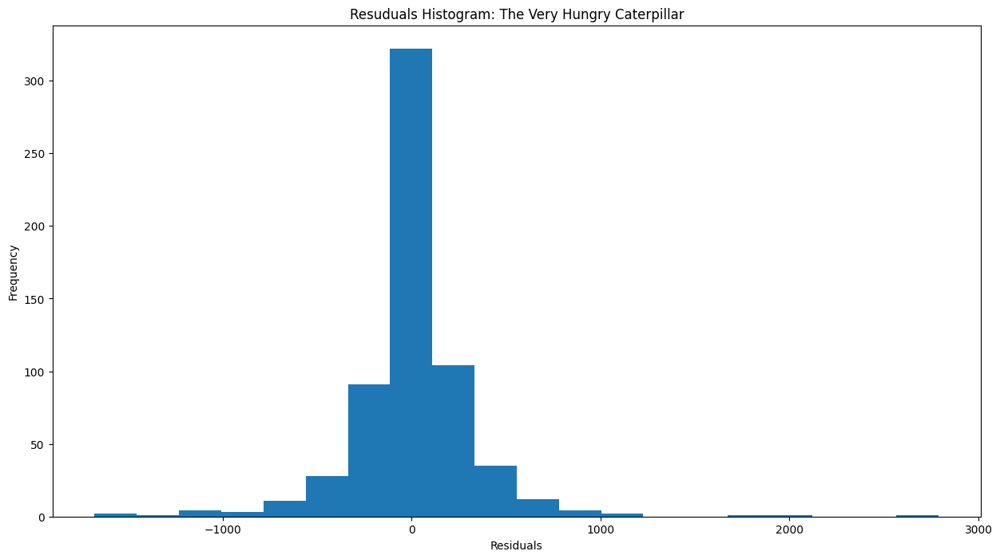

In [ ]:
# Plot the histogram of the residuals.
plt.hist(caterpillar_model.resid()[1:], bins=20)
plt.title('Residuals Histogram: The Very Hungry Caterpillar')
plt.xlabel('Residuals')
plt.ylabel('Frequency')

The p value of JB test is low indicating that the residuals are not normally distributed, however, the histogram suggests that they are close to normal distribution.

# Common Steps

In [ ]:
alchemist_df_train, alchemist_df_test = alchemist_df.iloc[:-test_time_steps], alchemist_df.iloc[-test_time_steps:]

caterpillar_df_train, caterpillar_df_test = caterpillar_df.iloc[:-test_time_steps], caterpillar_df.iloc[-test_time_steps:]

In [ ]:
# Create the input-output pairs in the format required by XGBoost.
def create_input_output_sequences(lookback, forecast, sequence_data):
  input_sequences = []
  output_sequences = []

  for i in range(lookback, len(sequence_data) - forecast + 1):
      input_sequences.append(sequence_data[i - lookback: i])
      output_sequences.append(sequence_data[i: i + forecast])

  return input_sequences, output_sequences

# Machine Learning and Deep Learning techniques

# XGBoost - The Alchemist

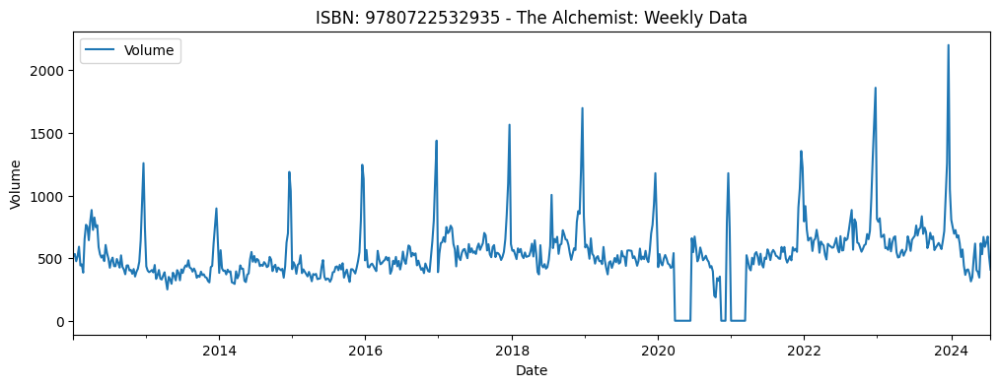

In [ ]:
alchemist_df = plot_sales(alchemist_isbn, "The Alchemist: Weekly Data")

In [ ]:
complete_date_range = pd.date_range(start=alchemist_df.index.min(), end=alchemist_df.index.max(), freq='W')

In [ ]:
df_reindexed = alchemist_df.reindex(complete_date_range)
alchemist_df = df_reindexed.fillna(method='ffill')

In [ ]:
alchemist_weekly_df = alchemist_df['Volume'].resample('W').mean()

In [ ]:
test_time_steps = 32

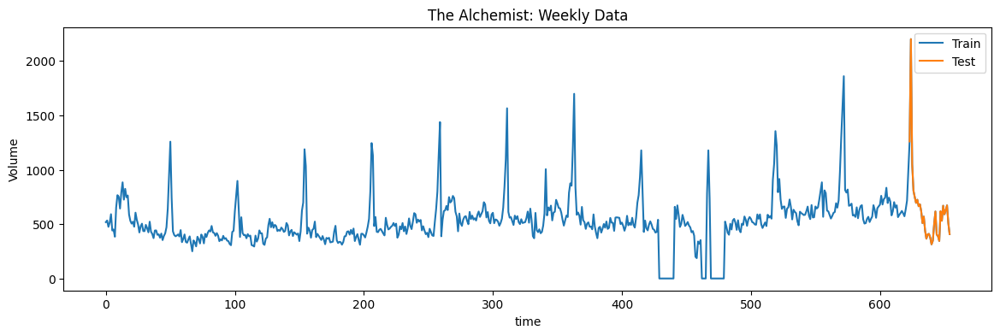

In [ ]:
alchemist_weekly_train = plot_book_sales_data(alchemist_weekly_df, 'The Alchemist: Weekly Data', test_time_steps)

In [ ]:
alchemist_weekly_df_train, alchemist_weekly_df_test = alchemist_weekly_df.iloc[:-test_time_steps], alchemist_weekly_df.iloc[-test_time_steps:]

In [ ]:
def create_input_output_sequences_xgb(lookback, forecast, sequence_data):
  input_sequences = []
  output_sequences = []

  for i in range(lookback, len(sequence_data) - forecast + 1):
      input_sequences.append(sequence_data[i - lookback: i].tolist())
      output_sequences.append(sequence_data[i: i + forecast].tolist())

  return input_sequences, output_sequences

In [ ]:
param_tuning_obj = {
    'max_depth': hyperopt.hp.quniform("max_depth", 3, 18, 1),
    'gamma': hp.uniform ('gamma', 0,5),
    'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
    'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
    'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
    'n_estimators': 400,
    'seed': 0
  }

In [ ]:
train_set = alchemist_weekly_df_train
test_set = alchemist_weekly_df_test

In [ ]:
print(train_set.index)

train_set.index = pd.PeriodIndex(train_set.index, freq='W')

DatetimeIndex(['2012-01-08', '2012-01-15', '2012-01-22', '2012-01-29', '2012-02-05', '2012-02-12',
               '2012-02-19', '2012-02-26', '2012-03-04', '2012-03-11',
               ...
               '2023-10-08', '2023-10-15', '2023-10-22', '2023-10-29', '2023-11-05', '2023-11-12',
               '2023-11-19', '2023-11-26', '2023-12-03', '2023-12-10'],
              dtype='datetime64[ns]', length=623, freq='W-SUN')


In [ ]:
print(test_set.index)

test_set.index = pd.PeriodIndex(test_set.index, freq='W')

DatetimeIndex(['2023-12-17', '2023-12-24', '2023-12-31', '2024-01-07', '2024-01-14', '2024-01-21',
               '2024-01-28', '2024-02-04', '2024-02-11', '2024-02-18', '2024-02-25', '2024-03-03',
               '2024-03-10', '2024-03-17', '2024-03-24', '2024-03-31', '2024-04-07', '2024-04-14',
               '2024-04-21', '2024-04-28', '2024-05-05', '2024-05-12', '2024-05-19', '2024-05-26',
               '2024-06-02', '2024-06-09', '2024-06-16', '2024-06-23', '2024-06-30', '2024-07-07',
               '2024-07-14', '2024-07-21'],
              dtype='datetime64[ns]', freq='W-SUN')


In [ ]:
def auto_tune_training(param_tuning_obj):
  train_input, train_output = create_input_output_sequences_xgb(12, 1, train_set)
  test_input, test_output = create_input_output_sequences_xgb(12, 1, test_set)
  model = XGBRegressor(
          n_estimators = param_tuning_obj['n_estimators'],
          max_depth = int(param_tuning_obj['max_depth']),
          gamma = param_tuning_obj['gamma'],
          reg_alpha = int(param_tuning_obj['reg_alpha']),
          min_child_weight=int(param_tuning_obj['min_child_weight']),
          colsample_bytree=int(param_tuning_obj['colsample_bytree']),
          eval_metric="auc",
          early_stopping_rounds=10
        )

  evaluation = [(train_input, train_output), (test_input, test_output)]

  model.fit(train_input, train_output,
            eval_set=evaluation,verbose=False)


  pred = model.predict(test_input)
  preds = pred.flatten()
  accuracy = mean_absolute_error(test_output, pred)
  print ("MAE:", accuracy)
  return {'loss': accuracy, 'status': STATUS_OK }

In [ ]:
trials = Trials()

best_hyperparams = fmin(fn = auto_tune_training,
                        space = param_tuning_obj,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials)

MAE:
127.0114974975586
MAE:
128.06050720214844
MAE:
123.95788879394532
MAE:
120.79876861572265
MAE:
135.24212646484375
MAE:
122.7520538330078
MAE:
123.51669616699219
MAE:
135.57882080078124
MAE:
124.9199462890625
MAE:
122.12223968505859
MAE:
135.3531982421875
MAE:
135.6914855957031
MAE:
124.26511688232422
MAE:
127.99830474853516
MAE:
123.49664916992188
MAE:
124.35045623779297
MAE:
123.90566711425781
MAE:
123.20892486572265
MAE:
132.4007598876953
MAE:
125.50482177734375
MAE:
121.23913116455078
MAE:
121.21935424804687
MAE:
121.38989562988282
MAE:
120.80635833740234
MAE:
124.04780578613281
MAE:
120.82912139892578
MAE:
121.6365737915039
MAE:
121.33809814453124
MAE:
124.39195098876954
MAE:
124.10659332275391
MAE:
121.27866668701172
MAE:
124.2928237915039
MAE:
121.45462493896484
MAE:
135.42483367919922
MAE:
124.6257339477539
MAE:
128.20900268554686
MAE:
123.14851989746094
MAE:
121.29184417724609
MAE:
136.2223876953125
MAE:
121.96844024658203
MAE:
124.12514953613281
MAE:
123.16357879638672
MA

In [ ]:
# Output of the hyperparameter optimisation.
print(best_hyperparams)

{'colsample_bytree': 0.7034934133449253, 'gamma': 3.4561034118662883, 'max_depth': 16.0, 'min_child_weight': 9.0, 'reg_alpha': 71.0}


In [ ]:
def create_predictor_with_deseasonaliser_xgboost(sp=52, degree=1):

    regressor = XGBRegressor(base_score=0.5,
                      n_estimators=400,
                      min_child_weight=int(best_hyperparams["min_child_weight"]),
                      max_depth=int(best_hyperparams["max_depth"]),
                      learning_rate=0.1,
                      booster='gbtree',
                      tree_method='exact',
                      reg_alpha=int(best_hyperparams["reg_alpha"]),
                      subsample=0.5,
                      validate_parameters=1,
                      colsample_bylevel=1,
                      colsample_bynode=1,
                      colsample_bytree=best_hyperparams["colsample_bytree"],
                      gamma=best_hyperparams["gamma"]
                    )
    forecaster = TransformedTargetForecaster(
        [
            ("deseasonalize", Deseasonalizer(model="additive", sp=sp)),
            ("detrend", Detrender(forecaster=PolynomialTrendForecaster(degree=degree))),
            (
                "forecast",
                make_reduction(regressor, window_length=32, strategy="recursive"),
            ),
        ]
    )

    return forecaster

In [ ]:
def grid_search_predictor(train, test, predictor, param_grid):

    # Grid search on window_length
    cv = ExpandingWindowSplitter(initial_window=int(len(train) * 0.7))
    gscv = ForecastingGridSearchCV(
        predictor, strategy="refit", cv=cv, param_grid=param_grid,
        scoring=MeanAbsolutePercentageError(symmetric=True), error_score="raise"
    )
    gscv.fit(train)
    print(f"Best parameters: {gscv.best_params_}")

    future_horizon = np.arange(len(test)) + 1
    print("future_horizon", future_horizon)
    predictions = gscv.predict(fh=future_horizon)

    return predictions

In [ ]:
predictor = create_predictor_with_deseasonaliser_xgboost()

# Set the window_length values to perform a grid search.

param_grid = {"forecast__window_length": [4, 8, 12, 16, 20, 24, 28, 32, 36]}

# Perform a grid search.
predictions = grid_search_predictor(
    train_set, test_set, predictor, param_grid
)

Best parameters: {'forecast__window_length': 12}
future_horizon [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32]


In [ ]:
print(predictions)

2023-12-11/2023-12-17    1181.516078
2023-12-18/2023-12-24     775.817363
2023-12-25/2023-12-31     553.393229
2024-01-01/2024-01-07     603.123497
2024-01-08/2024-01-14     503.983004
2024-01-15/2024-01-21     546.807884
2024-01-22/2024-01-28     531.159880
2024-01-29/2024-02-04     580.661803
2024-02-05/2024-02-11     525.065731
2024-02-12/2024-02-18     507.206595
2024-02-19/2024-02-25     506.602023
2024-02-26/2024-03-03     469.002909
2024-03-04/2024-03-10     409.114615
2024-03-11/2024-03-17     516.377619
2024-03-18/2024-03-24     518.983132
2024-03-25/2024-03-31     496.700160
2024-04-01/2024-04-07     514.945141
2024-04-08/2024-04-14     495.875826
2024-04-15/2024-04-21     496.840687
2024-04-22/2024-04-28     512.801857
2024-04-29/2024-05-05     463.251198
2024-05-06/2024-05-12     531.011072
2024-05-13/2024-05-19     544.867154
2024-05-20/2024-05-26     535.883287
2024-05-27/2024-06-02     523.432278
2024-06-03/2024-06-09     565.118166
2024-06-10/2024-06-16     662.033654
2

In [ ]:
actual_gs = list(train_set.values) + list(test_set.values)
len(actual_gs)

655

In [ ]:
pred_padding = [None] * len(train_set.values)
pred_gs = pred_padding + list(predictions.values)
len(pred_gs)

655

<Axes: >

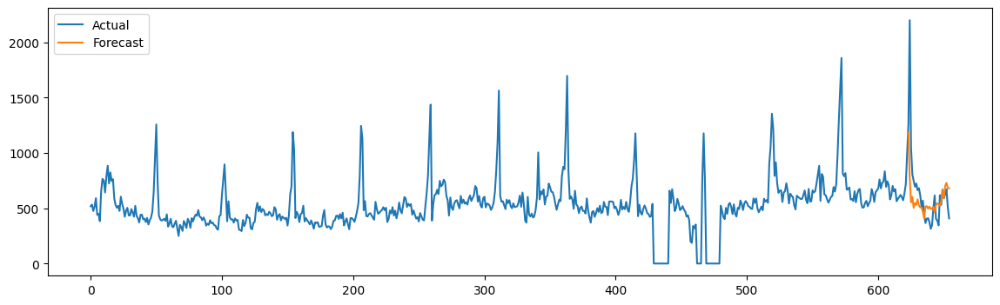

In [ ]:
visualisation_df_gs = pd.DataFrame({ "Actual": actual_gs, "Forecast": pred_gs })
visualisation_df_gs.plot(figsize=(14, 4))

In [ ]:
mae = mean_absolute_error(test_set, predictions)
mape = mean_absolute_percentage_error(test_set, predictions)


print("mae", mae)
print("mape", mape)

mae 170.23954118746104
mape 0.25918387022110756


# XGBoost - The Very Hungry Caterpillar

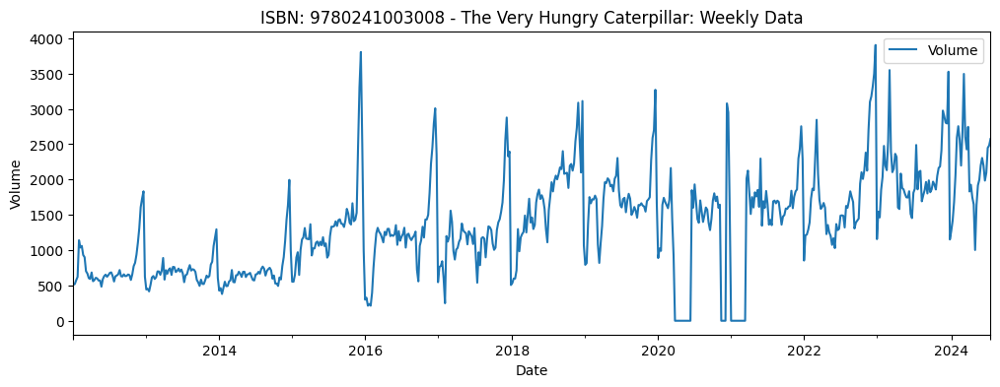

In [ ]:
caterpillar_df = plot_sales(caterpillar_isbn, "The Very Hungry Caterpillar: Weekly Data")

In [ ]:
complete_date_range = pd.date_range(start=caterpillar_df.index.min(), end=caterpillar_df.index.max(), freq='W')

In [ ]:
df_reindexed = caterpillar_df.reindex(complete_date_range)
caterpillar_df = df_reindexed.fillna(method='ffill')

In [ ]:
caterpillar_weekly_df = caterpillar_df['Volume'].resample('W').mean()

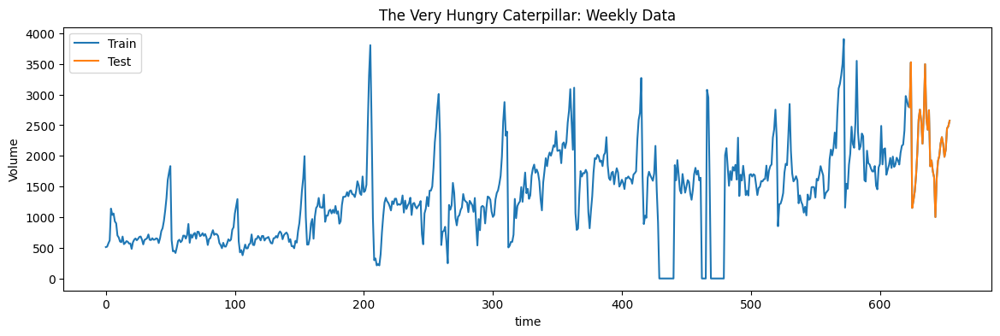

In [ ]:
caterpillar_weekly_train = plot_book_sales_data(caterpillar_weekly_df, 'The Very Hungry Caterpillar: Weekly Data', test_time_steps)

In [ ]:
caterpillar_weekly_df_train, caterpillar_weekly_df_test = caterpillar_weekly_df.iloc[:-test_time_steps], caterpillar_weekly_df.iloc[-test_time_steps:]

In [ ]:
def create_input_output_sequences_xgb(lookback, forecast, sequence_data):
  input_sequences = []
  output_sequences = []

  for i in range(lookback, len(sequence_data) - forecast + 1):
      input_sequences.append(sequence_data[i - lookback: i].tolist())
      output_sequences.append(sequence_data[i: i + forecast].tolist())

  return input_sequences, output_sequences

In [ ]:
param_tuning_obj = {
    'max_depth': hyperopt.hp.quniform("max_depth", 3, 18, 1),
    'gamma': hp.uniform ('gamma', 0,5),
    'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
    'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
    'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
    'n_estimators': 400,
    'seed': 0
  }

In [ ]:
train_set = caterpillar_weekly_df_train
test_set = caterpillar_weekly_df_test

In [ ]:
print(train_set.index)

train_set.index = pd.PeriodIndex(train_set.index, freq='W')

DatetimeIndex(['2012-01-08', '2012-01-15', '2012-01-22', '2012-01-29', '2012-02-05', '2012-02-12',
               '2012-02-19', '2012-02-26', '2012-03-04', '2012-03-11',
               ...
               '2023-10-08', '2023-10-15', '2023-10-22', '2023-10-29', '2023-11-05', '2023-11-12',
               '2023-11-19', '2023-11-26', '2023-12-03', '2023-12-10'],
              dtype='datetime64[ns]', length=623, freq='W-SUN')


In [ ]:
print(test_set.index)

test_set.index = pd.PeriodIndex(test_set.index, freq='W')

DatetimeIndex(['2023-12-17', '2023-12-24', '2023-12-31', '2024-01-07', '2024-01-14', '2024-01-21',
               '2024-01-28', '2024-02-04', '2024-02-11', '2024-02-18', '2024-02-25', '2024-03-03',
               '2024-03-10', '2024-03-17', '2024-03-24', '2024-03-31', '2024-04-07', '2024-04-14',
               '2024-04-21', '2024-04-28', '2024-05-05', '2024-05-12', '2024-05-19', '2024-05-26',
               '2024-06-02', '2024-06-09', '2024-06-16', '2024-06-23', '2024-06-30', '2024-07-07',
               '2024-07-14', '2024-07-21'],
              dtype='datetime64[ns]', freq='W-SUN')


In [ ]:
def auto_tune_training(param_tuning_obj):
  train_input, train_output = create_input_output_sequences_xgb(12, 1, train_set)
  test_input, test_output = create_input_output_sequences_xgb(12, 1, test_set)
  model = XGBRegressor(
          n_estimators = param_tuning_obj['n_estimators'],
          max_depth = int(param_tuning_obj['max_depth']),
          gamma = param_tuning_obj['gamma'],
          reg_alpha = int(param_tuning_obj['reg_alpha']),
          min_child_weight=int(param_tuning_obj['min_child_weight']),
          colsample_bytree=int(param_tuning_obj['colsample_bytree']),
          eval_metric="auc",
          early_stopping_rounds=10
        )

  evaluation = [(train_input, train_output), (test_input, test_output)]

  model.fit(train_input, train_output,
            eval_set=evaluation,verbose=False)


  pred = model.predict(test_input)
  preds = pred.flatten()
  accuracy = mean_absolute_error(test_output, pred)
  print ("MAE:", accuracy)
  return {'loss': accuracy, 'status': STATUS_OK }

In [ ]:
trials = Trials()

best_hyperparams = fmin(fn = auto_tune_training,
                        space = param_tuning_obj,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials)

MAE:
794.9683837890625
MAE:
803.7661376953125
MAE:
787.7826171875
MAE:
808.5602416992188
MAE:
798.0151184082031
MAE:
787.6253967285156
MAE:
800.8375549316406
MAE:
798.2459411621094
MAE:
795.7256591796875
MAE:
796.4428039550781
MAE:
796.8188232421875
MAE:
789.0236999511719
MAE:
790.6518249511719
MAE:
817.5922546386719
MAE:
803.8984619140625
MAE:
796.6142272949219
MAE:
817.0106811523438
MAE:
792.1679870605469
MAE:
798.2319458007812
MAE:
795.7256591796875
MAE:
787.6428649902343
MAE:
789.2752624511719
MAE:
787.1005432128907
MAE:
794.3461608886719
MAE:
790.4202697753906
MAE:
787.2243835449219
MAE:
787.5106018066406
MAE:
791.9740966796875
MAE:
786.9079223632813
MAE:
787.2833801269531
MAE:
793.6321716308594
MAE:
786.9670532226562
MAE:
796.0474304199219
MAE:
803.909326171875
MAE:
794.9874572753906
MAE:
787.2673767089843
MAE:
793.8513671875
MAE:
787.4507385253906
MAE:
786.8716735839844
MAE:
793.3006530761719
MAE:
795.9680480957031
MAE:
787.4679565429688
MAE:
802.171630859375
MAE:
787.5380798339

In [ ]:
# Output of the hyperparameter optimisation.
print(best_hyperparams)

{'colsample_bytree': 0.7852557516283126, 'gamma': 4.267167134744096, 'max_depth': 18.0, 'min_child_weight': 2.0, 'reg_alpha': 64.0}


In [ ]:
def create_predictor_with_deseasonaliser_xgboost(sp=52, degree=1):

    regressor = XGBRegressor(base_score=0.5,
                      n_estimators=400,
                      min_child_weight=int(best_hyperparams["min_child_weight"]),
                      max_depth=int(best_hyperparams["max_depth"]),
                      learning_rate=0.1,
                      booster='gbtree',
                      tree_method='exact',
                      reg_alpha=int(best_hyperparams["reg_alpha"]),
                      subsample=0.5,
                      validate_parameters=1,
                      colsample_bylevel=1,
                      colsample_bynode=1,
                      colsample_bytree=best_hyperparams["colsample_bytree"],
                      gamma=best_hyperparams["gamma"]
                    )
    forecaster = TransformedTargetForecaster(
        [
            ("deseasonalize", Deseasonalizer(model="additive", sp=sp)),
            ("detrend", Detrender(forecaster=PolynomialTrendForecaster(degree=degree))),
            (
                "forecast",
                make_reduction(regressor, window_length=32, strategy="recursive"),
            ),
        ]
    )

    return forecaster

In [ ]:
def grid_search_predictor(train, test, predictor, param_grid):

    # Grid search on window_length
    cv = ExpandingWindowSplitter(initial_window=int(len(train) * 0.7))
    gscv = ForecastingGridSearchCV(
        predictor, strategy="refit", cv=cv, param_grid=param_grid,
        scoring=MeanAbsolutePercentageError(symmetric=True), error_score="raise"
    )
    gscv.fit(train)
    print(f"Best parameters: {gscv.best_params_}")

    future_horizon = np.arange(len(test)) + 1
    print("future_horizon", future_horizon)
    predictions = gscv.predict(fh=future_horizon)

    return predictions

In [ ]:
predictor = create_predictor_with_deseasonaliser_xgboost()

# Set the window_length values to perform a grid search.
param_grid = {"forecast__window_length": [4, 8, 12, 16, 20, 24, 28, 32, 36]}


# Perform a grid search.
predictions = grid_search_predictor(
    train_set, test_set, predictor, param_grid
)

Best parameters: {'forecast__window_length': 18}
future_horizon [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32]


In [ ]:
print(predictions)

2023-12-11/2023-12-17    2657.208813
2023-12-18/2023-12-24    1756.639751
2023-12-25/2023-12-31    1121.362842
2024-01-01/2024-01-07    1267.545497
2024-01-08/2024-01-14    1464.240834
2024-01-15/2024-01-21    1532.923221
2024-01-22/2024-01-28    1548.206423
2024-01-29/2024-02-04    1655.304200
2024-02-05/2024-02-11    1669.674524
2024-02-12/2024-02-18    1756.551950
2024-02-19/2024-02-25    1976.838625
2024-02-26/2024-03-03    2135.773704
2024-03-04/2024-03-10    1779.110316
2024-03-11/2024-03-17    1933.196362
2024-03-18/2024-03-24    1948.643076
2024-03-25/2024-03-31    1874.785260
2024-04-01/2024-04-07    1671.959376
2024-04-08/2024-04-14    1580.047926
2024-04-15/2024-04-21    1676.554232
2024-04-22/2024-04-28    1847.512584
2024-04-29/2024-05-05    1846.035309
2024-05-06/2024-05-12    1925.194013
2024-05-13/2024-05-19    1859.021168
2024-05-20/2024-05-26    1991.675028
2024-05-27/2024-06-02    1832.051271
2024-06-03/2024-06-09    1895.388749
2024-06-10/2024-06-16    1807.574370
2

In [ ]:
actual_gs = list(train_set.values) + list(test_set.values)
len(actual_gs)

655

In [ ]:
pred_padding = [None] * len(train_set.values)
pred_gs = pred_padding + list(predictions.values)
len(pred_gs)

655

<Axes: >

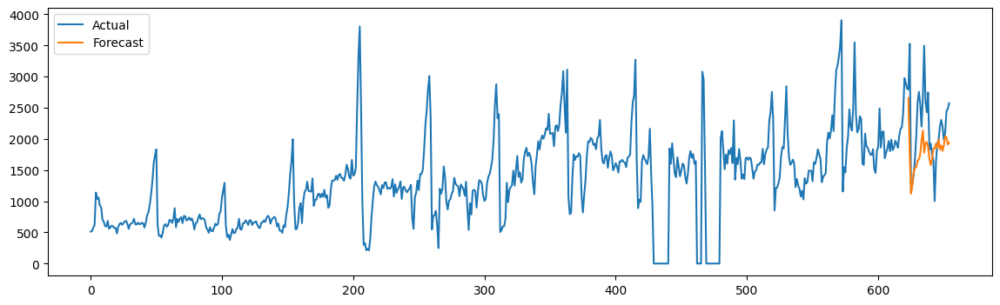

In [ ]:
visualisation_df_gs = pd.DataFrame({ "Actual": actual_gs, "Forecast": pred_gs })
visualisation_df_gs.plot(figsize=(14, 4))

In [ ]:
mae = mean_absolute_error(test_set, predictions)
mape = mean_absolute_percentage_error(test_set, predictions)


print("mae", mae)
print("mape", mape)

mae 465.294388491691
mape 0.19714753900699955


# Deep Learning - LSTM

# LSTM - The Alchemist

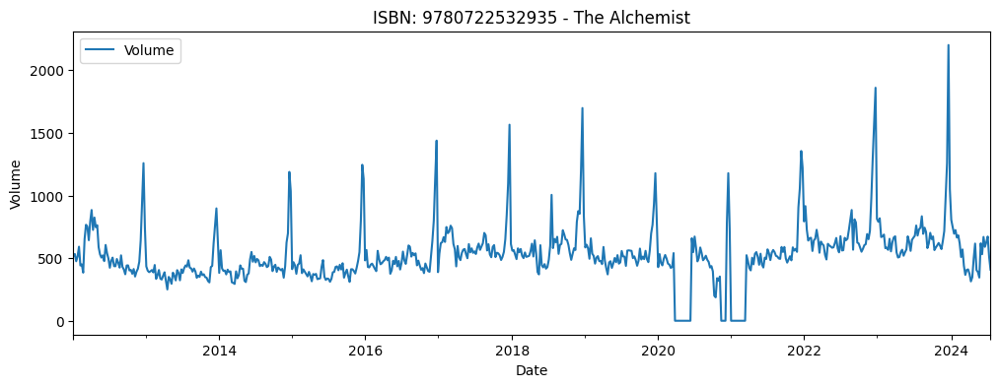

In [ ]:
alchemist_df = plot_sales(alchemist_isbn, "The Alchemist")

In [ ]:
# Normalise the data.
alchemist_sequence_data = alchemist_df_train[["Volume"]]
alchemist_sequence_data = alchemist_sequence_data.values.reshape(-1, 1)
scaler = MinMaxScaler(feature_range=(0, 1))
scaler = scaler.fit(alchemist_sequence_data)
alchemist_sequence_data = scaler.transform(alchemist_sequence_data)

In [ ]:
# Create input and output data in tabular form.
multi_step_input_sequences, multi_step_output_sequences = create_input_output_sequences(multi_step_lookback, multi_step_forecast, alchemist_sequence_data)
multi_step_input_sequences = np.array(multi_step_input_sequences)
multi_step_output_sequences = np.array(multi_step_output_sequences)

multi_step_last_available_input_sequence = alchemist_sequence_data[- multi_step_lookback:]  # last available input sequence
multi_step_last_available_input_sequence = multi_step_last_available_input_sequence.reshape(1, multi_step_lookback, 1)

In [ ]:
# Observe the shape of the input data and the output data.
print(multi_step_input_sequences.shape, " => ", multi_step_output_sequences.shape)

(488, 104, 1)  =>  (488, 32, 1)


In [ ]:
# Define the model for hyperparameter tuning.
def multi_step_tuned_model(hp):
    model = Sequential()
    model.add(LSTM(hp.Int('input_unit',min_value=4,max_value=128,step=8),return_sequences=True, input_shape=(multi_step_lookback, 1)))

    for i in range(hp.Int('n_layers', 1, 4)):
        model.add(LSTM(hp.Int(f'lstm_{i}_units',min_value=4,max_value=128,step=8),return_sequences=True))

    model.add(LSTM(hp.Int('layer_2_neurons',min_value=4,max_value=128,step=8)))
    model.add(Dropout(hp.Float('Dropout_rate',min_value=0,max_value=0.5,step=0.1)))
    model.add(Dense(multi_step_forecast, activation=hp.Choice('dense_activation',values=['relu', 'sigmoid'],default='relu')))
    model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mse'])

    return model

In [ ]:
multi_step_tuner = None

In [ ]:
multi_step_tuner = RandomSearch(
        multi_step_tuned_model,
        objective='mse',
        max_trials=3,
        executions_per_trial=1,
        overwrite=True,
        directory="LSTM",
        project_name="TheAlchemist",
    )

In [ ]:
multi_step_tuner.search(
        x=multi_step_input_sequences,
        y=multi_step_output_sequences,
        epochs=200,
        batch_size=32,
        validation_split=0.2
)

        #validation_data=(val_input,val_output),


Trial 3 Complete [00h 08m 20s]
mse: 0.0027399708051234484

Best mse So Far: 0.002547961426898837
Total elapsed time: 00h 29m 25s


In [ ]:
# Obtain the best parameters after tuning.
hp = multi_step_tuner.get_best_hyperparameters()[0]
hp.values

{'input_unit': 124,
 'n_layers': 1,
 'lstm_0_units': 44,
 'layer_2_neurons': 44,
 'Dropout_rate': 0.0,
 'dense_activation': 'relu',
 'lstm_1_units': 124,
 'lstm_2_units': 116}

In [ ]:
best_model = multi_step_tuner.get_best_models(num_models=1)[0]
print(best_model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 104, 124)          62496     
                                                                 
 lstm_1 (LSTM)               (None, 104, 44)           29744     
                                                                 
 lstm_2 (LSTM)               (None, 44)                15664     
                                                                 
 dropout (Dropout)           (None, 44)                0         
                                                                 
 dense (Dense)               (None, 32)                1440      
                                                                 
Total params: 109344 (427.12 KB)
Trainable params: 109344 (427.12 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
predictions=best_model.predict(multi_step_last_available_input_sequence)

1/1 [==============================] - 1s 1s/step


In [ ]:
predictions = predictions.reshape(-1, 1)
predictions = scaler.inverse_transform(predictions)

In [ ]:
# Visualise the output.
def data_for_visualisations(original_data, predictions, forecast):
  existing_data = original_data
  existing_data.rename(columns={'index': 'End Date', 'Volume': 'Actual'}, inplace=True)
  existing_data['End Date'] = existing_data['End Date']
  existing_data['Forecast'] = np.nan
  existing_data['Forecast'].iloc[-1] = existing_data['Actual'].iloc[-1]
  print(existing_data)

  predicted_data = pd.DataFrame(columns=['End Date', 'Actual', 'Forecast'])
  predicted_data['End Date'] = pd.date_range(start=existing_data['End Date'].iloc[-1] + pd.DateOffset(weeks=1), periods=forecast, freq="W")
  predicted_data['Forecast'] = predictions.flatten()
  predicted_data['Actual'] = np.nan

  print(predicted_data)

  composed_past_and_output_data = pd.concat([existing_data, predicted_data], ignore_index=True).set_index('End Date')

  return composed_past_and_output_data

In [ ]:
orig_alchemist_df = alchemist_df_train.copy()
orig_alchemist_df = orig_alchemist_df.reset_index()
composed_past_and_output_data = data_for_visualisations(orig_alchemist_df, predictions, multi_step_forecast)

      End Date  Actual  Forecast
0   2012-01-08   518.0       NaN
1   2012-01-15   533.0       NaN
2   2012-01-22   475.0       NaN
3   2012-01-29   514.0       NaN
4   2012-02-05   591.0       NaN
..         ...     ...       ...
618 2023-11-12   599.0       NaN
619 2023-11-19   572.0       NaN
620 2023-11-26   637.0       NaN
621 2023-12-03   716.0       NaN
622 2023-12-10   979.0     979.0

[623 rows x 3 columns]
     End Date  Actual     Forecast
0  2023-12-17     NaN  1352.365723
1  2023-12-24     NaN  1192.796875
2  2023-12-31     NaN   846.079529
3  2024-01-07     NaN   602.981506
4  2024-01-14     NaN   309.317383
5  2024-01-21     NaN   293.727814
6  2024-01-28     NaN   388.797058
7  2024-02-04     NaN   456.172943
8  2024-02-11     NaN   476.959290
9  2024-02-18     NaN   497.658112
10 2024-02-25     NaN   417.846741
11 2024-03-03     NaN   443.216309
12 2024-03-10     NaN   420.172302
13 2024-03-17     NaN   509.609222
14 2024-03-24     NaN   510.322510
15 2024-03-31     Na

In [ ]:
mae = mean_absolute_error(alchemist_df_test, predictions)
mape = mean_absolute_percentage_error(alchemist_df_test, predictions)

<Axes: title={'center': 'Multi-step model: The Alchemist - MAE:188.91 ; MAPE:0.3'}, xlabel='End Date'>

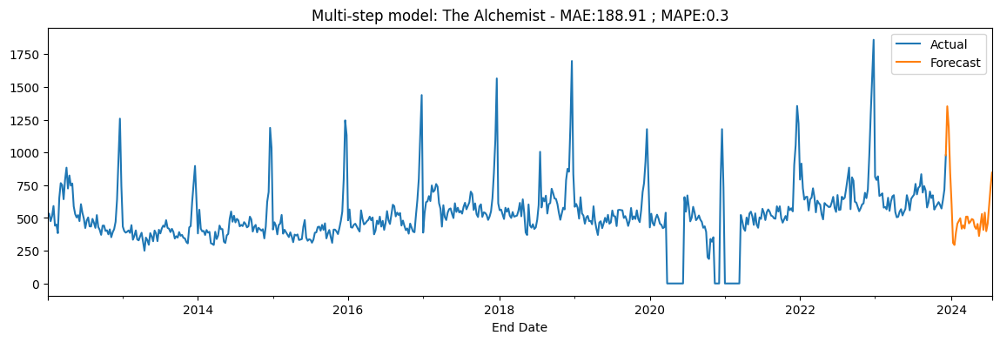

In [ ]:
composed_past_and_output_data.plot(title=f"Multi-step model: The Alchemist - MAE:{mae.round(2)} ; MAPE:{mape.round(2)}", figsize=(14, 4))

In [ ]:
rmse = np.sqrt(mean_squared_error(alchemist_df_test, predictions))
print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')

Root Mean Squared Error (RMSE): 262.38


# LSTM - The Very Hungry Caterpillar

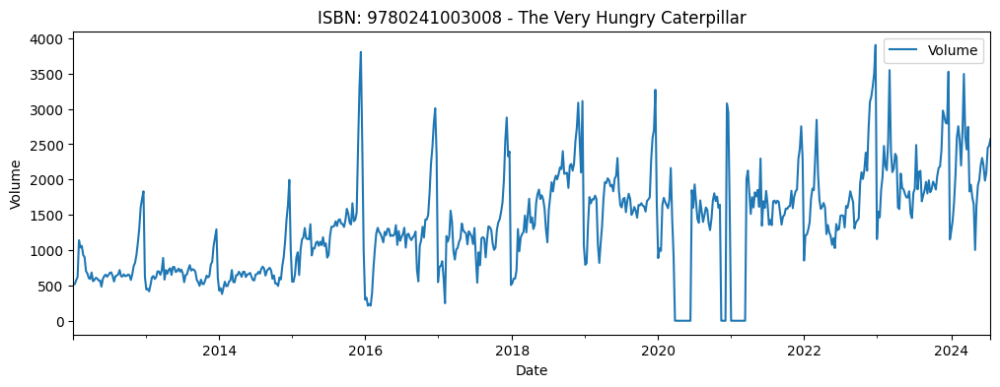

In [ ]:
caterpillar_df = plot_sales(caterpillar_isbn, "The Very Hungry Caterpillar")

In [ ]:
caterpillar_sequence_data = caterpillar_df_train[["Volume"]]
caterpillar_sequence_data = caterpillar_sequence_data.values.reshape(-1, 1)

scaler = MinMaxScaler(feature_range=(0, 1))
scaler = scaler.fit(caterpillar_sequence_data)
caterpillar_sequence_data = scaler.transform(caterpillar_sequence_data)

In [ ]:
# Create input and output data in tabular form.
multi_step_caterpillar_input_sequences, multi_step_caterpillar_output_sequences = create_input_output_sequences(multi_step_lookback, multi_step_forecast, caterpillar_sequence_data)
multi_step_caterpillar_input_sequences = np.array(multi_step_caterpillar_input_sequences)
multi_step_caterpillar_output_sequences = np.array(multi_step_caterpillar_output_sequences)

multi_step_caterpillar_last_available_input_sequence = caterpillar_sequence_data[- multi_step_lookback:]  # last available input sequence
multi_step_caterpillar_last_available_input_sequence = multi_step_caterpillar_last_available_input_sequence.reshape(1, multi_step_lookback, 1)

In [ ]:
# Observe the shape of the input data and the output data.
print(multi_step_caterpillar_input_sequences.shape, " => ", multi_step_caterpillar_output_sequences.shape)

(488, 104, 1)  =>  (488, 32, 1)


In [ ]:
# Define the model for hyperparameter tuning.
def multi_step_tuned_caterpillar_model(hp):
    model = Sequential()
    model.add(LSTM(hp.Int('input_unit',min_value=4,max_value=128,step=8),return_sequences=True, input_shape=(multi_step_lookback, 1)))

    for i in range(hp.Int('n_layers', 1, 4)):
        model.add(LSTM(hp.Int(f'lstm_{i}_units',min_value=4,max_value=128,step=8),return_sequences=True))

    model.add(LSTM(hp.Int('layer_2_neurons',min_value=4,max_value=128,step=8)))
    model.add(Dropout(hp.Float('Dropout_rate',min_value=0,max_value=0.5,step=0.1)))
    model.add(Dense(multi_step_forecast, activation=hp.Choice('dense_activation',values=['relu', 'sigmoid'],default='relu')))
    model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mse'])

    return model

In [ ]:
multi_step_caterpillar_tuner = None

In [ ]:
multi_step_caterpillar_tuner = RandomSearch(
        multi_step_tuned_caterpillar_model,
        objective='mse',
        max_trials=3,
        executions_per_trial=1,
        overwrite=True,
        directory="LSTM",
        project_name="TheCaterpillar",
    )

In [ ]:
multi_step_caterpillar_tuner.search(
        x=multi_step_caterpillar_input_sequences,
        y=multi_step_caterpillar_output_sequences,
        epochs=200,
        batch_size=32,
        validation_split=0.2
)

Trial 3 Complete [00h 08m 34s]
mse: 0.0073690265417099

Best mse So Far: 0.0073690265417099
Total elapsed time: 00h 28m 28s


In [ ]:
# Obtain the best parameters after tuning.
hp_caterpillar = multi_step_caterpillar_tuner.get_best_hyperparameters()[0]
hp_caterpillar.values

{'input_unit': 12,
 'n_layers': 3,
 'lstm_0_units': 84,
 'layer_2_neurons': 60,
 'Dropout_rate': 0.4,
 'dense_activation': 'relu',
 'lstm_1_units': 28,
 'lstm_2_units': 92,
 'lstm_3_units': 52}

In [ ]:
best_model_caterpillar = multi_step_caterpillar_tuner.get_best_models(num_models=1)[0]
print(best_model_caterpillar.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 104, 12)           672       
                                                                 
 lstm_1 (LSTM)               (None, 104, 84)           32592     
                                                                 
 lstm_2 (LSTM)               (None, 104, 28)           12656     
                                                                 
 lstm_3 (LSTM)               (None, 104, 92)           44528     
                                                                 
 lstm_4 (LSTM)               (None, 60)                36720     
                                                                 
 dropout (Dropout)           (None, 60)                0         
                                                                 
 dense (Dense)               (None, 32)                1

In [ ]:
predictions=best_model_caterpillar.predict(multi_step_caterpillar_last_available_input_sequence)

1/1 [==============================] - 1s 1s/step


In [ ]:
predictions = predictions.reshape(-1, 1)
predictions = scaler.inverse_transform(predictions)

In [ ]:
orig_caterpillar_df = caterpillar_df_train.copy()
orig_caterpillar_df = orig_caterpillar_df.reset_index()
composed_past_and_output_data_orig_caterpillar = data_for_visualisations(orig_caterpillar_df, predictions, multi_step_forecast)

      End Date  Actual  Forecast
0   2012-01-08   512.0       NaN
1   2012-01-15   519.0       NaN
2   2012-01-22   574.0       NaN
3   2012-01-29   621.0       NaN
4   2012-02-05  1140.0       NaN
..         ...     ...       ...
618 2023-11-12  2185.0       NaN
619 2023-11-19  2413.0       NaN
620 2023-11-26  2976.0       NaN
621 2023-12-03  2896.0       NaN
622 2023-12-10  2804.0    2804.0

[623 rows x 3 columns]
     End Date  Actual     Forecast
0  2023-12-17     NaN  2191.129639
1  2023-12-24     NaN  2291.945801
2  2023-12-31     NaN  2335.208740
3  2024-01-07     NaN  2323.590332
4  2024-01-14     NaN  2317.043213
5  2024-01-21     NaN  2319.805908
6  2024-01-28     NaN  2301.521973
7  2024-02-04     NaN  2281.308105
8  2024-02-11     NaN  2285.661865
9  2024-02-18     NaN  2248.505615
10 2024-02-25     NaN  2234.407715
11 2024-03-03     NaN  2264.519531
12 2024-03-10     NaN  2323.977295
13 2024-03-17     NaN  2368.527832
14 2024-03-24     NaN  2381.104248
15 2024-03-31     Na

In [ ]:
mae = mean_absolute_error(caterpillar_df_test, predictions)
mape = mean_absolute_percentage_error(caterpillar_df_test, predictions)

<Axes: title={'center': 'Multi-step model: The Very Hungry Caterpillar - MAE:536.88 ; MAPE:0.27'}, xlabel='End Date'>

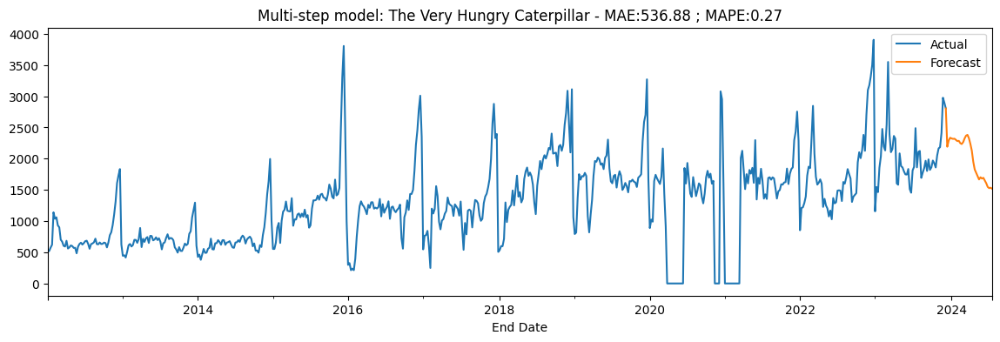

In [ ]:
composed_past_and_output_data_orig_caterpillar.plot(title=f"Multi-step model: The Very Hungry Caterpillar - MAE:{mae:.2f} ; MAPE:{mape:.2f}", figsize=(14, 4))

In [ ]:
rmse = np.sqrt(mean_squared_error(caterpillar_df_test, predictions))
print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')

Root Mean Squared Error (RMSE): 640.67


# Hybrid model - SARIMA and LSTM - Sequential - The Alchemist

In [ ]:
multi_step_lookback_10 = 10

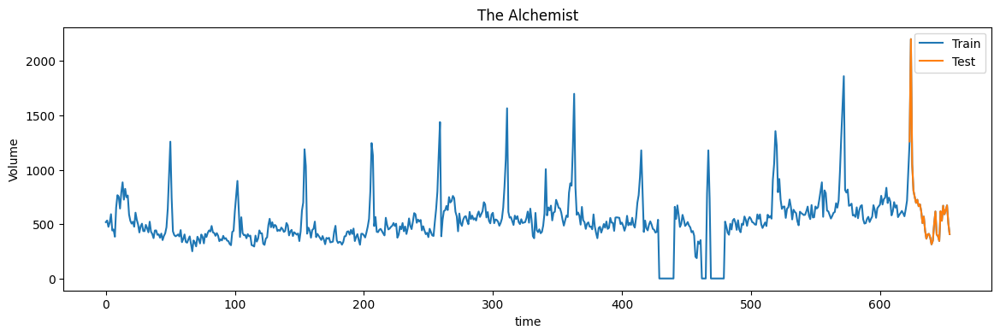

In [ ]:
alchemist_train = plot_book_sales_data(alchemist_Volume, 'The Alchemist', test_time_steps)

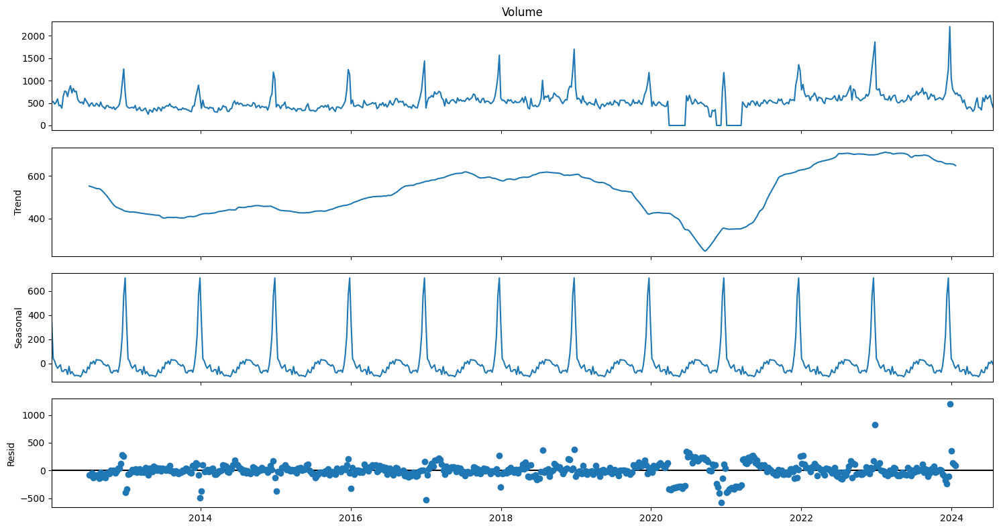

In [ ]:
decomposition = sm.tsa.seasonal_decompose(alchemist_Volume, model='additive')
fig = decomposition.plot()
plt.show()

In [ ]:
alchemist_df_train, alchemist_df_test = alchemist_df.iloc[:-test_time_steps], alchemist_df.iloc[-test_time_steps:]

In [ ]:
# Train an auto ARIMA model on the training data.
arima_model = auto_arima(alchemist_df_train["Volume"], seasonal=True, m=52, suppress_warnings=True)

In [ ]:
arima_model.fit(alchemist_df_train["Volume"])

ARIMA(order=(1, 1, 2), scoring_args={}, seasonal_order=(2, 0, 0, 52),
      suppress_warnings=True)

In [ ]:
# Obtain ARIMA predictions on the training data.
alchemist_df_train_pred = arima_model.predict_in_sample()

In [ ]:
# Obtain the residuals for the in-sample predictions.
alchemist_residuals_train = arima_model.resid()

In [ ]:
print(pd.DataFrame({'Original Data': alchemist_df_train["Volume"], 'In Sample ARIMA Predict': alchemist_df_train_pred, 'ARIMA Residuals': alchemist_residuals_train}))

            Original Data  In Sample ARIMA Predict  ARIMA Residuals
End Date                                                           
2012-01-08          518.0                -0.240540       518.240540
2012-01-15          533.0               515.265573        17.734427
2012-01-22          475.0               528.158312       -53.158312
2012-01-29          514.0               486.146478        27.853522
2012-02-05          591.0               509.413216        81.586784
...                   ...                      ...              ...
2023-11-12          599.0               662.831036       -63.831036
2023-11-19          572.0               613.510318       -41.510318
2023-11-26          637.0               620.226165        16.773835
2023-12-03          716.0               864.399587      -148.399587
2023-12-10          979.0               952.845579        26.154421

[623 rows x 3 columns]


In [ ]:
# Forecast future linear component using ARIMA
alchemist_df_test_pred = arima_model.predict(len(alchemist_df_test))

In [ ]:
# Normalise the data.
alchemist_residuals_sequence_data = alchemist_residuals_train
alchemist_residuals_sequence_data = alchemist_residuals_sequence_data.values.reshape(-1, 1)

scaler = MinMaxScaler(feature_range=(0, 1))
scaler = scaler.fit(alchemist_residuals_sequence_data)
alchemist_residuals_sequence_data = scaler.transform(alchemist_residuals_sequence_data)

In [ ]:
# Create input and output data in tabular form.
alchemist_residuals_input_sequences, alchemist_residuals_output_sequences = create_input_output_sequences(multi_step_lookback_10, 1, alchemist_residuals_sequence_data)
alchemist_residuals_input_sequences = np.array(alchemist_residuals_input_sequences)
alchemist_residuals_output_sequences = np.array(alchemist_residuals_output_sequences)

alchemist_residuals_last_available_input_sequence = alchemist_residuals_sequence_data[- multi_step_lookback_10:]  # last available input sequence
alchemist_residuals_last_available_input_sequence = alchemist_residuals_last_available_input_sequence.reshape(1, multi_step_lookback_10, 1)

In [ ]:
# Observe the shape of the input data and the output data.
print(alchemist_residuals_input_sequences.shape, " => ", alchemist_residuals_output_sequences.shape)

(613, 10, 1)  =>  (613, 1, 1)


In [ ]:
# Define the model for hyperparameter tuning.
def alchemist_residuals_tuned_model(hp):
    model = Sequential()
    model.add(LSTM(hp.Int('input_unit',min_value=4,max_value=128,step=8),return_sequences=True, input_shape=(multi_step_lookback_10, 1)))

    for i in range(hp.Int('n_layers', 1, 4)):
        model.add(LSTM(hp.Int(f'lstm_{i}_units',min_value=4,max_value=128,step=8),return_sequences=True))

    model.add(LSTM(hp.Int('layer_2_neurons',min_value=4,max_value=128,step=8)))
    model.add(Dropout(hp.Float('Dropout_rate',min_value=0,max_value=0.5,step=0.1)))
    model.add(Dense(1, activation=hp.Choice('dense_activation',values=['relu', 'sigmoid'],default='relu')))
    model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mse'])

    return model

In [ ]:
alchemist_residuals_tuner = None

In [ ]:
alchemist_residuals_tuner = RandomSearch(
        alchemist_residuals_tuned_model,
        objective='mse',
        max_trials=3,
        executions_per_trial=1,
        overwrite=True,
        directory="LSTM",
        project_name="TheAlchemistResiduals",
    )

In [ ]:
alchemist_residuals_tuner.search(
        x=alchemist_residuals_input_sequences,
        y=alchemist_residuals_output_sequences,
        epochs=200,
        batch_size=32,
        validation_split=0.2
)

Trial 3 Complete [00h 01m 27s]
mse: 0.008882712572813034

Best mse So Far: 0.008854608051478863
Total elapsed time: 00h 03m 43s


In [ ]:
# Obtain the best parameters after tuning.
hp = alchemist_residuals_tuner.get_best_hyperparameters()[0]
hp.values

{'input_unit': 4,
 'n_layers': 2,
 'lstm_0_units': 52,
 'layer_2_neurons': 108,
 'Dropout_rate': 0.30000000000000004,
 'dense_activation': 'sigmoid',
 'lstm_1_units': 4}

In [ ]:
alchemist_residuals_best_model = alchemist_residuals_tuner.get_best_models(num_models=1)[0]
print(alchemist_residuals_best_model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 10, 4)             96        
                                                                 
 lstm_1 (LSTM)               (None, 10, 52)            11856     
                                                                 
 lstm_2 (LSTM)               (None, 10, 4)             912       
                                                                 
 lstm_3 (LSTM)               (None, 108)               48816     
                                                                 
 dropout (Dropout)           (None, 108)               0         
                                                                 
 dense (Dense)               (None, 1)                 109       
                                                                 
Total params: 61789 (241.36 KB)
Trainable params: 61789 

In [ ]:
# Make predictions
alchemist_residuals_train_best_lstm_predict = alchemist_residuals_best_model.predict(alchemist_residuals_train)


20/20 [==============================] - 1s 3ms/step


In [ ]:
print(len(alchemist_residuals_train_best_lstm_predict))

623


In [ ]:
combined_train_pred = alchemist_df_train_pred + alchemist_residuals_train_best_lstm_predict.flatten()

In [ ]:
# Prepare test data residuals (use ARIMA forecast on test set to compute initial residuals)
alchemist_residuals_test = alchemist_df_test["Volume"] - alchemist_df_test_pred

In [ ]:
# Prepare test data residuals (use ARIMA forecast on test set to compute initial residuals)
alchemist_residuals_test = alchemist_df_test["Volume"] - alchemist_df_test_pred

# Normalise the data.
alchemist_residuals_test_sequence_data = alchemist_residuals_test
alchemist_residuals_test_sequence_data = alchemist_residuals_test_sequence_data.values.reshape(-1, 1)

scaler = MinMaxScaler(feature_range=(0, 1))
scaler = scaler.fit(alchemist_residuals_test_sequence_data)
alchemist_residuals_test_sequence_data = scaler.transform(alchemist_residuals_test_sequence_data)

In [ ]:
# Create input and output data in tabular form.
alchemist_residuals_test_input_sequences, alchemist_residuals_test_output_sequences = create_input_output_sequences(10, 1, alchemist_residuals_test_sequence_data)
alchemist_residuals_test_input_sequences = np.array(alchemist_residuals_test_input_sequences)
alchemist_residuals_test_output_sequences = np.array(alchemist_residuals_test_output_sequences)

In [ ]:
# Observe the shape of the input data and the output data.
print(alchemist_residuals_test_input_sequences.shape, " => ", alchemist_residuals_test_output_sequences.shape)

(22, 10, 1)  =>  (22, 1, 1)


In [ ]:
alchemist_residuals_best_model.fit(alchemist_residuals_test_input_sequences, alchemist_residuals_test_output_sequences, epochs=10, batch_size=32)

Epoch 1/10
1/1 [==============================] - 5s 5s/step - loss: 0.1184 - mse: 0.1184
Epoch 2/10
1/1 [==============================] - 0s 24ms/step - loss: 0.1137 - mse: 0.1137
Epoch 3/10
1/1 [==============================] - 0s 25ms/step - loss: 0.1022 - mse: 0.1022
Epoch 4/10
1/1 [==============================] - 0s 24ms/step - loss: 0.0858 - mse: 0.0858
Epoch 5/10
1/1 [==============================] - 0s 23ms/step - loss: 0.0620 - mse: 0.0620
Epoch 6/10
1/1 [==============================] - 0s 23ms/step - loss: 0.0366 - mse: 0.0366
Epoch 7/10
1/1 [==============================] - 0s 23ms/step - loss: 0.0143 - mse: 0.0143
Epoch 8/10
1/1 [==============================] - 0s 23ms/step - loss: 0.0086 - mse: 0.0086
Epoch 9/10
1/1 [==============================] - 0s 24ms/step - loss: 0.0131 - mse: 0.0131
Epoch 10/10
1/1 [==============================] - 0s 24ms/step - loss: 0.0159 - mse: 0.0159


In [ ]:
alchemist_residuals_test_best_lstm_predict = alchemist_residuals_best_model.predict(alchemist_residuals_test)

1/1 [==============================] - 0s 19ms/step


In [ ]:
alchemist_residuals_test_best_lstm_predict = scaler.inverse_transform(alchemist_residuals_test_best_lstm_predict)

In [ ]:
# Combine ARIMA and LSTM predictions for test data
combined_test_pred = alchemist_df_test_pred + alchemist_residuals_test_best_lstm_predict.flatten()

Training MSE: 320746.16
Test MSE: 1038214.21
Test MAE: 1007.31
Test MAPE: 31.69


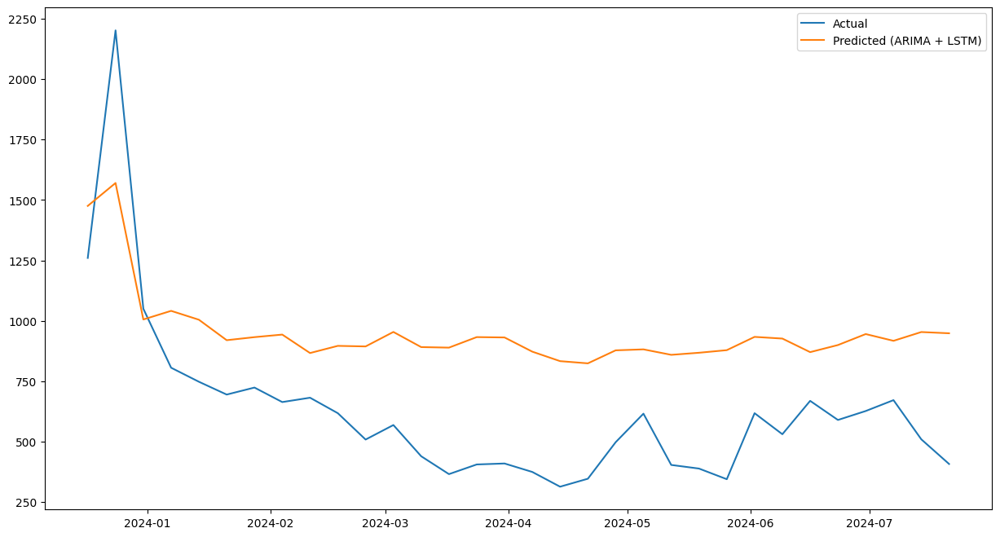

In [ ]:
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Evaluate MSE on the training set
train_mse = mean_squared_error(alchemist_residuals_train, combined_train_pred)
print(f'Training MSE: {train_mse:.2f}')

# Evaluate MSE on the test set
test_mse = mean_squared_error(alchemist_residuals_test, combined_test_pred)
print(f'Test MSE: {test_mse:.2f}')

# Evaluate MAE on the test set
mae = mean_absolute_error(alchemist_residuals_test, combined_test_pred)
print(f'Test MAE: {mae:.2f}')

# Evaluate MAPE on the test set
mape = mean_absolute_percentage_error(alchemist_residuals_test, combined_test_pred)
print(f'Test MAPE: {mape:.2f}')


# Plot actual vs predicted values for test data
plt.plot(alchemist_df_test, label='Actual')
plt.plot(combined_test_pred, label='Predicted (ARIMA + LSTM)')
plt.legend()
plt.show()

SARIMA model was used to initially predict the seasonal and trend components, and the residual component was predicted using the LSTM model.
The combined predictions have the following statistics Test MAE: 1007.31 Test MAPE: 31.69. The contour of the predictions roughly mirrors that of the observed values. The model could be further tuned to reduce the error.

# Hybrid model - SARIMA and LSTM - Parallel - The Alchemist

In [ ]:
multi_step_lookback_10 = 10

In [ ]:
# Prediction by ARIMA
alchemist_df_test_pred.info()

<class 'pandas.core.series.Series'>
DatetimeIndex: 32 entries, 2023-12-17 to 2024-07-21
Freq: W-SUN
Series name: None
Non-Null Count  Dtype  
--------------  -----  
32 non-null     float64
dtypes: float64(1)
memory usage: 512.0 bytes


In [ ]:
# Normalise the data.
alchemist_sequence_data = alchemist_df_train[["Volume"]]
alchemist_sequence_data = alchemist_sequence_data.values.reshape(-1, 1)
scaler = MinMaxScaler(feature_range=(0, 1))
scaler = scaler.fit(alchemist_sequence_data)
alchemist_sequence_data = scaler.transform(alchemist_sequence_data)

In [ ]:
# Create input and output data in tabular form.
multi_step_input_sequences, multi_step_output_sequences = create_input_output_sequences(multi_step_lookback_10, 1, alchemist_sequence_data)
multi_step_input_sequences = np.array(multi_step_input_sequences)
multi_step_output_sequences = np.array(multi_step_output_sequences)

multi_step_last_available_input_sequence = alchemist_sequence_data[- multi_step_lookback_10:]  # last available input sequence
multi_step_last_available_input_sequence = multi_step_last_available_input_sequence.reshape(1, multi_step_lookback_10, 1)

In [ ]:
# Observe the shape of the input data and the output data.
print(multi_step_input_sequences.shape, " => ", multi_step_output_sequences.shape)

(613, 10, 1)  =>  (613, 1, 1)


In [ ]:
# Define the model for hyperparameter tuning.
def alchemist_tuned_model(hp):
    model = Sequential()
    model.add(LSTM(hp.Int('input_unit',min_value=4,max_value=128,step=8),return_sequences=True, input_shape=(multi_step_lookback_10, 1)))

    for i in range(hp.Int('n_layers', 1, 4)):
        model.add(LSTM(hp.Int(f'lstm_{i}_units',min_value=4,max_value=128,step=8),return_sequences=True))

    model.add(LSTM(hp.Int('layer_2_neurons',min_value=4,max_value=128,step=8)))
    model.add(Dropout(hp.Float('Dropout_rate',min_value=0,max_value=0.5,step=0.1)))
    model.add(Dense(1, activation=hp.Choice('dense_activation',values=['relu', 'sigmoid'],default='relu')))
    model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mse'])

    return model

In [ ]:
alchemist_tuner = None

In [ ]:
alchemist_tuner = RandomSearch(
        alchemist_tuned_model,
        objective='mse',
        max_trials=3,
        executions_per_trial=1,
        overwrite=True,
        directory="LSTM",
        project_name="TheAlchemistLSTMParallel",
    )

In [ ]:
alchemist_tuner.search(
        x=multi_step_input_sequences,
        y=multi_step_output_sequences,
        epochs=200,
        batch_size=32,
        validation_split=0.2
)

Trial 3 Complete [00h 01m 32s]
mse: 0.0026402671355754137

Best mse So Far: 0.001415685866959393
Total elapsed time: 00h 04m 43s


In [ ]:
# Obtain the best parameters after tuning.
hp = alchemist_tuner.get_best_hyperparameters()[0]
hp.values

{'input_unit': 36,
 'n_layers': 4,
 'lstm_0_units': 20,
 'layer_2_neurons': 108,
 'Dropout_rate': 0.2,
 'dense_activation': 'relu',
 'lstm_1_units': 44,
 'lstm_2_units': 84,
 'lstm_3_units': 4}

In [ ]:
alchemist_best_model = alchemist_tuner.get_best_models(num_models=1)[0]
print(alchemist_best_model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 10, 36)            5472      
                                                                 
 lstm_1 (LSTM)               (None, 10, 20)            4560      
                                                                 
 lstm_2 (LSTM)               (None, 10, 44)            11440     
                                                                 
 lstm_3 (LSTM)               (None, 10, 84)            43344     
                                                                 
 lstm_4 (LSTM)               (None, 10, 4)             1424      
                                                                 
 lstm_5 (LSTM)               (None, 108)               48816     
                                                                 
 dropout (Dropout)           (None, 108)               0

In [ ]:
alchemist_test_best_lstm_pred = alchemist_best_model.predict(alchemist_df_test)

1/1 [==============================] - 1s 1s/step


In [ ]:
alchemist_test_best_lstm_pred = alchemist_test_best_lstm_pred.reshape(-1, 1)
alchemist_test_best_lstm_pred = scaler.inverse_transform(alchemist_test_best_lstm_pred)

In [ ]:
#Find weight with least mape score
arima_wt = 0.95
lstm_wt = 0.05
min_mape = 100
step = 0.05

min_arima_wt = 0.95
min_lstm_wt = 0.05

while lstm_wt < 10:
  alchemist_combined_pred = alchemist_df_test_pred * arima_wt + alchemist_test_best_lstm_pred.flatten() * lstm_wt
  mape = mean_absolute_percentage_error(alchemist_df_test, alchemist_combined_pred)

  if mape < min_mape:
    min_mape = mape
    min_arima_wt = round(arima_wt, 2)
    min_lstm_wt = round(lstm_wt, 2)

  arima_wt -= step
  lstm_wt += step

print(f'Min MAPE: {min_mape}')
print(f'arima_wt: {min_arima_wt}')
print(f'lstm_wt: {min_lstm_wt}')

Min MAPE: 0.24797628688644274
arima_wt: 0.5
lstm_wt: 0.5


In [ ]:
# Combine the predictions using a weighted average.
alchemist_combined_pred = alchemist_df_test_pred * min_arima_wt + alchemist_test_best_lstm_pred.flatten() * min_lstm_wt

# Display the combined predictions.
print(alchemist_combined_pred)

2023-12-17    798.057650
2023-12-24    845.446572
2023-12-31    563.279989
2024-01-07    581.051334
2024-01-14    562.643512
2024-01-21    520.411460
2024-01-28    526.735475
2024-02-04    531.621160
2024-02-11    493.869766
2024-02-18    508.294553
2024-02-25    507.195714
2024-03-03    537.131161
2024-03-10    505.833041
2024-03-17    504.717671
2024-03-24    526.486452
2024-03-31    525.765950
2024-04-07    496.396214
2024-04-14    476.783318
2024-04-21    472.217729
2024-04-28    499.129378
2024-05-05    501.302503
2024-05-12    489.816861
2024-05-19    494.133004
2024-05-26    499.508194
2024-06-02    526.926944
2024-06-09    523.460029
2024-06-16    495.750949
2024-06-23    510.039053
2024-06-30    532.759687
2024-07-07    519.076979
2024-07-14    536.958037
2024-07-21    534.401366
Freq: W-SUN, dtype: float64


Test MSE: 86428.91
Test MAE: 175.44
Test MAPE: 0.25


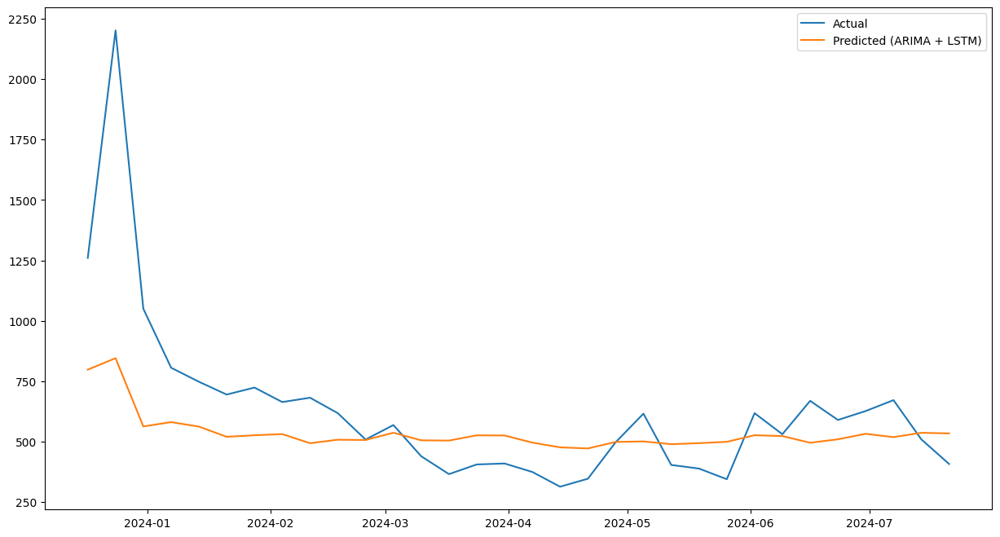

In [ ]:
# Evaluate MSE on the test set
test_mse = mean_squared_error(alchemist_df_test, alchemist_combined_pred)
print(f'Test MSE: {test_mse:.2f}')

# Evaluate MAE on the test set
mae = mean_absolute_error(alchemist_df_test, alchemist_combined_pred)
print(f'Test MAE: {mae:.2f}')

# Evaluate MAPE on the test set
mape = mean_absolute_percentage_error(alchemist_df_test, alchemist_combined_pred)
print(f'Test MAPE: {mape:.2f}')

# Plot actual vs predicted values for test data
plt.plot(alchemist_df_test, label='Actual')
plt.plot(alchemist_combined_pred, label='Predicted (ARIMA + LSTM)')
plt.legend()
plt.show()

The predictions were made using SARIMA model and LSTM model in parallel. The combined predictions have the following statistics Test MAE: 175.44 Test MAPE: 25. The contour of the predictions roughly mirrors that of the observed values. The model could be further tuned to reduce the error.

# Hybrid model - SARIMA and LSTM - Sequential - The Very Hungry Caterpillar

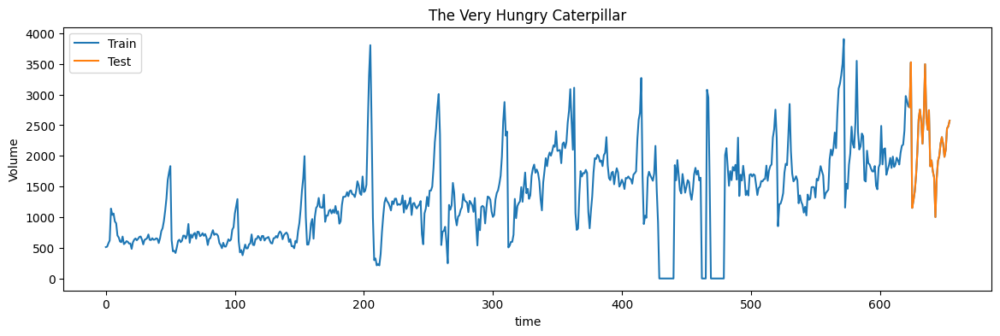

In [ ]:
caterpillar_train = plot_book_sales_data(caterpillar_Volume, 'The Very Hungry Caterpillar', test_time_steps)

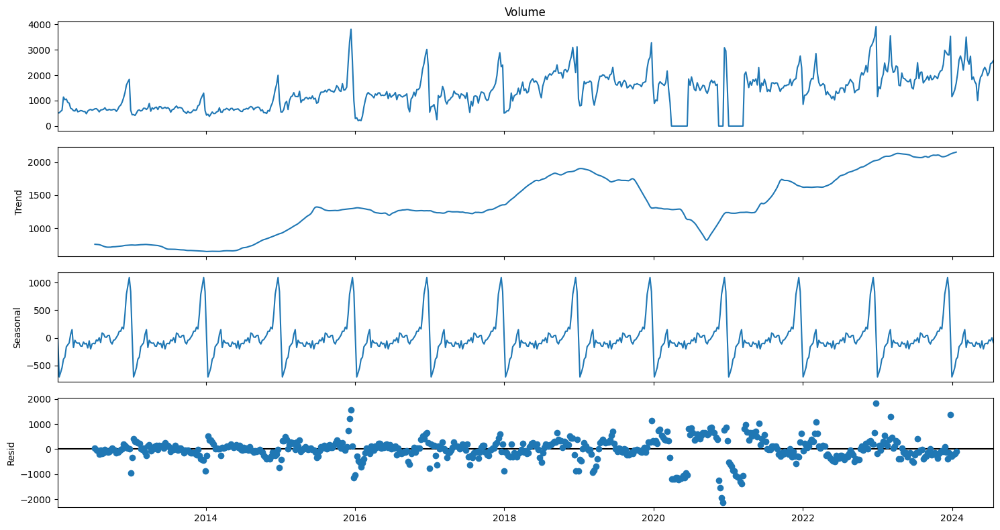

In [ ]:
decomposition = sm.tsa.seasonal_decompose(caterpillar_Volume, model='additive')
fig = decomposition.plot()
plt.show()

In [ ]:
caterpillar_df_train, caterpillar_df_test = caterpillar_df.iloc[:-test_time_steps], caterpillar_df.iloc[-test_time_steps:]

In [ ]:
# Train an auto ARIMA model on the training data.
caterpillar_arima_model = auto_arima(caterpillar_df_train["Volume"], seasonal=True, m=52, suppress_warnings=True)

In [ ]:
caterpillar_arima_model.fit(caterpillar_df_train["Volume"])

ARIMA(order=(2, 1, 1), scoring_args={}, seasonal_order=(1, 0, 2, 52),
      suppress_warnings=True, with_intercept=False)

In [ ]:
# Obtain ARIMA predictions on the training data.
caterpillar_df_train_pred = caterpillar_arima_model.predict_in_sample()

In [ ]:
# Obtain the residuals for the in-sample predictions.
caterpillar_residuals_train = caterpillar_arima_model.resid()

In [ ]:
print(pd.DataFrame({'Original Data': caterpillar_df_train["Volume"], 'In Sample ARIMA Predict': caterpillar_df_train_pred, 'ARIMA Residuals': caterpillar_residuals_train}))

            Original Data  In Sample ARIMA Predict  ARIMA Residuals
End Date                                                           
2012-01-08          512.0                 0.000000       512.000000
2012-01-15          519.0               508.387135        10.612865
2012-01-22          574.0               511.297370        62.702630
2012-01-29          621.0               563.116814        57.883186
2012-02-05         1140.0               603.967541       536.032459
...                   ...                      ...              ...
2023-11-12         2185.0              2072.235503       112.764497
2023-11-19         2413.0              2350.426934        62.573066
2023-11-26         2976.0              2496.819935       479.180065
2023-12-03         2896.0              2988.312876       -92.312876
2023-12-10         2804.0              2994.702901      -190.702901

[623 rows x 3 columns]


In [ ]:
# Forecast future linear component using ARIMA
caterpillar_df_test_pred = caterpillar_arima_model.predict(len(caterpillar_df_test))

In [ ]:
# Normalise the data.
caterpillar_residuals_sequence_data = caterpillar_residuals_train
caterpillar_residuals_sequence_data = caterpillar_residuals_sequence_data.values.reshape(-1, 1)

scaler = MinMaxScaler(feature_range=(0, 1))
scaler = scaler.fit(caterpillar_residuals_sequence_data)
caterpillar_residuals_sequence_data = scaler.transform(caterpillar_residuals_sequence_data)

In [ ]:
multi_step_lookback_10 = 10

In [ ]:
# Create input and output data in tabular form.
caterpillar_residuals_input_sequences, caterpillar_residuals_output_sequences = create_input_output_sequences(multi_step_lookback_10, 1, caterpillar_residuals_sequence_data)
caterpillar_residuals_input_sequences = np.array(caterpillar_residuals_input_sequences)
caterpillar_residuals_output_sequences = np.array(caterpillar_residuals_output_sequences)

caterpillar_residuals_last_available_input_sequence = caterpillar_residuals_sequence_data[- multi_step_lookback_10:]  # last available input sequence
caterpillar_residuals_last_available_input_sequence = caterpillar_residuals_last_available_input_sequence.reshape(1, multi_step_lookback_10, 1)

In [ ]:
# Observe the shape of the input data and the output data.
print(caterpillar_residuals_input_sequences.shape, " => ", caterpillar_residuals_output_sequences.shape)

(613, 10, 1)  =>  (613, 1, 1)


In [ ]:
# Define the model for hyperparameter tuning.
def caterpillar_residuals_tuned_model(hp):
    model = Sequential()
    model.add(LSTM(hp.Int('input_unit',min_value=4,max_value=128,step=8),return_sequences=True, input_shape=(multi_step_lookback_10, 1)))

    for i in range(hp.Int('n_layers', 1, 4)):
        model.add(LSTM(hp.Int(f'lstm_{i}_units',min_value=4,max_value=128,step=8),return_sequences=True))

    model.add(LSTM(hp.Int('layer_2_neurons',min_value=4,max_value=128,step=8)))
    model.add(Dropout(hp.Float('Dropout_rate',min_value=0,max_value=0.5,step=0.1)))
    model.add(Dense(1, activation=hp.Choice('dense_activation',values=['relu', 'sigmoid'],default='relu')))
    model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mse'])

    return model

In [ ]:
caterpillar_residuals_tuner = None

In [ ]:
caterpillar_residuals_tuner = RandomSearch(
        caterpillar_residuals_tuned_model,
        objective='mse',
        max_trials=3,
        executions_per_trial=1,
        overwrite=True,
        directory="LSTM",
        project_name="TheCaterpillarResiduals",
    )

In [ ]:
caterpillar_residuals_tuner.search(
        x=caterpillar_residuals_input_sequences,
        y=caterpillar_residuals_output_sequences,
        epochs=200,
        batch_size=32,
        validation_split=0.2
)

Trial 3 Complete [00h 01m 13s]
mse: 0.0051786028780043125

Best mse So Far: 0.005159115884453058
Total elapsed time: 00h 03m 53s


In [ ]:
# Obtain the best parameters after tuning.
hp = caterpillar_residuals_tuner.get_best_hyperparameters()[0]
hp.values

{'input_unit': 84,
 'n_layers': 1,
 'lstm_0_units': 4,
 'layer_2_neurons': 100,
 'Dropout_rate': 0.1,
 'dense_activation': 'sigmoid'}

In [ ]:
caterpillar_residuals_best_model = caterpillar_residuals_tuner.get_best_models(num_models=1)[0]
print(caterpillar_residuals_best_model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 10, 84)            28896     
                                                                 
 lstm_1 (LSTM)               (None, 10, 4)             1424      
                                                                 
 lstm_2 (LSTM)               (None, 100)               42000     
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense (Dense)               (None, 1)                 101       
                                                                 
Total params: 72421 (282.89 KB)
Trainable params: 72421 (282.89 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
# Make predictions
caterpillar_residuals_train_best_lstm_predict = caterpillar_residuals_best_model.predict(caterpillar_residuals_train)


20/20 [==============================] - 1s 3ms/step


In [ ]:
print(len(caterpillar_residuals_train_best_lstm_predict))

623


In [ ]:
combined_train_pred = caterpillar_df_train_pred + caterpillar_residuals_train_best_lstm_predict.flatten()

In [ ]:
# Prepare test data residuals (use ARIMA forecast on test set to compute initial residuals)
caterpillar_residuals_test = caterpillar_df_test["Volume"] - caterpillar_df_test_pred

In [ ]:
# Prepare test data residuals (use ARIMA forecast on test set to compute initial residuals)
caterpillar_residuals_test = caterpillar_df_test["Volume"] - caterpillar_df_test_pred

# Normalise the data.
caterpillar_residuals_test_sequence_data = caterpillar_residuals_test
caterpillar_residuals_test_sequence_data = caterpillar_residuals_test_sequence_data.values.reshape(-1, 1)

scaler = MinMaxScaler(feature_range=(0, 1))
scaler = scaler.fit(caterpillar_residuals_test_sequence_data)
caterpillar_residuals_test_sequence_data = scaler.transform(caterpillar_residuals_test_sequence_data)

In [ ]:
# Create input and output data in tabular form.
caterpillar_residuals_test_input_sequences, caterpillar_residuals_test_output_sequences = create_input_output_sequences(10, 1, caterpillar_residuals_test_sequence_data)
caterpillar_residuals_test_input_sequences = np.array(caterpillar_residuals_test_input_sequences)
caterpillar_residuals_test_output_sequences = np.array(caterpillar_residuals_test_output_sequences)

In [ ]:
# Observe the shape of the input data and the output data.
print(caterpillar_residuals_test_input_sequences.shape, " => ", caterpillar_residuals_test_output_sequences.shape)

(22, 10, 1)  =>  (22, 1, 1)


In [ ]:
caterpillar_residuals_best_model.fit(caterpillar_residuals_test_input_sequences, caterpillar_residuals_test_output_sequences, epochs=10, batch_size=32)

Epoch 1/10
1/1 [==============================] - 4s 4s/step - loss: 0.0515 - mse: 0.0515
Epoch 2/10
1/1 [==============================] - 0s 20ms/step - loss: 0.0501 - mse: 0.0501
Epoch 3/10
1/1 [==============================] - 0s 21ms/step - loss: 0.0500 - mse: 0.0500
Epoch 4/10
1/1 [==============================] - 0s 22ms/step - loss: 0.0474 - mse: 0.0474
Epoch 5/10
1/1 [==============================] - 0s 20ms/step - loss: 0.0455 - mse: 0.0455
Epoch 6/10
1/1 [==============================] - 0s 23ms/step - loss: 0.0441 - mse: 0.0441
Epoch 7/10
1/1 [==============================] - 0s 21ms/step - loss: 0.0428 - mse: 0.0428
Epoch 8/10
1/1 [==============================] - 0s 21ms/step - loss: 0.0412 - mse: 0.0412
Epoch 9/10
1/1 [==============================] - 0s 20ms/step - loss: 0.0405 - mse: 0.0405
Epoch 10/10
1/1 [==============================] - 0s 19ms/step - loss: 0.0398 - mse: 0.0398


In [ ]:
caterpillar_residuals_test_best_lstm_predict = caterpillar_residuals_best_model.predict(caterpillar_residuals_test)

1/1 [==============================] - 0s 18ms/step


In [ ]:
caterpillar_residuals_test_best_lstm_predict = scaler.inverse_transform(caterpillar_residuals_test_best_lstm_predict)

In [ ]:
# Combine ARIMA and LSTM predictions for test data
combined_test_pred = caterpillar_df_test_pred + caterpillar_residuals_test_best_lstm_predict.flatten()

Training MSE: 2138551.67
Test MSE: 4622603.11
Test MAE: 2105.11
Test MAPE: 30.96


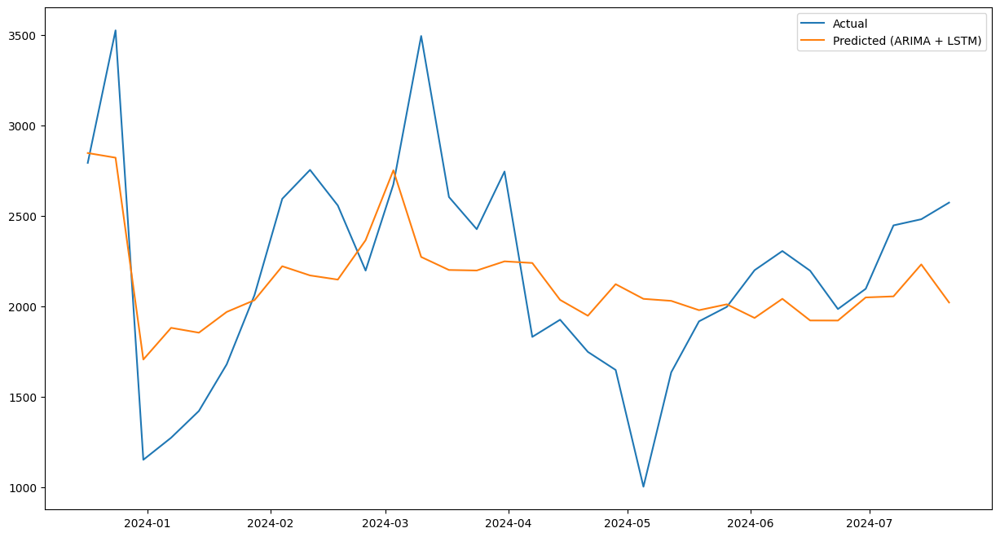

In [ ]:
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Evaluate MSE on the training set
train_mse = mean_squared_error(caterpillar_residuals_train, combined_train_pred)
print(f'Training MSE: {train_mse:.2f}')

# Evaluate MSE on the test set
test_mse = mean_squared_error(caterpillar_residuals_test, combined_test_pred)
print(f'Test MSE: {test_mse:.2f}')

# Evaluate MAE on the test set
mae = mean_absolute_error(caterpillar_residuals_test, combined_test_pred)
print(f'Test MAE: {mae:.2f}')

# Evaluate MAPE on the test set
mape = mean_absolute_percentage_error(caterpillar_residuals_test, combined_test_pred)
print(f'Test MAPE: {mape:.2f}')


# Plot actual vs predicted values for test data
plt.plot(caterpillar_df_test, label='Actual')
plt.plot(combined_test_pred, label='Predicted (ARIMA + LSTM)')
plt.legend()
plt.show()


The predictions has the following statistics Test MAE: 2105.11 Test MAPE: 30.96. The contour of the predictions roughly follows that of the observed values. The model could be further tuned to reduce the error.

# Hybrid model - SARIMA and LSTM - Parallel - The Very Hungry Caterpillar

In [ ]:
# Prediction by ARIMA
caterpillar_df_test_pred.info()

<class 'pandas.core.series.Series'>
DatetimeIndex: 32 entries, 2023-12-17 to 2024-07-21
Freq: W-SUN
Series name: None
Non-Null Count  Dtype  
--------------  -----  
32 non-null     float64
dtypes: float64(1)
memory usage: 512.0 bytes


In [ ]:
# Normalise the data.
caterpillar_sequence_data = caterpillar_df_train[["Volume"]]
caterpillar_sequence_data = caterpillar_sequence_data.values.reshape(-1, 1)
scaler = MinMaxScaler(feature_range=(0, 1))
scaler = scaler.fit(caterpillar_sequence_data)
caterpillar_sequence_data = scaler.transform(caterpillar_sequence_data)

In [ ]:
# Create input and output data in tabular form.
multi_step_input_sequences, multi_step_output_sequences = create_input_output_sequences(multi_step_lookback_10, 1, caterpillar_sequence_data)
multi_step_input_sequences = np.array(multi_step_input_sequences)
multi_step_output_sequences = np.array(multi_step_output_sequences)

multi_step_last_available_input_sequence = caterpillar_sequence_data[- multi_step_lookback_10:]  # last available input sequence
multi_step_last_available_input_sequence = multi_step_last_available_input_sequence.reshape(1, multi_step_lookback_10, 1)

In [ ]:
# Observe the shape of the input data and the output data.
print(multi_step_input_sequences.shape, " => ", multi_step_output_sequences.shape)

(613, 10, 1)  =>  (613, 1, 1)


In [ ]:
# Define the model for hyperparameter tuning.
def caterpillar_tuned_model(hp):
    model = Sequential()
    model.add(LSTM(hp.Int('input_unit',min_value=4,max_value=128,step=8),return_sequences=True, input_shape=(multi_step_lookback_10, 1)))

    for i in range(hp.Int('n_layers', 1, 4)):
        model.add(LSTM(hp.Int(f'lstm_{i}_units',min_value=4,max_value=128,step=8),return_sequences=True))

    model.add(LSTM(hp.Int('layer_2_neurons',min_value=4,max_value=128,step=8)))
    model.add(Dropout(hp.Float('Dropout_rate',min_value=0,max_value=0.5,step=0.1)))
    model.add(Dense(1, activation=hp.Choice('dense_activation',values=['relu', 'sigmoid'],default='relu')))
    model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mse'])

    return model

In [ ]:
caterpillar_tuner = None

In [ ]:
caterpillar_tuner = RandomSearch(
        caterpillar_tuned_model,
        objective='mse',
        max_trials=3,
        executions_per_trial=1,
        overwrite=True,
        directory="LSTM",
        project_name="TheCaterpillarLSTMParallel",
    )

In [ ]:
caterpillar_tuner.search(
        x=multi_step_input_sequences,
        y=multi_step_output_sequences,
        epochs=200,
        batch_size=32,
        validation_split=0.2
)

Trial 3 Complete [00h 01m 49s]
mse: 0.002716833958402276

Best mse So Far: 0.002716833958402276
Total elapsed time: 00h 04m 41s


In [ ]:
# Obtain the best parameters after tuning.
hp = caterpillar_tuner.get_best_hyperparameters()[0]
hp.values

{'input_unit': 108,
 'n_layers': 3,
 'lstm_0_units': 116,
 'layer_2_neurons': 44,
 'Dropout_rate': 0.1,
 'dense_activation': 'sigmoid',
 'lstm_1_units': 28,
 'lstm_2_units': 4,
 'lstm_3_units': 68}

In [ ]:
caterpillar_best_model = caterpillar_tuner.get_best_models(num_models=1)[0]
print(caterpillar_best_model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 10, 108)           47520     
                                                                 
 lstm_1 (LSTM)               (None, 10, 116)           104400    
                                                                 
 lstm_2 (LSTM)               (None, 10, 28)            16240     
                                                                 
 lstm_3 (LSTM)               (None, 10, 4)             528       
                                                                 
 lstm_4 (LSTM)               (None, 44)                8624      
                                                                 
 dropout (Dropout)           (None, 44)                0         
                                                                 
 dense (Dense)               (None, 1)                 4

In [ ]:
caterpillar_test_best_lstm_pred = caterpillar_best_model.predict(caterpillar_df_test)

1/1 [==============================] - 1s 1s/step


In [ ]:
caterpillar_test_best_lstm_pred = caterpillar_test_best_lstm_pred.reshape(-1, 1)
caterpillar_test_best_lstm_pred = scaler.inverse_transform(caterpillar_test_best_lstm_pred)

In [ ]:
#Find weight with least mape score
arima_wt = 0.95
lstm_wt = 0.05
min_mape = 100
step = 0.05

min_arima_wt = 0.95
min_lstm_wt = 0.05

while lstm_wt < 10:

  caterpillar_combined_pred = caterpillar_df_test_pred * arima_wt + caterpillar_test_best_lstm_pred.flatten() * lstm_wt
  mape = mean_absolute_percentage_error(caterpillar_df_test, caterpillar_combined_pred)

  if mape < min_mape:
    min_mape = mape
    min_arima_wt = round(arima_wt, 2)
    min_lstm_wt = round(lstm_wt, 2)

  arima_wt -= step
  lstm_wt += step

print(f'Min MAPE: {min_mape}')
print(f'arima_wt: {min_arima_wt}')
print(f'lstm_wt: {min_lstm_wt}')

Min MAPE: 0.18667281973705652
arima_wt: 0.95
lstm_wt: 0.05


In [ ]:
# Combine the predictions using a weighted average.
caterpillar_combined_pred = caterpillar_df_test_pred * min_arima_wt + caterpillar_test_best_lstm_pred.flatten() * min_lstm_wt

# Display the combined predictions.
print(caterpillar_combined_pred)

2023-12-17    2822.175883
2023-12-24    2804.684917
2023-12-31    1737.827095
2024-01-07    1904.478585
2024-01-14    1878.774800
2024-01-21    1987.540668
2024-01-28    2053.169443
2024-02-04    2234.115621
2024-02-11    2185.725632
2024-02-18    2163.836478
2024-02-25    2364.339457
2024-03-03    2731.528849
2024-03-10    2282.738461
2024-03-17    2214.437524
2024-03-24    2211.781991
2024-03-31    2259.765306
2024-04-07    2245.161424
2024-04-14    2050.529952
2024-04-21    1967.409422
2024-04-28    2133.804421
2024-05-05    2057.268766
2024-05-12    2045.957252
2024-05-19    1996.209138
2024-05-26    2026.679000
2024-06-02    1962.410963
2024-06-09    2062.890128
2024-06-16    1949.061896
2024-06-23    1948.896271
2024-06-30    2070.272571
2024-07-07    2075.659817
2024-07-14    2243.758707
2024-07-21    2043.517425
Freq: W-SUN, dtype: float64


Test MSE: 204218.43
Test MAE: 354.62
Test MAPE: 0.19


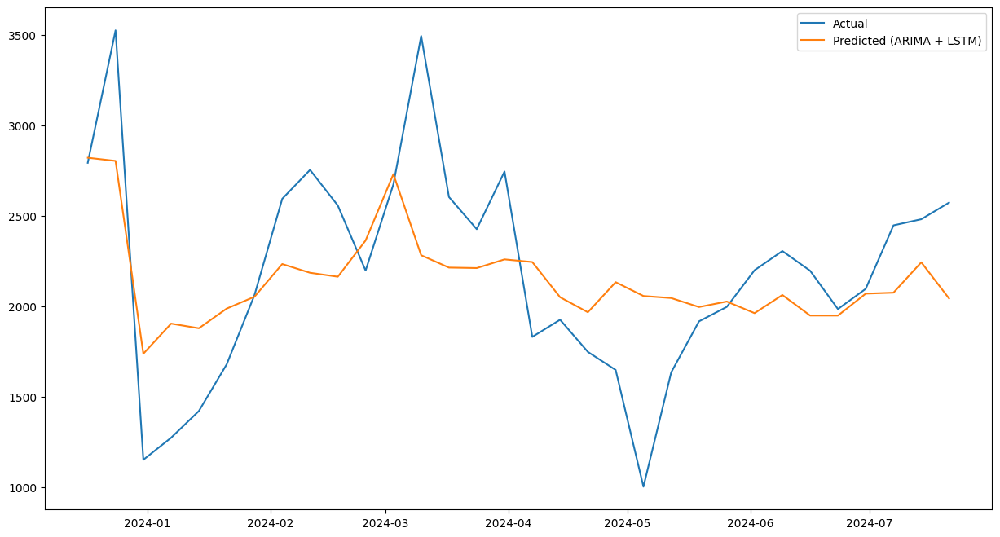

In [ ]:
# Evaluate MSE on the test set
test_mse = mean_squared_error(caterpillar_df_test, caterpillar_combined_pred)
print(f'Test MSE: {test_mse:.2f}')

# Evaluate MAE on the test set
mae = mean_absolute_error(caterpillar_df_test, caterpillar_combined_pred)
print(f'Test MAE: {mae:.2f}')

# Evaluate MAPE on the test set
mape = mean_absolute_percentage_error(caterpillar_df_test, caterpillar_combined_pred)
print(f'Test MAPE: {mape:.2f}')

# Plot actual vs predicted values for test data
plt.plot(caterpillar_df_test, label='Actual')
plt.plot(caterpillar_combined_pred, label='Predicted (ARIMA + LSTM)')
plt.legend()
plt.show()

The contours of the actual and predicted series close but the model is not able to predict the peaks accurately. MAPE of 19% seems to give the best achieved by combining 95% of ARIMA and 5% of LSTM model predictions. This suggests that the ARIMA has a better prediction and therefore having greater influence

# Monthly prediction - XGBoost - The Alchemist

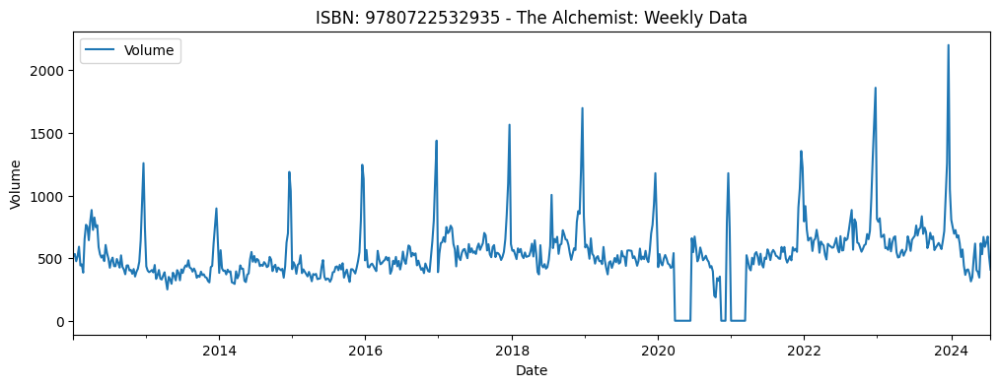

In [ ]:
alchemist_df = plot_sales(alchemist_isbn, "The Alchemist: Weekly Data")

In [ ]:
complete_date_range = pd.date_range(start=alchemist_df.index.min(), end=alchemist_df.index.max(), freq='W')

In [ ]:
df_reindexed = alchemist_df.reindex(complete_date_range)
alchemist_df = df_reindexed.fillna(method='ffill')

In [ ]:
alchemist_monthly_df = alchemist_df['Volume'].resample('M').sum()

In [ ]:
test_time_steps = 8

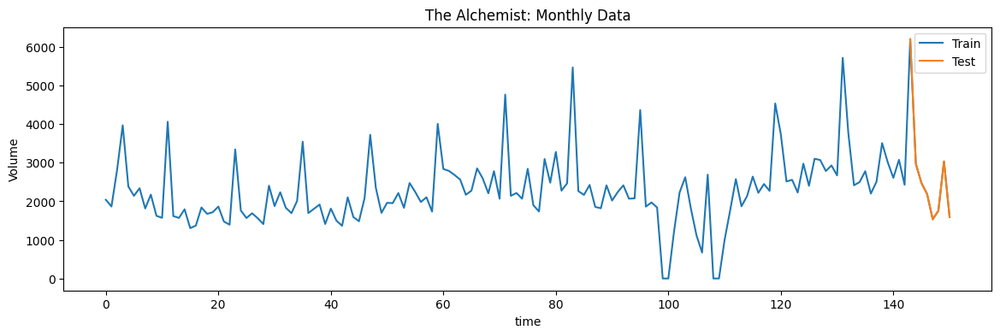

In [ ]:
alchemist_monthly_train = plot_book_sales_data(alchemist_monthly_df, 'The Alchemist: Monthly Data', test_time_steps)

In [ ]:
alchemist_monthly_df_train, alchemist_monthly_df_test = alchemist_monthly_df.iloc[:-test_time_steps], alchemist_monthly_df.iloc[-test_time_steps:]

In [ ]:
def create_input_output_sequences_xgb(lookback, forecast, sequence_data):
  input_sequences = []
  output_sequences = []

  for i in range(lookback, len(sequence_data) - forecast + 1):
      input_sequences.append(sequence_data[i - lookback: i].tolist())
      output_sequences.append(sequence_data[i: i + forecast].tolist())

  return input_sequences, output_sequences

In [ ]:
param_tuning_obj = {
    'max_depth': hyperopt.hp.quniform("max_depth", 3, 18, 1),
    'gamma': hp.uniform ('gamma', 0,5),
    'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
    'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
    'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
    'n_estimators': 400,
    'seed': 0
  }

In [ ]:
train_set = alchemist_monthly_df_train #.values
test_set = alchemist_monthly_df_test #.values

In [ ]:
print(train_set.index)

train_set.index = pd.PeriodIndex(train_set.index, freq='M')

DatetimeIndex(['2012-01-31', '2012-02-29', '2012-03-31', '2012-04-30', '2012-05-31', '2012-06-30',
               '2012-07-31', '2012-08-31', '2012-09-30', '2012-10-31',
               ...
               '2023-02-28', '2023-03-31', '2023-04-30', '2023-05-31', '2023-06-30', '2023-07-31',
               '2023-08-31', '2023-09-30', '2023-10-31', '2023-11-30'],
              dtype='datetime64[ns]', length=143, freq='ME')


In [ ]:
print(test_set.index)

test_set.index = pd.PeriodIndex(test_set.index, freq='M')

DatetimeIndex(['2023-12-31', '2024-01-31', '2024-02-29', '2024-03-31', '2024-04-30', '2024-05-31',
               '2024-06-30', '2024-07-31'],
              dtype='datetime64[ns]', freq='ME')


In [ ]:
def auto_tune_training(param_tuning_obj):
  train_input, train_output = create_input_output_sequences_xgb(4, 1, train_set)
  test_input, test_output = create_input_output_sequences_xgb(4, 1, test_set)
  model = XGBRegressor(
          n_estimators = param_tuning_obj['n_estimators'],
          max_depth = int(param_tuning_obj['max_depth']),
          gamma = param_tuning_obj['gamma'],
          reg_alpha = int(param_tuning_obj['reg_alpha']),
          min_child_weight=int(param_tuning_obj['min_child_weight']),
          colsample_bytree=int(param_tuning_obj['colsample_bytree']),
          eval_metric="auc",
          early_stopping_rounds=10
        )

  evaluation = [(train_input, train_output), (test_input, test_output)]

  model.fit(train_input, train_output,
            eval_set=evaluation,verbose=False)


  pred = model.predict(test_input)
  preds = pred.flatten()
  accuracy = mean_absolute_error(test_output, pred)
  print ("MAE:", accuracy)
  return {'loss': accuracy, 'status': STATUS_OK }

In [ ]:
trials = Trials()

best_hyperparams = fmin(fn = auto_tune_training,
                        space = param_tuning_obj,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials)

MAE:
596.580322265625
MAE:
578.2492065429688
MAE:
629.5609130859375
MAE:
587.4445190429688
MAE:
629.563232421875
MAE:
579.5179443359375
MAE:
662.446044921875
MAE:
607.5228881835938
MAE:
664.4483032226562
MAE:
664.4751586914062
MAE:
641.2322998046875
MAE:
641.5408325195312
MAE:
617.277099609375
MAE:
584.7107543945312
MAE:
664.45458984375
MAE:
664.5057373046875
MAE:
620.67626953125
MAE:
617.18798828125
MAE:
664.4750366210938
MAE:
652.7314453125
MAE:
578.2492065429688
MAE:
578.2129516601562
MAE:
583.4957275390625
MAE:
578.6116943359375
MAE:
594.9393920898438
MAE:
584.0695190429688
MAE:
595.3456420898438
MAE:
625.11181640625
MAE:
585.1157836914062
MAE:
578.7567138671875
MAE:
625.15869140625
MAE:
594.9231567382812
MAE:
609.8202514648438
MAE:
617.4505615234375
MAE:
584.0695190429688
MAE:
629.5584716796875
MAE:
586.060791015625
MAE:
603.259033203125
MAE:
625.186767578125
MAE:
627.7694702148438
MAE:
625.126708984375
MAE:
578.2492065429688
MAE:
617.2078247070312
MAE:
663.337890625
MAE:
584.1369

In [ ]:
# Output of the hyperparameter optimisation.
print(best_hyperparams)

{'colsample_bytree': 0.6295967739806139, 'gamma': 1.448920781730241, 'max_depth': 15.0, 'min_child_weight': 2.0, 'reg_alpha': 40.0}


In [ ]:
def create_predictor_with_deseasonaliser_xgboost(sp=12, degree=1):

    regressor = XGBRegressor(base_score=0.5,
                      n_estimators=400,
                      min_child_weight=int(best_hyperparams["min_child_weight"]),
                      max_depth=int(best_hyperparams["max_depth"]),
                      learning_rate=0.1,
                      booster='gbtree',
                      tree_method='exact',
                      reg_alpha=int(best_hyperparams["reg_alpha"]),
                      subsample=0.5,
                      validate_parameters=1,
                      colsample_bylevel=1,
                      colsample_bynode=1,
                      colsample_bytree=best_hyperparams["colsample_bytree"],
                      gamma=best_hyperparams["gamma"]
                    )
    forecaster = TransformedTargetForecaster(
        [
            ("deseasonalize", Deseasonalizer(model="additive", sp=sp)),
            ("detrend", Detrender(forecaster=PolynomialTrendForecaster(degree=degree))),
            (
                "forecast",
                make_reduction(regressor, window_length=12, strategy="recursive"),
            ),
        ]
    )

    return forecaster

In [ ]:
def grid_search_predictor(train, test, predictor, param_grid):

    # Grid search on window_length
    cv = ExpandingWindowSplitter(initial_window=int(len(train) * 0.7))
    gscv = ForecastingGridSearchCV(
        predictor, strategy="refit", cv=cv, param_grid=param_grid,
        scoring=MeanAbsolutePercentageError(symmetric=True), error_score="raise"
    )
    gscv.fit(train)
    print(f"Best parameters: {gscv.best_params_}")

    # forecasting -> At the moment, I have test data for 24 months and if I want to get 36 months into the future then
    # I would set my future horizon to be len(test)+36
    future_horizon = np.arange(len(test)) + 1
    print("future_horizon", future_horizon)
    predictions = gscv.predict(fh=future_horizon)

    return predictions

In [ ]:
predictor = create_predictor_with_deseasonaliser_xgboost()

# Set the window_length values to perform a grid search.

param_grid = {"forecast__window_length": [6, 12, 18, 24, 30, 36]}

# Perform a grid search.
predictions = grid_search_predictor(
    train_set, test_set, predictor, param_grid
)

Best parameters: {'forecast__window_length': 24}
future_horizon [1 2 3 4 5 6 7 8]


In [ ]:
print(predictions)

2023-12    4693.602443
2024-01    2629.437525
2024-02    2223.247274
2024-03    2810.090452
2024-04    2015.148027
2024-05    1898.031587
2024-06    2618.909861
2024-07    2799.721669
Freq: M, Name: Volume, dtype: float64


In [ ]:
actual_gs = list(train_set.values) + list(test_set.values)
len(actual_gs)

151

In [ ]:
pred_padding = [None] * len(train_set.values)
pred_gs = pred_padding + list(predictions.values)
len(pred_gs)

151

<Axes: >

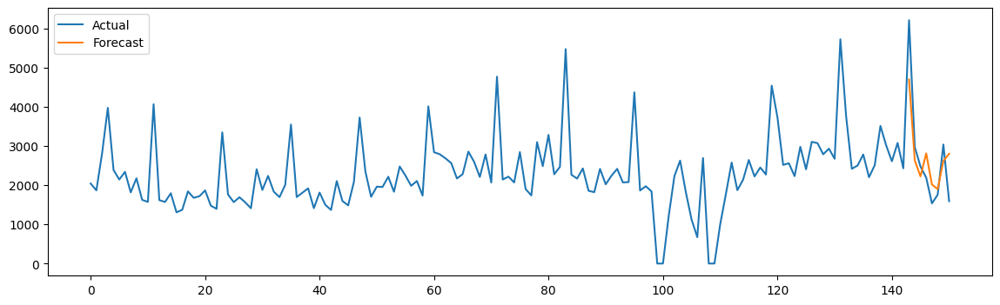

In [ ]:
visualisation_df_gs = pd.DataFrame({ "Actual": actual_gs, "Forecast": pred_gs })
visualisation_df_gs.plot(figsize=(14, 4))

In [ ]:
mae = mean_absolute_error(test_set, predictions)
mape = mean_absolute_percentage_error(test_set, predictions)


print("mae", mae)
print("mape", mape)

mae 621.974329024646
mape 0.2545641225912588


# Monthly prediction - XGBoost - The Very Hungry Caterpillar

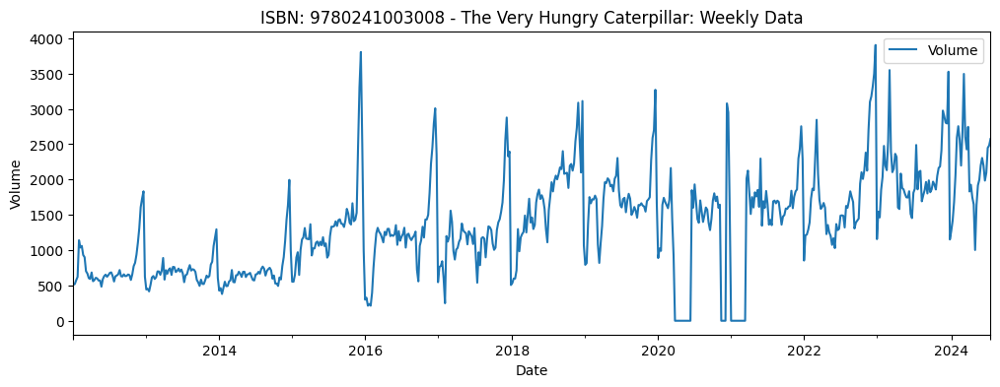

In [ ]:
caterpillar_df = plot_sales(caterpillar_isbn, "The Very Hungry Caterpillar: Weekly Data")

In [ ]:
complete_date_range = pd.date_range(start=caterpillar_df.index.min(), end=caterpillar_df.index.max(), freq='W')

In [ ]:
df_reindexed = caterpillar_df.reindex(complete_date_range)
caterpillar_df = df_reindexed.fillna(method='ffill')

In [ ]:
caterpillar_monthly_df = caterpillar_df['Volume'].resample('M').sum()

In [ ]:
test_time_steps = 8

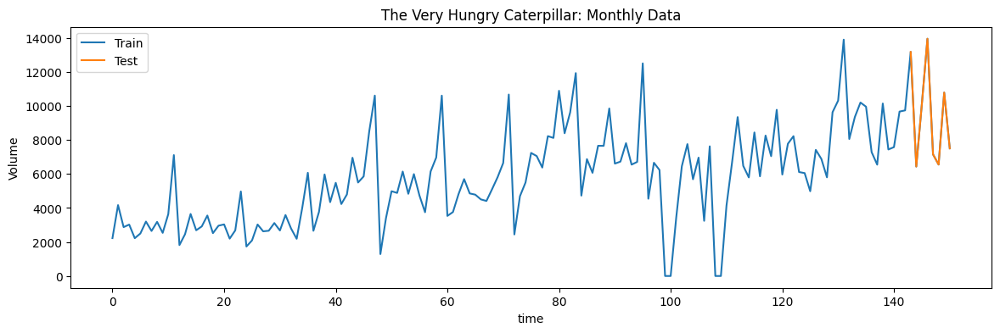

In [ ]:
caterpillar_monthly_train = plot_book_sales_data(caterpillar_monthly_df, "The Very Hungry Caterpillar: Monthly Data", test_time_steps)

In [ ]:
caterpillar_monthly_df_train, caterpillar_monthly_df_test = caterpillar_monthly_df.iloc[:-test_time_steps], caterpillar_monthly_df.iloc[-test_time_steps:]

In [ ]:
param_tuning_obj = {
    'max_depth': hyperopt.hp.quniform("max_depth", 3, 18, 1),
    'gamma': hp.uniform ('gamma', 0,5),
    'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
    'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
    'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
    'n_estimators': 400,
    'seed': 0
  }

In [ ]:
train_set = caterpillar_monthly_df_train
test_set = caterpillar_monthly_df_test

In [ ]:
print(train_set.index)

train_set.index = pd.PeriodIndex(train_set.index, freq='M')

DatetimeIndex(['2012-01-31', '2012-02-29', '2012-03-31', '2012-04-30', '2012-05-31', '2012-06-30',
               '2012-07-31', '2012-08-31', '2012-09-30', '2012-10-31',
               ...
               '2023-02-28', '2023-03-31', '2023-04-30', '2023-05-31', '2023-06-30', '2023-07-31',
               '2023-08-31', '2023-09-30', '2023-10-31', '2023-11-30'],
              dtype='datetime64[ns]', length=143, freq='ME')


In [ ]:
print(test_set.index)

test_set.index = pd.PeriodIndex(test_set.index, freq='M')

DatetimeIndex(['2023-12-31', '2024-01-31', '2024-02-29', '2024-03-31', '2024-04-30', '2024-05-31',
               '2024-06-30', '2024-07-31'],
              dtype='datetime64[ns]', freq='ME')


In [ ]:
def auto_tune_training(param_tuning_obj):
  train_input, train_output = create_input_output_sequences_xgb(4, 1, train_set)
  test_input, test_output = create_input_output_sequences_xgb(4, 1, test_set)
  model = XGBRegressor(
          n_estimators = param_tuning_obj['n_estimators'],
          max_depth = int(param_tuning_obj['max_depth']),
          gamma = param_tuning_obj['gamma'],
          reg_alpha = int(param_tuning_obj['reg_alpha']),
          min_child_weight=int(param_tuning_obj['min_child_weight']),
          colsample_bytree=int(param_tuning_obj['colsample_bytree']),
          eval_metric="auc",
          early_stopping_rounds=10
        )

  evaluation = [(train_input, train_output), (test_input, test_output)]

  model.fit(train_input, train_output,
            eval_set=evaluation,verbose=False)


  pred = model.predict(test_input)
  preds = pred.flatten()
  accuracy = mean_absolute_error(test_output, pred)
  print ("MAE:", accuracy)
  return {'loss': accuracy, 'status': STATUS_OK }

In [ ]:
trials = Trials()

best_hyperparams = fmin(fn = auto_tune_training,
                        space = param_tuning_obj,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials)

MAE:
1909.046630859375
MAE:
1835.180908203125
MAE:
1869.2509765625
MAE:
1833.80224609375
MAE:
1872.126708984375
MAE:
1873.864013671875
MAE:
1816.032958984375
MAE:
1817.7784423828125
MAE:
1818.1712646484375
MAE:
1874.927490234375
MAE:
1873.7532958984375
MAE:
1824.3330078125
MAE:
1873.8089599609375
MAE:
1886.427001953125
MAE:
1871.20263671875
MAE:
1908.6865234375
MAE:
1932.405517578125
MAE:
1955.0164794921875
MAE:
1874.74365234375
MAE:
1903.9500732421875
MAE:
1815.4439697265625
MAE:
1815.269287109375
MAE:
1728.3681640625
MAE:
1729.48291015625
MAE:
1872.25244140625
MAE:
1729.679443359375
MAE:
2003.480712890625
MAE:
1954.3436279296875
MAE:
1954.1005859375
MAE:
1873.3309326171875
MAE:
1730.26953125
MAE:
1871.9364013671875
MAE:
1945.0443115234375
MAE:
1833.33056640625
MAE:
1955.2408447265625
MAE:
1816.316650390625
MAE:
1815.902099609375
MAE:
1871.704833984375
MAE:
1903.32373046875
MAE:
1834.52783203125
MAE:
1873.0306396484375
MAE:
1877.7481689453125
MAE:
1815.8583984375
MAE:
1955.01647949218

In [ ]:
# Output of the hyperparameter optimisation.
print(best_hyperparams)

{'colsample_bytree': 0.7195124149846038, 'gamma': 3.585460399560435, 'max_depth': 15.0, 'min_child_weight': 2.0, 'reg_alpha': 41.0}


In [ ]:
def create_predictor_with_deseasonaliser_xgboost(sp=12, degree=1):

    regressor = XGBRegressor(base_score=0.5,
                      n_estimators=400,
                      min_child_weight=int(best_hyperparams["min_child_weight"]),
                      max_depth=int(best_hyperparams["max_depth"]),
                      learning_rate=0.1,
                      booster='gbtree',
                      tree_method='exact',
                      reg_alpha=int(best_hyperparams["reg_alpha"]),
                      subsample=0.5,
                      validate_parameters=1,
                      colsample_bylevel=1,
                      colsample_bynode=1,
                      colsample_bytree=best_hyperparams["colsample_bytree"],
                      gamma=best_hyperparams["gamma"]
                    )
    forecaster = TransformedTargetForecaster(
        [
            ("deseasonalize", Deseasonalizer(model="additive", sp=sp)),
            ("detrend", Detrender(forecaster=PolynomialTrendForecaster(degree=degree))),
            (
                "forecast",
                make_reduction(regressor, window_length=12, strategy="recursive"),
            ),
        ]
    )

    return forecaster

In [ ]:
def grid_search_predictor(train, test, predictor, param_grid):

    # Grid search on window_length
    cv = ExpandingWindowSplitter(initial_window=int(len(train) * 0.7))
    gscv = ForecastingGridSearchCV(
        predictor, strategy="refit", cv=cv, param_grid=param_grid,
        scoring=MeanAbsolutePercentageError(symmetric=True), error_score="raise"
    )
    gscv.fit(train)
    print(f"Best parameters: {gscv.best_params_}")

    future_horizon = np.arange(len(test)) + 1
    print("future_horizon", future_horizon)
    predictions = gscv.predict(fh=future_horizon)

    return predictions

In [ ]:
predictor = create_predictor_with_deseasonaliser_xgboost()

# Set the window_length values to perform a grid search.

param_grid = {"forecast__window_length": [6, 12, 18, 24, 30, 36]}

# Perform a grid search.
predictions = grid_search_predictor(
    train_set, test_set, predictor, param_grid
)

Best parameters: {'forecast__window_length': 18}
future_horizon [1 2 3 4 5 6 7 8]


In [ ]:
print(predictions)

2023-12    12902.316167
2024-01     6248.272562
2024-02     7904.501537
2024-03     8871.568423
2024-04     8574.255629
2024-05     8822.773715
2024-06     7960.800231
2024-07     8333.430508
Freq: M, Name: Volume, dtype: float64


In [ ]:
actual_gs = list(train_set.values) + list(test_set.values)
len(actual_gs)

151

In [ ]:
pred_padding = [None] * len(train_set.values)
pred_gs = pred_padding + list(predictions.values)
len(pred_gs)

151

<Axes: >

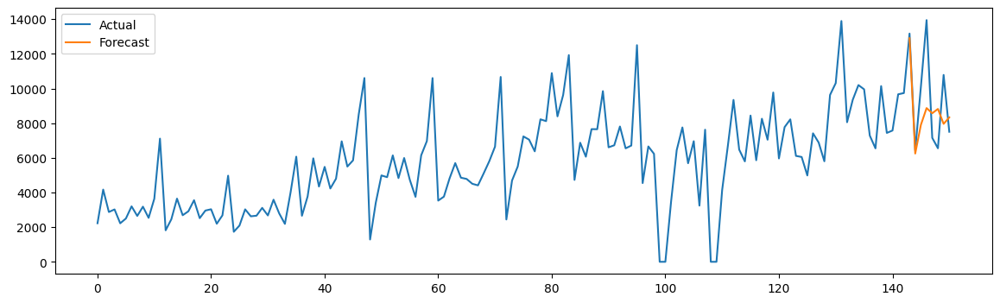

In [ ]:
visualisation_df_gs = pd.DataFrame({ "Actual": actual_gs, "Forecast": pred_gs })
visualisation_df_gs.plot(figsize=(14, 4))

In [ ]:
mae = mean_absolute_error(test_set, predictions)
mape = mean_absolute_percentage_error(test_set, predictions)


print("mae", mae)
print("mape", mape)

mae 1885.2501164046107
mape 0.19365046956823873


# Monthly prediction - Auto ARIMA - The Alchemist

In [ ]:
test_time_steps = 8

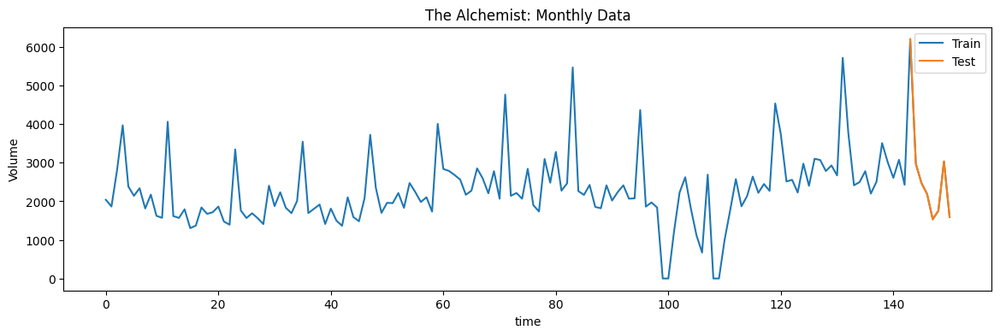

In [ ]:
alchemist_monthly_train = plot_book_sales_data(alchemist_monthly_df, "The Alchemist: Monthly Data", test_time_steps)

In [ ]:
alchemist_monthly_df_train, alchemist_monthly_df_test = alchemist_monthly_df.iloc[:-test_time_steps], alchemist_monthly_df.iloc[-test_time_steps:]

In [ ]:
# Define the model.
alchemist_model = auto_arima(y=alchemist_monthly_df_train, X=None,
                   start_p=0, d=None, start_q=0, max_p=5, max_d=2, max_q=5,
                   start_P=0, D=None, start_Q=0, max_P=2, max_D=1, max_Q=2,
                   max_order=10, m=12, seasonal=True, stationary=True,
                   information_criterion='aic', alpha=0.05,
                   test='kpss', seasonal_test='ocsb',
                   stepwise=True, n_jobs=1, start_params=None, trend=None,
                   method='lbfgs', maxiter=50, offset_test_args=None, seasonal_test_args=None,
                   suppress_warnings=True, error_action='trace',
                   trace=False, random=False, random_state=None, n_fits=10,
                   return_valid_fits=False, out_of_sample_size=0, scoring='mse',
                   scoring_args=None, with_intercept='auto', sarimax_kwargs=None)

# Print model results.
alchemist_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  143
Model:             SARIMAX(0, 0, 1)x(1, 0, 1, 12)   Log Likelihood               -1132.143
Date:                            Mon, 07 Oct 2024   AIC                           2274.286
Time:                                    00:07:18   BIC                           2289.100
Sample:                                01-31-2012   HQIC                          2280.305
                                     - 11-30-2023                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    562.3855    202.375      2.779      0.005     165.738     959.033
ma.L1          0.4841      0.068      7.076      0.000       0.350       0.618
ar.S.L12       0.7735      0.078      9.859      0.000       0.620       0.927
ma.S.L12      -0.2909      0.136     -2.141      0.032      -0.557      -0.025
sigma2      3.975e+05   4.24e+04      9.368      0.000    3.14e+05    4.81e+05
===================================================================================
Ljung-Box (L1) (Q):                   2.72   Jarque-Bera (JB):                 6.04
Prob(Q):                              0.10   Prob(JB):                         0.05
Heteroskedasticity (H):               2.16   Skew:                             0.10
Prob(H) (two-sided):                  0.01   Kurtosis:                         3.99
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The best model is SARIMAX(1, 0, 0)x(1, 0, [1], 12) with AIC of 	2274.29.

p values of model parameters ar.L1, ar.S.L12, ma.S.L12	are all less than .05 therefore they are all significant.

p value of Ljung - Box test is high, therefore it suggests there is no auto correlation.

The low p value of Jarque-Bera (JB) test suggests that the residuals are not normally distributed.

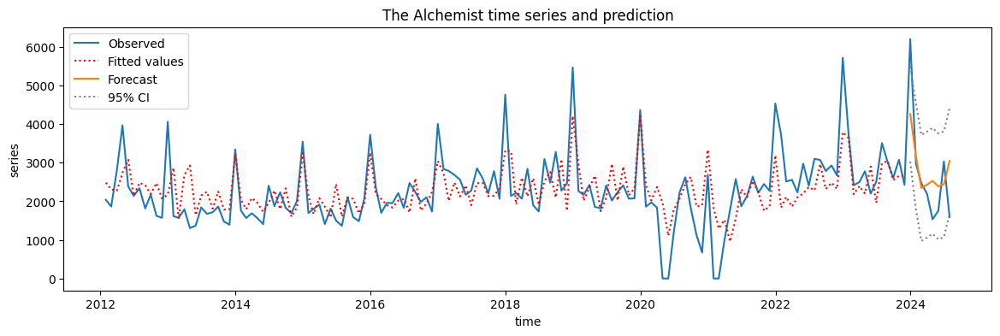

In [ ]:
alchemist_model, predictions = arima_predict_and_visualise(alchemist_model, alchemist_monthly_train, test_time_steps, alchemist_monthly_df, 'The Alchemist')

The contour of the predicted values does not closely mirror that of the observed values. The model could be fine tuned by stabilising the residuals as the predictions seem to fairly capture the trend and seasonality components. However the 95% confidence interval covers the observed values.

In [ ]:
mae = mean_absolute_error(alchemist_monthly_df_test, predictions[0])
mape = mean_absolute_percentage_error(alchemist_monthly_df_test, predictions[0])

print("mae", mae)
print("mape", mape)

mae 773.1519785637814
mape 0.3328241446636011


Text(0, 0.5, 'Frequency')

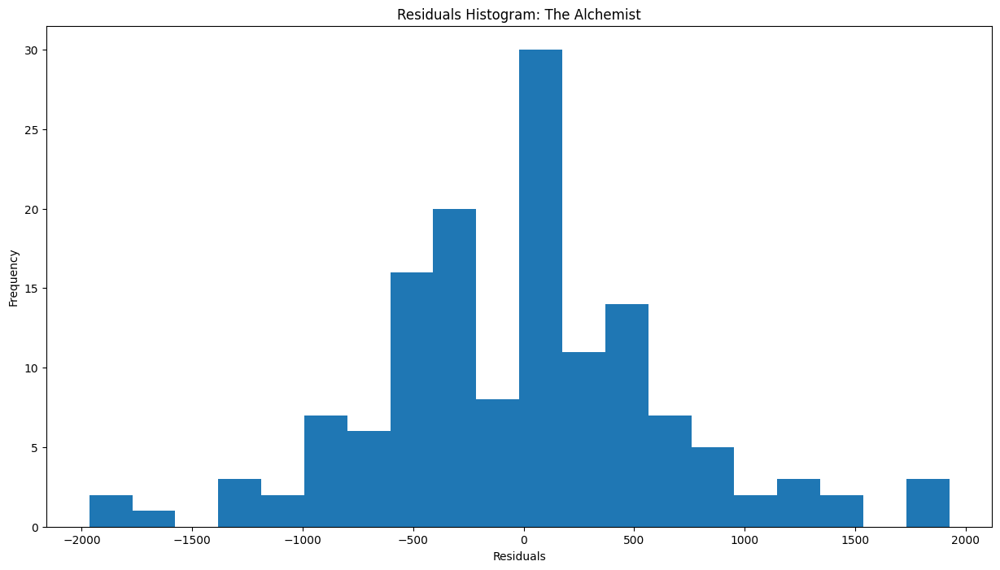

In [ ]:
# Plot the histogram of the residuals.
plt.hist(alchemist_model.resid()[1:], bins=20)
plt.title('Residuals Histogram: The Alchemist')
plt.xlabel('Residuals')
plt.ylabel('Frequency')

The p value of JB test is low indicating that the residuals are not normally distributed whereas the histogram looks normally distributed.

# Monthly prediction - Auto ARIMA - The Very Hungry Caterpillar

In [ ]:
test_time_steps = 8

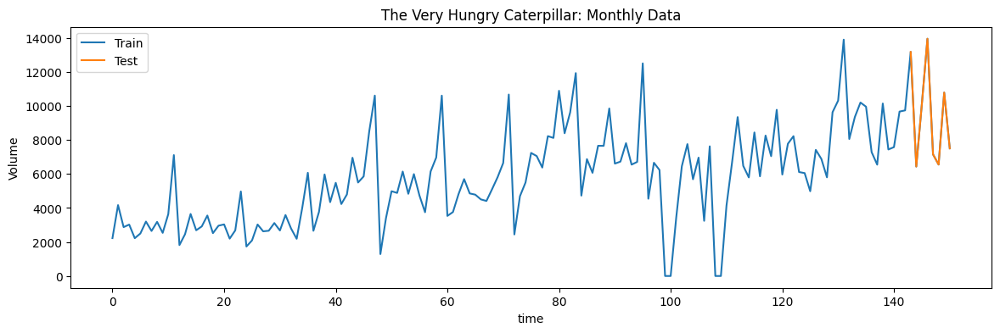

In [ ]:
caterpillar_monthly_train = plot_book_sales_data(caterpillar_monthly_df, "The Very Hungry Caterpillar: Monthly Data", test_time_steps)

In [ ]:
caterpillar_monthly_df_train, caterpillar_monthly_df_test = caterpillar_monthly_df.iloc[:-test_time_steps], caterpillar_monthly_df.iloc[-test_time_steps:]

In [ ]:
# Define the model.
caterpillar_model = auto_arima(y=caterpillar_monthly_df_train, X=None,
                   start_p=0, d=None, start_q=0, max_p=5, max_d=2, max_q=5,
                   start_P=0, D=None, start_Q=0, max_P=2, max_D=1, max_Q=2,
                   max_order=10, m=12, seasonal=True, stationary=True,
                   information_criterion='aic', alpha=0.05,
                   test='kpss', seasonal_test='ocsb',
                   stepwise=True, n_jobs=1, start_params=None, trend=None,
                   method='lbfgs', maxiter=50, offset_test_args=None, seasonal_test_args=None,
                   suppress_warnings=True, error_action='trace',
                   trace=False, random=False, random_state=None, n_fits=10,
                   return_valid_fits=False, out_of_sample_size=0, scoring='mse',
                   scoring_args=None, with_intercept='auto', sarimax_kwargs=None)

# Print model results.
caterpillar_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                                       y   No. Observations:                  143
Model:             SARIMAX(1, 0, 0)x(0, 0, [1, 2], 12)   Log Likelihood               -1283.631
Date:                                 Mon, 07 Oct 2024   AIC                           2577.262
Time:                                         00:07:54   BIC                           2592.076
Sample:                                     01-31-2012   HQIC                          2583.282
                                          - 11-30-2023                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   2528.0338    479.135      5.276      0.000    1588.946    3467.121
ar.L1          0.5841      0.057     10.232      0.000       0.472       0.696
ma.S.L12       0.4670      0.072      6.490      0.000       0.326       0.608
ma.S.L24       0.3079      0.096      3.212      0.001       0.120       0.496
sigma2      3.549e+06   3.29e+05     10.771      0.000     2.9e+06    4.19e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):                13.13
Prob(Q):                              0.77   Prob(JB):                         0.00
Heteroskedasticity (H):               3.30   Skew:                            -0.30
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.36
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The best model is SARIMAX(1, 0, 0)x(1, 0, [1], 12) with AIC of 2112.

p values of model parameters ar.L1, ar.S.L12, ma.S.L12	are all less than .05 therefore they are all significant.

p value of Ljung - Box test is high, therefore it suggests there is no auto correlation.

The low p value of Jarque-Bera (JB) test suggests that the residuals are not normally distributed.

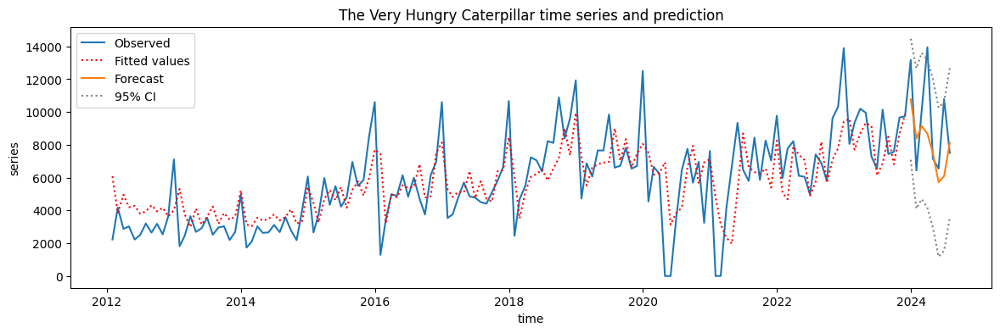

In [ ]:
caterpillar_model, predictions = arima_predict_and_visualise(caterpillar_model, caterpillar_monthly_train, test_time_steps, caterpillar_monthly_df, 'The Very Hungry Caterpillar')

The predicted values do not closely mirror that of the observed values. The model could be fine tuned by stabilising the residuals as the predictions seem to fairly capture the trend and seasonality components. However the 95% confidence interval covers the observed values.

In [ ]:
mae = mean_absolute_error(caterpillar_monthly_df_test, predictions[0])
mape = mean_absolute_percentage_error(caterpillar_monthly_df_test, predictions[0])

print("mae", mae)
print("mape", mape)

mae 2133.282630544194
mape 0.20622803900125103


Text(0, 0.5, 'Frequency')

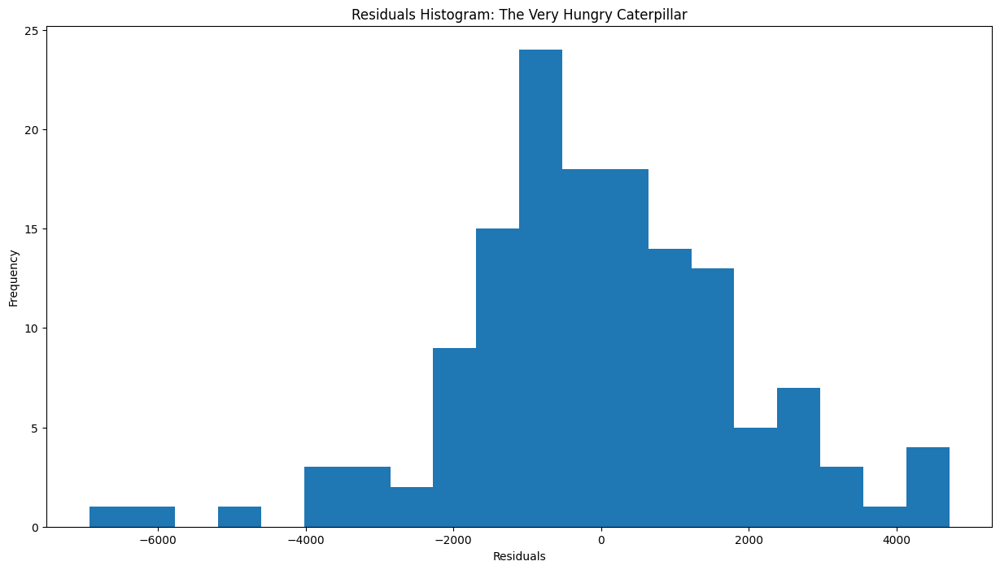

In [ ]:
# Plot the histogram of the residuals.
plt.hist(caterpillar_model.resid()[1:], bins=20)
plt.title('Residuals Histogram: The Very Hungry Caterpillar')
plt.xlabel('Residuals')
plt.ylabel('Frequency')

The p value of JB test is low indicating that the residuals are not normally distributed whereas the histogram looks normally distributed.

# Weekly and Monthly time series comparison:

Based on MAPE, the Weekly and the Monthly predictions by Auto ARIMA and XGBoost performed roughly the same for both the books. The models executed much quicker with the Monthly data as there are less data points.

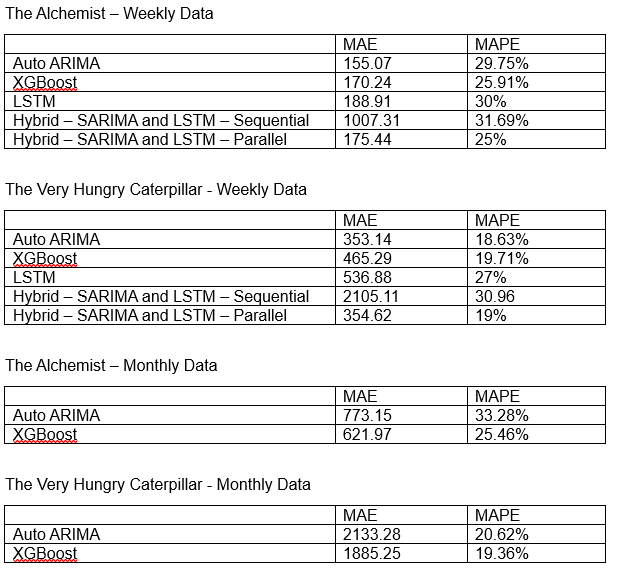
